In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1513, done.
remote: Counting objects: 100% (286/286), done.
remote: Compressing objects: 100% (192/192), done.
remote: Total 1513 (delta 196), reused 174 (delta 92), pack-reused 1227
Receiving objects: 100% (1513/1513), 60.48 MiB | 11.44 MiB/s, done.
Resolving deltas: 100% (1080/1080), done.


In [ ]:
import torch
torch.backends.cudnn.benchmark = True

In [ ]:
from PFNExperiments.LinearRegression.GenerativeModels.GenerateData import GenerateData, check_data, check_and_plot_data
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_ExamplesIntercept import make_lm_program_ig_intercept, make_lm_program_ig_intercept_batched

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.LinearRegression.GenerativeModels.Quantizer import Quantizer
from PFNExperiments.LinearRegression.Models.Transformer_CNF import TransformerCNFConditionalDecoder
from PFNExperiments.Training.Trainer import Trainer, batch_to_model_lm, visualize_training_results
from PFNExperiments.Training.Losses import MSELoss_unsqueezed, nll_loss_full_gaussian
from PFNExperiments.Training.EvalMetrics import mean_squared_error_torch_avg, mae_torch_avg, r2_score_torch_avg
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian, ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.AugmentLoss import add_l2_loss_nll_loss
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist

from PFNExperiments.Training.FlowMatching.CFMLossOT2 import CFMLossOT2

from PFNExperiments.Evaluation.ComparePosteriorSamples import compare_all_metrics, marginal_plots_hist_parallel, marginal_plots_kde_together
from PFNExperiments.LinearRegression.Evaluation.CompareModels import ModelComparison
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF import ModelToPosteriorCNF
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC

from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference, make_guide_program_gamma_gamma

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM

from PFNExperiments.Training.TrainerCurriculumCNF import TrainerCurriculumCNF

from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.Training.FlowMatching.Couplings import MiniBatchOTCoupling

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import make_simulate_X_by_loading_split
from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform_discretized3

from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP

from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL

from tqdm import tqdm

In [ ]:
N = 50
P = 5
BATCH_SIZE = 1024
N_EPOCHS = 150
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InverseGamma_intercept_tabpfn_v3_normalize_nllv"

#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0
tau_beta0 = 3.0

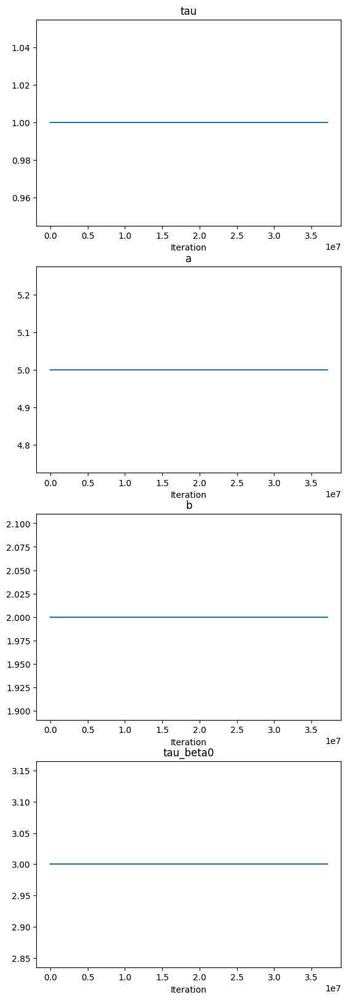

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),
    ("tau_beta0", curriculum.constant_scheduler(tau_beta0)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
data_paths = [
    "/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_1_000_000_v3.pt",
    "/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_2_000_000_v4.pt",
    "/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_2_000_000_v5.pt",
    "/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_2_000_000_v6.pt",
    "/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_2_000_000_v7.pt",
    #"/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_2_000_000_v8.pt",
    #"/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_2_000_000_v9.pt",
]


with open("/content/drive/MyDrive/PFN_Experiments/DataX/TabPFN_Prior/X_tabpfn_n50_p5_1_000_000_v3.pt", "rb") as f:
  X_tabpfn = torch.load(f)

final_res_ten = torch.zeros(X_tabpfn.shape)

for data_path in tqdm(data_paths):
  with open(data_path, "rb") as f:
    X_tabpfn_new = torch.load(f)

  final_res_ten = torch.cat((final_res_ten, X_tabpfn_new), dim=0)


X_tabpfn = final_res_ten

100%|██████████| 5/5 [00:43<00:00,  8.64s/it]


In [ ]:
X_tabpfn.shape

stds = X_tabpfn.std(dim=1)
means = X_tabpfn.mean(dim=1)

X_tabpfn = (X_tabpfn - means.unsqueeze(1))/(stds.unsqueeze(1) + 1e-8)

# remove nans
# count nans
nan_count = torch.isnan(X_tabpfn).sum()
print(f"nan count: {nan_count}")
X_tabpfn[torch.isnan(X_tabpfn)] = 0.0

nan count: 500


In [ ]:
generate_X_tabpfn_train, generate_X_tabpfn_val, generate_X_tabpfn_test  = make_simulate_X_by_loading_split(X_tabpfn)

In [ ]:
?GenerateDataCurriculumCFM

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_ig_intercept_batched,
    curriculum= curriculum,
    #pprogram_covariates = generate_X_tabpfn_train,
    pprogram_covariates_train = generate_X_tabpfn_train,
    pprogram_covariates_val = generate_X_tabpfn_val,
    pprogram_covariates_test = generate_X_tabpfn_test,

)

In [ ]:
next(iter(data_generator.make_dataloaders_for_epoch_dynamic(n = N, p = P)[0])).keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'beta0', 'time', 'base_sample_beta'])

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 102.23it/s]
/content/PFNExperiments/LinearRegression/GenerativeModels/GenerateData.py:305: UserWarning: var(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at ../aten/src/ATen/native/ReduceOps.cpp:1807.)
  mean_variances[key] = torch.mean(torch.var(stacked_data[key], dim=1), dim = 0)


{'X': {'mean': tensor(1.1921e-10), 'variance': tensor(0.8778), 'min': tensor(-6.0168), 'max': tensor(6.9296), 'mean_mean': tensor([-8.3193e-11, -8.0938e-11,  3.7855e-10,  8.6246e-11, -2.2256e-10]), 'variance_mean': tensor([0.8957, 0.8957, 0.8957, 0.8957, 0.8957]), 'min_mean': None, 'max_mean': None}, 'y': {'mean': tensor(0.0875), 'variance': tensor(14.1979), 'min': tensor(-18.1047), 'max': tensor(20.0526), 'mean_mean': tensor(0.0875), 'variance_mean': tensor(4.8709), 'min_mean': None, 'max_mean': None}, 'beta': {'mean': tensor([ 0.0886,  0.0208, -0.0127, -0.0155,  0.0034,  0.0060]), 'variance': tensor([9.4074, 1.0269, 1.0385, 0.9795, 1.0328, 0.9562]), 'min': tensor([-12.2532,  -3.3262,  -3.2507,  -3.0025,  -3.4015,  -3.5609]), 'max': tensor([9.8659, 3.6112, 3.9113, 3.2577, 3.1709, 3.6893]), 'mean_mean': tensor(0.0151), 'variance_mean': tensor(2.4099), 'min_mean': None, 'max_mean': None}}
Statistics for sigma_squared:
Mean: tensor([0.5058])
Variance: tensor([0.0848])
Min: tensor([0.1362

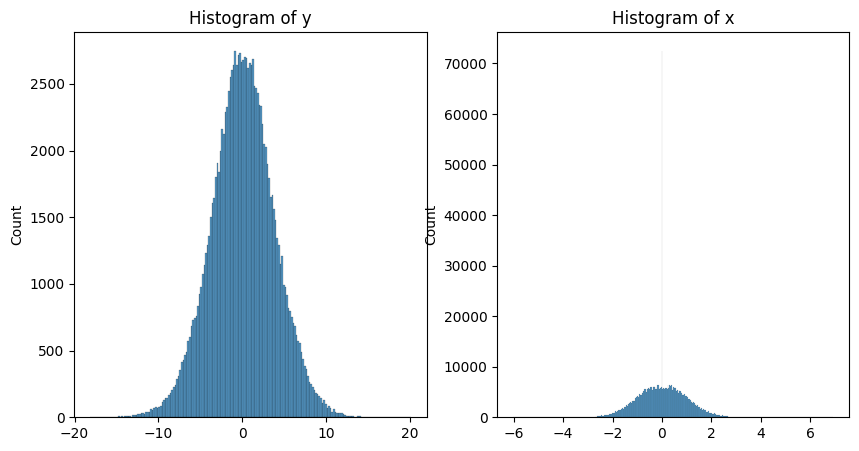

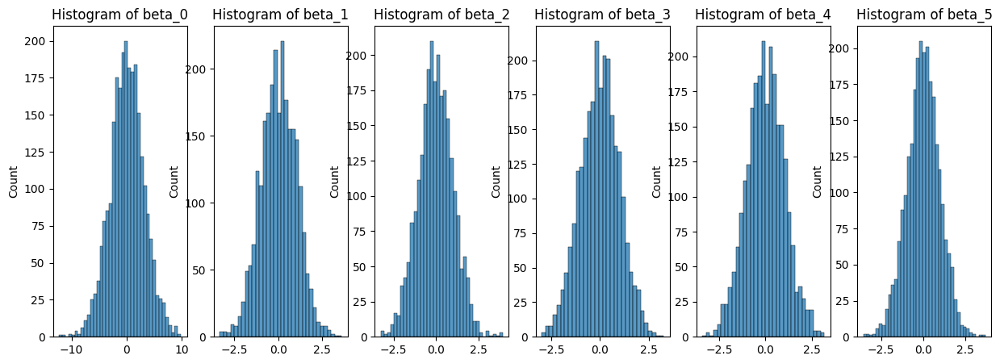

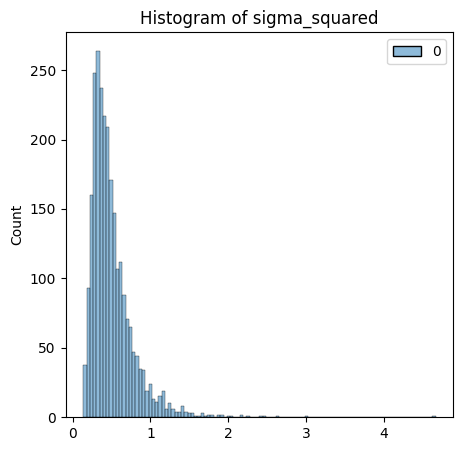

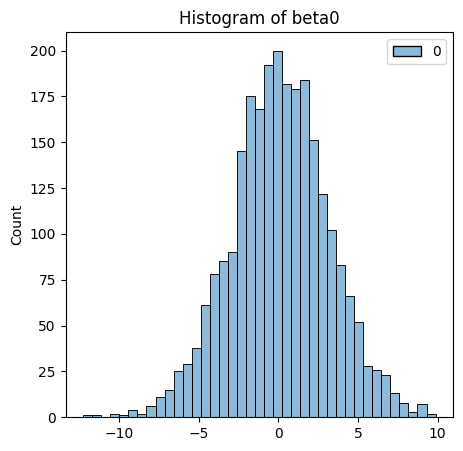

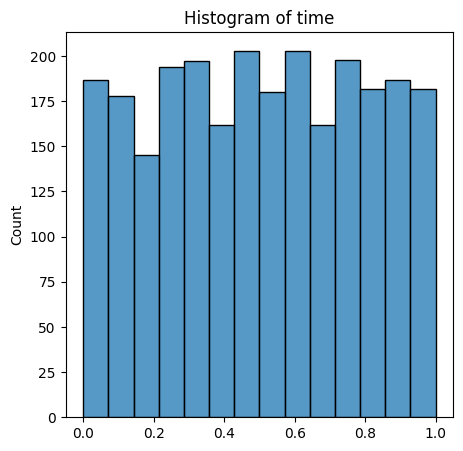

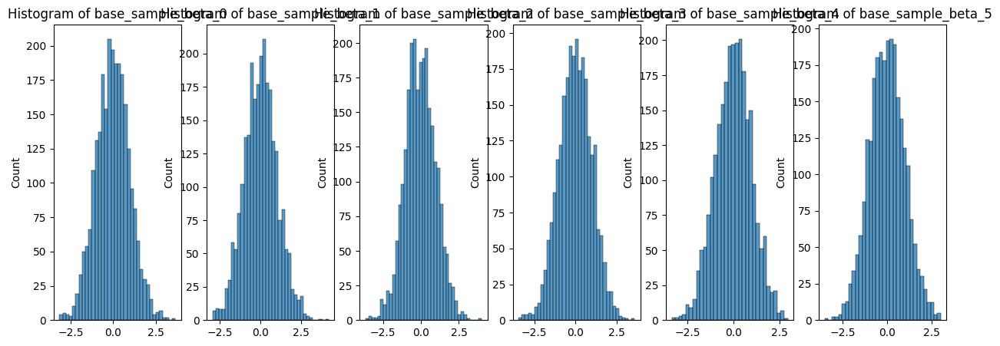

####################################################################################################
Epoch 149


100%|██████████| 10/10 [00:00<00:00, 98.23it/s]

{'X': {'mean': tensor(8.9407e-11), 'variance': tensor(0.8716), 'min': tensor(-6.9296), 'max': tensor(6.9296), 'mean_mean': tensor([ 2.8672e-10, -1.6560e-11,  3.8129e-10,  1.7122e-10, -7.5815e-11]), 'variance_mean': tensor([0.8902, 0.8902, 0.8887, 0.8895, 0.8887]), 'min_mean': None, 'max_mean': None}, 'y': {'mean': tensor(-0.0293), 'variance': tensor(13.6444), 'min': tensor(-18.2718), 'max': tensor(22.0988), 'mean_mean': tensor(-0.0293), 'variance_mean': tensor(4.7870), 'min_mean': None, 'max_mean': None}, 'beta': {'mean': tensor([-0.0316,  0.0280,  0.0254,  0.0054, -0.0044,  0.0470]), 'variance': tensor([8.9569, 0.9863, 0.9888, 1.0267, 1.0481, 1.0183]), 'min': tensor([-10.2300,  -3.6388,  -3.2254,  -3.4400,  -4.0074,  -3.2423]), 'max': tensor([9.8660, 3.5748, 3.3667, 3.5052, 3.2673, 3.8533]), 'mean_mean': tensor(0.0116), 'variance_mean': tensor(2.3429), 'min_mean': None, 'max_mean': None}}
Statistics for sigma_squared:
Mean: tensor([0.4953])
Variance: tensor([0.0865])
Min: tensor([0.12


/content/PFNExperiments/LinearRegression/GenerativeModels/GenerateData.py:305: UserWarning: var(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at ../aten/src/ATen/native/ReduceOps.cpp:1807.)
  mean_variances[key] = torch.mean(torch.var(stacked_data[key], dim=1), dim = 0)


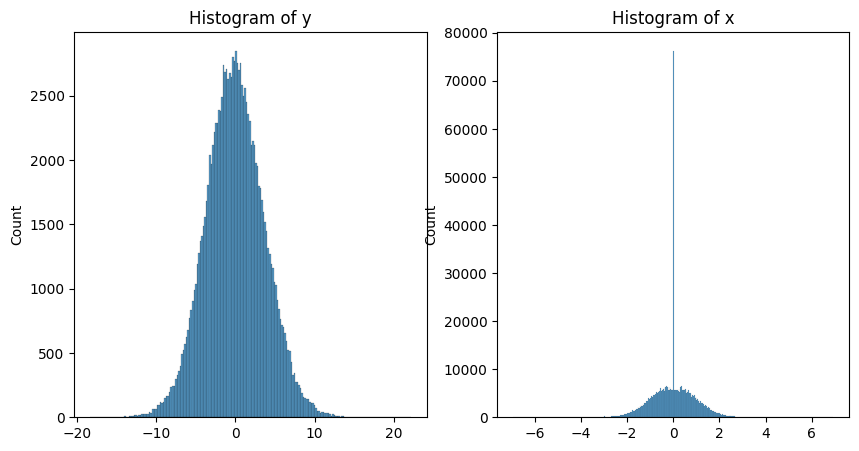

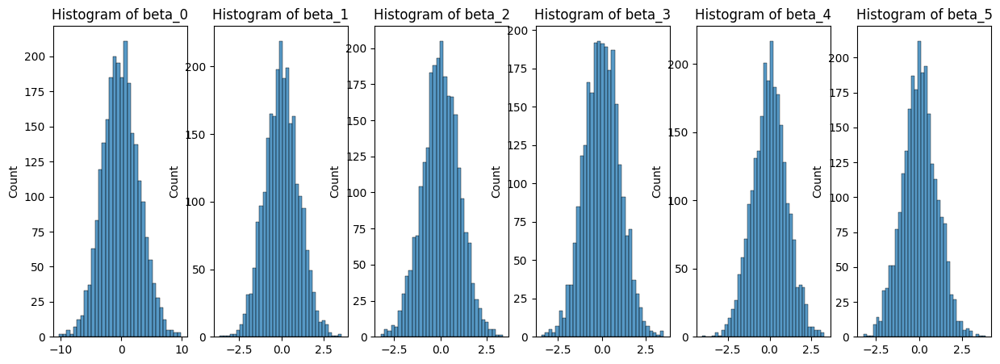

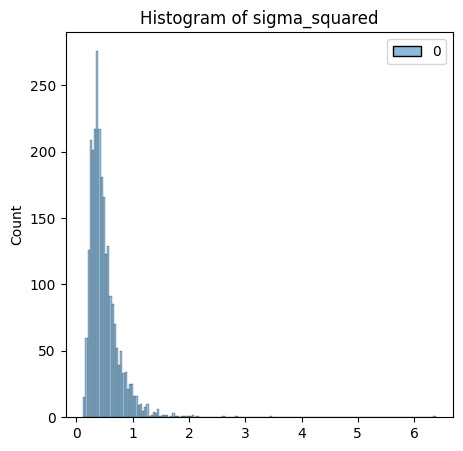

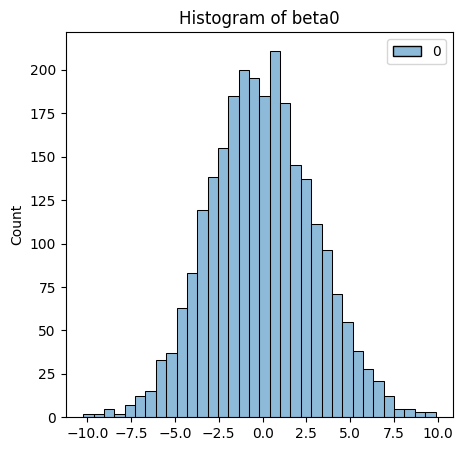

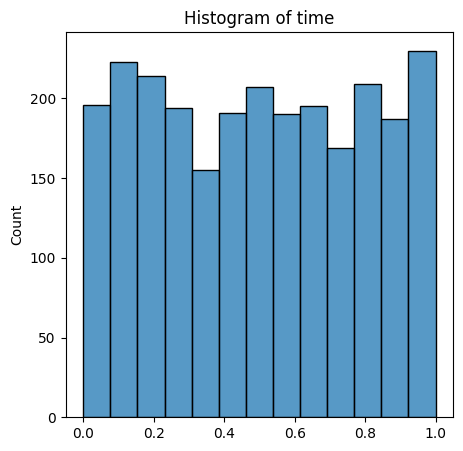

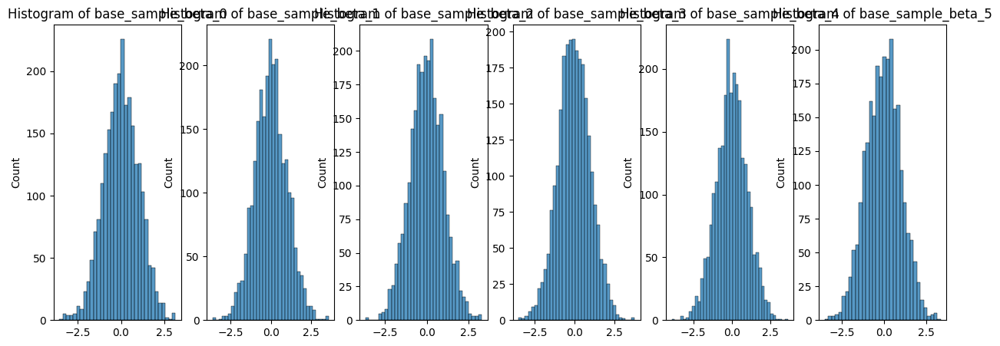

[{'X': {'mean': tensor(1.1921e-10),
   'variance': tensor(0.8778),
   'min': tensor(-6.0168),
   'max': tensor(6.9296),
   'mean_mean': tensor([-8.3193e-11, -8.0938e-11,  3.7855e-10,  8.6246e-11, -2.2256e-10]),
   'variance_mean': tensor([0.8957, 0.8957, 0.8957, 0.8957, 0.8957]),
   'min_mean': None,
   'max_mean': None},
  'y': {'mean': tensor(0.0875),
   'variance': tensor(14.1979),
   'min': tensor(-18.1047),
   'max': tensor(20.0526),
   'mean_mean': tensor(0.0875),
   'variance_mean': tensor(4.8709),
   'min_mean': None,
   'max_mean': None},
  'beta': {'mean': tensor([ 0.0886,  0.0208, -0.0127, -0.0155,  0.0034,  0.0060]),
   'variance': tensor([9.4074, 1.0269, 1.0385, 0.9795, 1.0328, 0.9562]),
   'min': tensor([-12.2532,  -3.3262,  -3.2507,  -3.0025,  -3.4015,  -3.5609]),
   'max': tensor([9.8659, 3.6112, 3.9113, 3.2577, 3.1709, 3.6893]),
   'mean_mean': tensor(0.0151),
   'variance_mean': tensor(2.4099),
   'min_mean': None,
   'max_mean': None}},
 {'X': {'mean': tensor(8.9407e

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = P,
    n = N,
    used_batch_samples = 10
)

In [ ]:
#data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 74956800 and 37478400 respectively


In [ ]:
sample_batch = next(iter(epoch_loader[0][0]))

In [ ]:
sample_batch.keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'beta0', 'time', 'base_sample_beta'])

In [ ]:
sample_batch["x"][0, :, 1].mean()

tensor(-2.3842e-08)

In [ ]:

model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 384,
    n_heads= 6,
    dim_feedforward=384*2,
    dropout_rate = 0.1,
    n_layers=7,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[P+1, (P+1)*(P+1), P+1]
)

encoder_to_process_encoder_output = torch.nn.TransformerEncoder(
    torch.nn.TransformerEncoderLayer(d_model=encoder.d_model,
                                     nhead=encoder.n_heads,
                                     dim_feedforward = encoder.dim_feedforward,
                                     batch_first = True,
                                     norm_first = True),
    num_layers=4)


#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples


mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)

model_to_process_encoder_output_for_decoder = TransformerPlusNLP(
    transformer_encoder = encoder_to_process_encoder_output,
    mlp = mlp_to_process_encoder_output
)


mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P+1,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 4,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P+1,
    n_hidden_units = 512,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
    encoder = encoder,
    model_posterior = model_posterior,
    model_to_process_encoder_output = model_to_process_encoder_output_for_decoder,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)



/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'4.93e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-6
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 1.0,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-3,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor= 1e3)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0,
    stop_gradients_from_FM_to_encoder = True
)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_08_08_17_47_53")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_08_13_09_55_15'

In [ ]:
try:
  trainer.load_best_model()
except:
  print("Could not load model")
  pass

Could not load model


In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


{'loss_mean': 294.2032775878906,
 'loss_median': 293.4674072265625,
 'loss_std': 7.216701984405518,
 'loss_FM_mean': 2.287555694580078,
 'loss_FM_median': 2.279071807861328,
 'loss_FM_std': 0.05560484901070595,
 'loss_NLL_mean': 294.2032775878906,
 'loss_NLL_median': 293.4674072265625,
 'loss_NLL_std': 7.216701984405518}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 0


100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 0:
Training: {'loss_mean': 11.087570190429688, 'loss_median': 10.378639221191406, 'loss_std': 2.033644437789917, 'loss_FM_mean': 1.4421095848083496, 'loss_FM_median': 1.4494435787200928, 'loss_FM_std': 0.11321501433849335, 'loss_NLL_mean': 11.087570190429688, 'loss_NLL_median': 10.378639221191406, 'loss_NLL_std': 2.033644437789917}
Validation: {'loss_mean': 7.9125800132751465, 'loss_median': 7.917092800140381, 'loss_std': 0.07150357216596603, 'loss_FM_mean': 0.6892285346984863, 'loss_FM_median': 0.6780290603637695, 'loss_FM_std': 0.06166268512606621, 'loss_NLL_mean': 7.9125800132751465, 'loss_NLL_median': 7.917092800140381, 'loss_NLL_std': 0.07150357216596603}
Validation curriculum: {'loss_mean': 7.892873287200928, 'loss_median': 7.896265029907227, 'loss_std': 0.07859794050455093, 'loss_FM_mean': 0.6706891059875488, 'loss_FM_median': 0.6716445684432983, 'loss_FM_std': 0.02282552793622017, 'loss_NLL_mean': 7.892873287200928, 'loss_NLL_median': 7.896265029907227, 'loss_NLL_std': 0.

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 1:
Training: {'loss_mean': 9.01298713684082, 'loss_median': 9.019914627075195, 'loss_std': 0.28248730301856995, 'loss_FM_mean': 1.2955703735351562, 'loss_FM_median': 1.2964452505111694, 'loss_FM_std': 0.06646473705768585, 'loss_NLL_mean': 9.01298713684082, 'loss_NLL_median': 9.019914627075195, 'loss_NLL_std': 0.28248730301856995}
Validation: {'loss_mean': 6.779047966003418, 'loss_median': 6.77264404296875, 'loss_std': 0.0799810141324997, 'loss_FM_mean': 0.6265318989753723, 'loss_FM_median': 0.5880004167556763, 'loss_FM_std': 0.20759660005569458, 'loss_NLL_mean': 6.779047966003418, 'loss_NLL_median': 6.77264404296875, 'loss_NLL_std': 0.0799810141324997}
Validation curriculum: {'loss_mean': 6.755108833312988, 'loss_median': 6.756548881530762, 'loss_std': 0.0824926570057869, 'loss_FM_mean': 0.6134248971939087, 'loss_FM_median': 0.5867251753807068, 'loss_FM_std': 0.12849976122379303, 'loss_NLL_mean': 6.755108833312988, 'loss_NLL_median': 6.756548881530762, 'loss_NLL_std': 0.082492657

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 2:
Training: {'loss_mean': 8.220658302307129, 'loss_median': 8.233268737792969, 'loss_std': 0.23200881481170654, 'loss_FM_mean': 1.1570043563842773, 'loss_FM_median': 1.1542267799377441, 'loss_FM_std': 0.04803597182035446, 'loss_NLL_mean': 8.220658302307129, 'loss_NLL_median': 8.233268737792969, 'loss_NLL_std': 0.23200881481170654}
Validation: {'loss_mean': 6.188137054443359, 'loss_median': 6.193769454956055, 'loss_std': 0.11076798290014267, 'loss_FM_mean': 0.5443934202194214, 'loss_FM_median': 0.5406690835952759, 'loss_FM_std': 0.028558405116200447, 'loss_NLL_mean': 6.188137054443359, 'loss_NLL_median': 6.193769454956055, 'loss_NLL_std': 0.11076798290014267}
Validation curriculum: {'loss_mean': 6.178153991699219, 'loss_median': 6.197049617767334, 'loss_std': 0.13349126279354095, 'loss_FM_mean': 0.5433530211448669, 'loss_FM_median': 0.5381841063499451, 'loss_FM_std': 0.034274350851774216, 'loss_NLL_mean': 6.178153991699219, 'loss_NLL_median': 6.197049617767334, 'loss_NLL_std': 0.

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 3:
Training: {'loss_mean': 7.525174140930176, 'loss_median': 7.528806209564209, 'loss_std': 0.24172604084014893, 'loss_FM_mean': 1.083561897277832, 'loss_FM_median': 1.0785160064697266, 'loss_FM_std': 0.0487627312541008, 'loss_NLL_mean': 7.525174140930176, 'loss_NLL_median': 7.528806209564209, 'loss_NLL_std': 0.24172604084014893}
Validation: {'loss_mean': 5.2944464683532715, 'loss_median': 5.280825614929199, 'loss_std': 0.11721640825271606, 'loss_FM_mean': 0.5469685196876526, 'loss_FM_median': 0.5415850877761841, 'loss_FM_std': 0.02570626325905323, 'loss_NLL_mean': 5.2944464683532715, 'loss_NLL_median': 5.280825614929199, 'loss_NLL_std': 0.11721640825271606}
Validation curriculum: {'loss_mean': 5.3219709396362305, 'loss_median': 5.321989059448242, 'loss_std': 0.09218080341815948, 'loss_FM_mean': 0.5902648568153381, 'loss_FM_median': 0.540416419506073, 'loss_FM_std': 0.2557410001754761, 'loss_NLL_mean': 5.3219709396362305, 'loss_NLL_median': 5.321989059448242, 'loss_NLL_std': 0.09

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 4:
Training: {'loss_mean': 6.741152286529541, 'loss_median': 6.7455339431762695, 'loss_std': 0.2676020562648773, 'loss_FM_mean': 1.083986520767212, 'loss_FM_median': 1.078998327255249, 'loss_FM_std': 0.06343955546617508, 'loss_NLL_mean': 6.741152286529541, 'loss_NLL_median': 6.7455339431762695, 'loss_NLL_std': 0.2676020562648773}
Validation: {'loss_mean': 4.978641510009766, 'loss_median': 4.951027870178223, 'loss_std': 0.10251691192388535, 'loss_FM_mean': 0.555750846862793, 'loss_FM_median': 0.5561099052429199, 'loss_FM_std': 0.030433502048254013, 'loss_NLL_mean': 4.978641510009766, 'loss_NLL_median': 4.951027870178223, 'loss_NLL_std': 0.10251691192388535}
Validation curriculum: {'loss_mean': 4.9637603759765625, 'loss_median': 4.970785140991211, 'loss_std': 0.101744145154953, 'loss_FM_mean': 0.5641434788703918, 'loss_FM_median': 0.5507102012634277, 'loss_FM_std': 0.03745032101869583, 'loss_NLL_mean': 4.9637603759765625, 'loss_NLL_median': 4.970785140991211, 'loss_NLL_std': 0.1017

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 5:
Training: {'loss_mean': 5.818215847015381, 'loss_median': 5.8121657371521, 'loss_std': 0.30901288986206055, 'loss_FM_mean': 1.187430739402771, 'loss_FM_median': 1.1628308296203613, 'loss_FM_std': 0.12181425094604492, 'loss_NLL_mean': 5.818215847015381, 'loss_NLL_median': 5.8121657371521, 'loss_NLL_std': 0.30901288986206055}
Validation: {'loss_mean': 4.042327404022217, 'loss_median': 4.043315410614014, 'loss_std': 0.11186624318361282, 'loss_FM_mean': 0.5968779921531677, 'loss_FM_median': 0.5746508836746216, 'loss_FM_std': 0.16988526284694672, 'loss_NLL_mean': 4.042327404022217, 'loss_NLL_median': 4.043315410614014, 'loss_NLL_std': 0.11186624318361282}
Validation curriculum: {'loss_mean': 4.049559116363525, 'loss_median': 4.040738582611084, 'loss_std': 0.08638665825128555, 'loss_FM_mean': 0.5775256156921387, 'loss_FM_median': 0.5837662816047668, 'loss_FM_std': 0.049778521060943604, 'loss_NLL_mean': 4.049559116363525, 'loss_NLL_median': 4.040738582611084, 'loss_NLL_std': 0.086386

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 6:
Training: {'loss_mean': 4.908545970916748, 'loss_median': 4.91208553314209, 'loss_std': 0.28943556547164917, 'loss_FM_mean': 1.4106594324111938, 'loss_FM_median': 1.3593780994415283, 'loss_FM_std': 0.265542209148407, 'loss_NLL_mean': 4.908545970916748, 'loss_NLL_median': 4.91208553314209, 'loss_NLL_std': 0.28943556547164917}
Validation: {'loss_mean': 3.4544689655303955, 'loss_median': 3.467690944671631, 'loss_std': 0.11011446267366409, 'loss_FM_mean': 0.5862376689910889, 'loss_FM_median': 0.49007314443588257, 'loss_FM_std': 0.5071635842323303, 'loss_NLL_mean': 3.4544689655303955, 'loss_NLL_median': 3.467690944671631, 'loss_NLL_std': 0.11011446267366409}
Validation curriculum: {'loss_mean': 3.4632632732391357, 'loss_median': 3.472822666168213, 'loss_std': 0.10121022164821625, 'loss_FM_mean': 0.6239092946052551, 'loss_FM_median': 0.5127539038658142, 'loss_FM_std': 0.5815003514289856, 'loss_NLL_mean': 3.4632632732391357, 'loss_NLL_median': 3.472822666168213, 'loss_NLL_std': 0.101

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 7:
Training: {'loss_mean': 4.2598443031311035, 'loss_median': 4.252423286437988, 'loss_std': 0.26127317547798157, 'loss_FM_mean': 1.5678623914718628, 'loss_FM_median': 1.5204761028289795, 'loss_FM_std': 0.3101446330547333, 'loss_NLL_mean': 4.2598443031311035, 'loss_NLL_median': 4.252423286437988, 'loss_NLL_std': 0.26127317547798157}
Validation: {'loss_mean': 2.9027493000030518, 'loss_median': 2.908132553100586, 'loss_std': 0.11794083565473557, 'loss_FM_mean': 0.5109314322471619, 'loss_FM_median': 0.5109173655509949, 'loss_FM_std': 0.0630776435136795, 'loss_NLL_mean': 2.9027493000030518, 'loss_NLL_median': 2.908132553100586, 'loss_NLL_std': 0.11794083565473557}
Validation curriculum: {'loss_mean': 2.918787956237793, 'loss_median': 2.9255828857421875, 'loss_std': 0.12317052483558655, 'loss_FM_mean': 0.5215470790863037, 'loss_FM_median': 0.5150917768478394, 'loss_FM_std': 0.062144022434949875, 'loss_NLL_mean': 2.918787956237793, 'loss_NLL_median': 2.9255828857421875, 'loss_NLL_std':

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 8:
Training: {'loss_mean': 3.625113010406494, 'loss_median': 3.6280789375305176, 'loss_std': 0.2529292702674866, 'loss_FM_mean': 1.7886468172073364, 'loss_FM_median': 1.7207040786743164, 'loss_FM_std': 0.3657195270061493, 'loss_NLL_mean': 3.625113010406494, 'loss_NLL_median': 3.6280789375305176, 'loss_NLL_std': 0.2529292702674866}
Validation: {'loss_mean': 2.347350597381592, 'loss_median': 2.335275173187256, 'loss_std': 0.11896177381277084, 'loss_FM_mean': 0.49487951397895813, 'loss_FM_median': 0.47577470541000366, 'loss_FM_std': 0.08341041207313538, 'loss_NLL_mean': 2.347350597381592, 'loss_NLL_median': 2.335275173187256, 'loss_NLL_std': 0.11896177381277084}
Validation curriculum: {'loss_mean': 2.3441689014434814, 'loss_median': 2.347714424133301, 'loss_std': 0.12992319464683533, 'loss_FM_mean': 0.47791585326194763, 'loss_FM_median': 0.4766993522644043, 'loss_FM_std': 0.05910557880997658, 'loss_NLL_mean': 2.3441689014434814, 'loss_NLL_median': 2.347714424133301, 'loss_NLL_std': 

100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 9:
Training: {'loss_mean': 3.0864903926849365, 'loss_median': 3.0592989921569824, 'loss_std': 0.290816068649292, 'loss_FM_mean': 1.9383221864700317, 'loss_FM_median': 1.8603013753890991, 'loss_FM_std': 0.5308268666267395, 'loss_NLL_mean': 3.0864903926849365, 'loss_NLL_median': 3.0592989921569824, 'loss_NLL_std': 0.290816068649292}
Validation: {'loss_mean': 1.6331406831741333, 'loss_median': 1.6292035579681396, 'loss_std': 0.13323558866977692, 'loss_FM_mean': 0.5723518133163452, 'loss_FM_median': 0.5664339661598206, 'loss_FM_std': 0.10938519239425659, 'loss_NLL_mean': 1.6331406831741333, 'loss_NLL_median': 1.6292035579681396, 'loss_NLL_std': 0.13323558866977692}
Validation curriculum: {'loss_mean': 1.6785147190093994, 'loss_median': 1.6857273578643799, 'loss_std': 0.11960139870643616, 'loss_FM_mean': 0.593494713306427, 'loss_FM_median': 0.5602307319641113, 'loss_FM_std': 0.13781483471393585, 'loss_NLL_mean': 1.6785147190093994, 'loss_NLL_median': 1.6857273578643799, 'loss_NLL_std'

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 10:
Training: {'loss_mean': 2.564314126968384, 'loss_median': 2.537308692932129, 'loss_std': 0.30641427636146545, 'loss_FM_mean': 1.9700714349746704, 'loss_FM_median': 1.8880507946014404, 'loss_FM_std': 0.461410254240036, 'loss_NLL_mean': 2.564314126968384, 'loss_NLL_median': 2.537308692932129, 'loss_NLL_std': 0.30641427636146545}
Validation: {'loss_mean': 0.9516187310218811, 'loss_median': 0.9636446237564087, 'loss_std': 0.15763777494430542, 'loss_FM_mean': 0.42811986804008484, 'loss_FM_median': 0.4175637662410736, 'loss_FM_std': 0.08011924475431442, 'loss_NLL_mean': 0.9516187310218811, 'loss_NLL_median': 0.9636446237564087, 'loss_NLL_std': 0.15763777494430542}
Validation curriculum: {'loss_mean': 0.9218234419822693, 'loss_median': 0.9448422789573669, 'loss_std': 0.1198398768901825, 'loss_FM_mean': 0.41095566749572754, 'loss_FM_median': 0.400687038898468, 'loss_FM_std': 0.08106118440628052, 'loss_NLL_mean': 0.9218234419822693, 'loss_NLL_median': 0.9448422789573669, 'loss_NLL_std

100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 11:
Training: {'loss_mean': 2.23618221282959, 'loss_median': 2.2092323303222656, 'loss_std': 0.2717626690864563, 'loss_FM_mean': 1.9193134307861328, 'loss_FM_median': 1.7852863073349, 'loss_FM_std': 0.5258427262306213, 'loss_NLL_mean': 2.23618221282959, 'loss_NLL_median': 2.2092323303222656, 'loss_NLL_std': 0.2717626690864563}
Validation: {'loss_mean': 0.7992957234382629, 'loss_median': 0.8077343106269836, 'loss_std': 0.1296699196100235, 'loss_FM_mean': 0.7041058540344238, 'loss_FM_median': 0.717371940612793, 'loss_FM_std': 0.1883668303489685, 'loss_NLL_mean': 0.7992957234382629, 'loss_NLL_median': 0.8077343106269836, 'loss_NLL_std': 0.1296699196100235}
Validation curriculum: {'loss_mean': 0.8249736428260803, 'loss_median': 0.8233915567398071, 'loss_std': 0.1400112360715866, 'loss_FM_mean': 0.6843798160552979, 'loss_FM_median': 0.6861969828605652, 'loss_FM_std': 0.16247589886188507, 'loss_NLL_mean': 0.8249736428260803, 'loss_NLL_median': 0.8233915567398071, 'loss_NLL_std': 0.1400

100%|██████████| 49/49 [00:24<00:00,  2.00it/s]


Epoch 12:
Training: {'loss_mean': 1.9195793867111206, 'loss_median': 1.8795217275619507, 'loss_std': 0.26163172721862793, 'loss_FM_mean': 2.1386213302612305, 'loss_FM_median': 2.007608413696289, 'loss_FM_std': 0.6669028997421265, 'loss_NLL_mean': 1.9195793867111206, 'loss_NLL_median': 1.8795217275619507, 'loss_NLL_std': 0.26163172721862793}
Validation: {'loss_mean': 0.44448357820510864, 'loss_median': 0.4511350691318512, 'loss_std': 0.1314745843410492, 'loss_FM_mean': 0.6189209222793579, 'loss_FM_median': 0.5776683688163757, 'loss_FM_std': 0.20732077956199646, 'loss_NLL_mean': 0.44448357820510864, 'loss_NLL_median': 0.4511350691318512, 'loss_NLL_std': 0.1314745843410492}
Validation curriculum: {'loss_mean': 0.37770864367485046, 'loss_median': 0.38108766078948975, 'loss_std': 0.1420707106590271, 'loss_FM_mean': 0.6379022598266602, 'loss_FM_median': 0.5968019366264343, 'loss_FM_std': 0.16963434219360352, 'loss_NLL_mean': 0.37770864367485046, 'loss_NLL_median': 0.38108766078948975, 'loss_

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 13:
Training: {'loss_mean': 1.676823616027832, 'loss_median': 1.625388503074646, 'loss_std': 0.30168449878692627, 'loss_FM_mean': 2.2589149475097656, 'loss_FM_median': 2.14101505279541, 'loss_FM_std': 0.6584632396697998, 'loss_NLL_mean': 1.676823616027832, 'loss_NLL_median': 1.625388503074646, 'loss_NLL_std': 0.30168449878692627}
Validation: {'loss_mean': 0.5793977975845337, 'loss_median': 0.5748330354690552, 'loss_std': 0.13337112963199615, 'loss_FM_mean': 0.5567840933799744, 'loss_FM_median': 0.5039600729942322, 'loss_FM_std': 0.21192525327205658, 'loss_NLL_mean': 0.5793977975845337, 'loss_NLL_median': 0.5748330354690552, 'loss_NLL_std': 0.13337112963199615}
Validation curriculum: {'loss_mean': 0.5864524841308594, 'loss_median': 0.6004200577735901, 'loss_std': 0.14080478250980377, 'loss_FM_mean': 0.5916662812232971, 'loss_FM_median': 0.5188106894493103, 'loss_FM_std': 0.23416921496391296, 'loss_NLL_mean': 0.5864524841308594, 'loss_NLL_median': 0.6004200577735901, 'loss_NLL_std'

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 14:
Training: {'loss_mean': 1.465901494026184, 'loss_median': 1.442333698272705, 'loss_std': 0.2777898609638214, 'loss_FM_mean': 2.252636194229126, 'loss_FM_median': 2.1689467430114746, 'loss_FM_std': 0.6282270550727844, 'loss_NLL_mean': 1.465901494026184, 'loss_NLL_median': 1.442333698272705, 'loss_NLL_std': 0.2777898609638214}
Validation: {'loss_mean': 0.22962908446788788, 'loss_median': 0.2203657180070877, 'loss_std': 0.1822437047958374, 'loss_FM_mean': 0.48445042967796326, 'loss_FM_median': 0.44883450865745544, 'loss_FM_std': 0.15011665225028992, 'loss_NLL_mean': 0.22962908446788788, 'loss_NLL_median': 0.2203657180070877, 'loss_NLL_std': 0.1822437047958374}
Validation curriculum: {'loss_mean': 0.18141765892505646, 'loss_median': 0.18594852089881897, 'loss_std': 0.15872211754322052, 'loss_FM_mean': 0.4803648591041565, 'loss_FM_median': 0.4570881724357605, 'loss_FM_std': 0.1324325054883957, 'loss_NLL_mean': 0.18141765892505646, 'loss_NLL_median': 0.18594852089881897, 'loss_NLL_

100%|██████████| 49/49 [00:24<00:00,  1.98it/s]


Epoch 15:
Training: {'loss_mean': 1.3289793729782104, 'loss_median': 1.2748035192489624, 'loss_std': 0.3380798399448395, 'loss_FM_mean': 2.3107657432556152, 'loss_FM_median': 2.1123108863830566, 'loss_FM_std': 0.8988609910011292, 'loss_NLL_mean': 1.3289793729782104, 'loss_NLL_median': 1.2748035192489624, 'loss_NLL_std': 0.3380798399448395}
Validation: {'loss_mean': 0.034537240862846375, 'loss_median': 0.032050721347332, 'loss_std': 0.12986914813518524, 'loss_FM_mean': 0.5655002593994141, 'loss_FM_median': 0.5357412695884705, 'loss_FM_std': 0.1547599881887436, 'loss_NLL_mean': 0.034537240862846375, 'loss_NLL_median': 0.032050721347332, 'loss_NLL_std': 0.12986914813518524}
Validation curriculum: {'loss_mean': 0.02852850779891014, 'loss_median': 0.03722681105136871, 'loss_std': 0.13549764454364777, 'loss_FM_mean': 0.5366275310516357, 'loss_FM_median': 0.5057781934738159, 'loss_FM_std': 0.17067113518714905, 'loss_NLL_mean': 0.02852850779891014, 'loss_NLL_median': 0.03722681105136871, 'loss

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 16:
Training: {'loss_mean': 1.111768126487732, 'loss_median': 1.032911777496338, 'loss_std': 0.3180769681930542, 'loss_FM_mean': 2.3632166385650635, 'loss_FM_median': 2.2121338844299316, 'loss_FM_std': 0.7018703818321228, 'loss_NLL_mean': 1.111768126487732, 'loss_NLL_median': 1.032911777496338, 'loss_NLL_std': 0.3180769681930542}
Validation: {'loss_mean': -0.2123238444328308, 'loss_median': -0.2005113959312439, 'loss_std': 0.12922590970993042, 'loss_FM_mean': 1.1593204736709595, 'loss_FM_median': 1.1927766799926758, 'loss_FM_std': 0.3466591536998749, 'loss_NLL_mean': -0.2123238444328308, 'loss_NLL_median': -0.2005113959312439, 'loss_NLL_std': 0.12922590970993042}
Validation curriculum: {'loss_mean': -0.17189863324165344, 'loss_median': -0.1808386594057083, 'loss_std': 0.14395685493946075, 'loss_FM_mean': 1.2111597061157227, 'loss_FM_median': 1.1852405071258545, 'loss_FM_std': 0.34432297945022583, 'loss_NLL_mean': -0.17189863324165344, 'loss_NLL_median': -0.1808386594057083, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 17:
Training: {'loss_mean': 0.9093087911605835, 'loss_median': 0.8626222014427185, 'loss_std': 0.3398538827896118, 'loss_FM_mean': 2.3413591384887695, 'loss_FM_median': 2.182560443878174, 'loss_FM_std': 0.8490423560142517, 'loss_NLL_mean': 0.9093087911605835, 'loss_NLL_median': 0.8626222014427185, 'loss_NLL_std': 0.3398538827896118}
Validation: {'loss_mean': -0.24787825345993042, 'loss_median': -0.2364722341299057, 'loss_std': 0.132714182138443, 'loss_FM_mean': 0.7080544233322144, 'loss_FM_median': 0.6580219268798828, 'loss_FM_std': 0.16915613412857056, 'loss_NLL_mean': -0.24787825345993042, 'loss_NLL_median': -0.2364722341299057, 'loss_NLL_std': 0.132714182138443}
Validation curriculum: {'loss_mean': -0.3232528865337372, 'loss_median': -0.3513513505458832, 'loss_std': 0.1504116803407669, 'loss_FM_mean': 0.7000897526741028, 'loss_FM_median': 0.685166597366333, 'loss_FM_std': 0.1662560999393463, 'loss_NLL_mean': -0.3232528865337372, 'loss_NLL_median': -0.3513513505458832, 'loss_NL

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 18:
Training: {'loss_mean': 0.6484555006027222, 'loss_median': 0.6310048699378967, 'loss_std': 0.26448094844818115, 'loss_FM_mean': 2.172041177749634, 'loss_FM_median': 2.0776824951171875, 'loss_FM_std': 0.6160985231399536, 'loss_NLL_mean': 0.6484555006027222, 'loss_NLL_median': 0.6310048699378967, 'loss_NLL_std': 0.26448094844818115}
Validation: {'loss_mean': -0.6233856678009033, 'loss_median': -0.6088612675666809, 'loss_std': 0.11097116768360138, 'loss_FM_mean': 0.48572275042533875, 'loss_FM_median': 0.47741520404815674, 'loss_FM_std': 0.11607366055250168, 'loss_NLL_mean': -0.6233856678009033, 'loss_NLL_median': -0.6088612675666809, 'loss_NLL_std': 0.11097116768360138}
Validation curriculum: {'loss_mean': -0.6766102313995361, 'loss_median': -0.6629670858383179, 'loss_std': 0.12789879739284515, 'loss_FM_mean': 0.5112363696098328, 'loss_FM_median': 0.49802517890930176, 'loss_FM_std': 0.09883660823106766, 'loss_NLL_mean': -0.6766102313995361, 'loss_NLL_median': -0.6629670858383179

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 19:
Training: {'loss_mean': 0.48831677436828613, 'loss_median': 0.447049617767334, 'loss_std': 0.24776652455329895, 'loss_FM_mean': 2.1948516368865967, 'loss_FM_median': 1.9629361629486084, 'loss_FM_std': 0.8205991983413696, 'loss_NLL_mean': 0.48831677436828613, 'loss_NLL_median': 0.447049617767334, 'loss_NLL_std': 0.24776652455329895}
Validation: {'loss_mean': -0.7676849961280823, 'loss_median': -0.7842872142791748, 'loss_std': 0.16659986972808838, 'loss_FM_mean': 0.8881021738052368, 'loss_FM_median': 0.8624526858329773, 'loss_FM_std': 0.20973165333271027, 'loss_NLL_mean': -0.7676849961280823, 'loss_NLL_median': -0.7842872142791748, 'loss_NLL_std': 0.16659986972808838}
Validation curriculum: {'loss_mean': -0.7539622187614441, 'loss_median': -0.7139047980308533, 'loss_std': 0.14376576244831085, 'loss_FM_mean': 0.867464005947113, 'loss_FM_median': 0.8790985345840454, 'loss_FM_std': 0.22408780455589294, 'loss_NLL_mean': -0.7539622187614441, 'loss_NLL_median': -0.7139047980308533, '

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 20:
Training: {'loss_mean': 0.35253867506980896, 'loss_median': 0.2995601296424866, 'loss_std': 0.41720959544181824, 'loss_FM_mean': 2.189038038253784, 'loss_FM_median': 2.0093064308166504, 'loss_FM_std': 0.7648032903671265, 'loss_NLL_mean': 0.35253867506980896, 'loss_NLL_median': 0.2995601296424866, 'loss_NLL_std': 0.41720959544181824}
Validation: {'loss_mean': -0.7195457816123962, 'loss_median': -0.7231498956680298, 'loss_std': 0.12300953269004822, 'loss_FM_mean': 0.508118748664856, 'loss_FM_median': 0.4895636737346649, 'loss_FM_std': 0.08981563150882721, 'loss_NLL_mean': -0.7195457816123962, 'loss_NLL_median': -0.7231498956680298, 'loss_NLL_std': 0.12300953269004822}
Validation curriculum: {'loss_mean': -0.74160236120224, 'loss_median': -0.7323603630065918, 'loss_std': 0.14001500606536865, 'loss_FM_mean': 0.4901706874370575, 'loss_FM_median': 0.4837968051433563, 'loss_FM_std': 0.09394578635692596, 'loss_NLL_mean': -0.74160236120224, 'loss_NLL_median': -0.7323603630065918, 'los

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 21:
Training: {'loss_mean': 0.23921729624271393, 'loss_median': 0.19279420375823975, 'loss_std': 0.44151192903518677, 'loss_FM_mean': 2.3388242721557617, 'loss_FM_median': 2.208434820175171, 'loss_FM_std': 0.7971921563148499, 'loss_NLL_mean': 0.23921729624271393, 'loss_NLL_median': 0.19279420375823975, 'loss_NLL_std': 0.44151192903518677}
Validation: {'loss_mean': -0.9777976274490356, 'loss_median': -0.9693615436553955, 'loss_std': 0.11355412751436234, 'loss_FM_mean': 0.6627339124679565, 'loss_FM_median': 0.650874137878418, 'loss_FM_std': 0.1413601040840149, 'loss_NLL_mean': -0.9777976274490356, 'loss_NLL_median': -0.9693615436553955, 'loss_NLL_std': 0.11355412751436234}
Validation curriculum: {'loss_mean': -0.9922950267791748, 'loss_median': -1.001164197921753, 'loss_std': 0.167735293507576, 'loss_FM_mean': 0.6771267652511597, 'loss_FM_median': 0.6424187421798706, 'loss_FM_std': 0.18393054604530334, 'loss_NLL_mean': -0.9922950267791748, 'loss_NLL_median': -1.001164197921753, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 22:
Training: {'loss_mean': 0.08807200193405151, 'loss_median': 0.0614691786468029, 'loss_std': 0.23706138134002686, 'loss_FM_mean': 1.9328187704086304, 'loss_FM_median': 1.7952558994293213, 'loss_FM_std': 0.5975277423858643, 'loss_NLL_mean': 0.08807200193405151, 'loss_NLL_median': 0.0614691786468029, 'loss_NLL_std': 0.23706138134002686}
Validation: {'loss_mean': -1.6412206888198853, 'loss_median': -1.632750391960144, 'loss_std': 0.14837981760501862, 'loss_FM_mean': 0.4330727756023407, 'loss_FM_median': 0.42094072699546814, 'loss_FM_std': 0.0733056589961052, 'loss_NLL_mean': -1.6412206888198853, 'loss_NLL_median': -1.632750391960144, 'loss_NLL_std': 0.14837981760501862}
Validation curriculum: {'loss_mean': -1.672597885131836, 'loss_median': -1.6819126605987549, 'loss_std': 0.13602589070796967, 'loss_FM_mean': 0.424700528383255, 'loss_FM_median': 0.4274837374687195, 'loss_FM_std': 0.05430959537625313, 'loss_NLL_mean': -1.672597885131836, 'loss_NLL_median': -1.6819126605987549, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 23:
Training: {'loss_mean': -0.02345152199268341, 'loss_median': -0.059173572808504105, 'loss_std': 0.26233360171318054, 'loss_FM_mean': 2.083770990371704, 'loss_FM_median': 1.9103612899780273, 'loss_FM_std': 0.6320611238479614, 'loss_NLL_mean': -0.02345152199268341, 'loss_NLL_median': -0.059173572808504105, 'loss_NLL_std': 0.26233360171318054}
Validation: {'loss_mean': -1.2658389806747437, 'loss_median': -1.2766904830932617, 'loss_std': 0.15443077683448792, 'loss_FM_mean': 0.703751802444458, 'loss_FM_median': 0.6871832609176636, 'loss_FM_std': 0.19192975759506226, 'loss_NLL_mean': -1.2658389806747437, 'loss_NLL_median': -1.2766904830932617, 'loss_NLL_std': 0.15443077683448792}
Validation curriculum: {'loss_mean': -1.3287962675094604, 'loss_median': -1.3370518684387207, 'loss_std': 0.13131561875343323, 'loss_FM_mean': 0.6500362753868103, 'loss_FM_median': 0.6536691784858704, 'loss_FM_std': 0.15785014629364014, 'loss_NLL_mean': -1.3287962675094604, 'loss_NLL_median': -1.3370518684

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 24:
Training: {'loss_mean': -0.11289754509925842, 'loss_median': -0.1555151641368866, 'loss_std': 0.2645893394947052, 'loss_FM_mean': 1.9069626331329346, 'loss_FM_median': 1.7603342533111572, 'loss_FM_std': 0.6244748830795288, 'loss_NLL_mean': -0.11289754509925842, 'loss_NLL_median': -0.1555151641368866, 'loss_NLL_std': 0.2645893394947052}
Validation: {'loss_mean': -1.1627205610275269, 'loss_median': -1.1681402921676636, 'loss_std': 0.12574918568134308, 'loss_FM_mean': 0.5220778584480286, 'loss_FM_median': 0.5039712190628052, 'loss_FM_std': 0.11830519139766693, 'loss_NLL_mean': -1.1627205610275269, 'loss_NLL_median': -1.1681402921676636, 'loss_NLL_std': 0.12574918568134308}
Validation curriculum: {'loss_mean': -1.169155478477478, 'loss_median': -1.1678863763809204, 'loss_std': 0.1455906331539154, 'loss_FM_mean': 0.49405810236930847, 'loss_FM_median': 0.48490482568740845, 'loss_FM_std': 0.09025786072015762, 'loss_NLL_mean': -1.169155478477478, 'loss_NLL_median': -1.167886376380920

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 25:
Training: {'loss_mean': -0.1927546113729477, 'loss_median': -0.24533991515636444, 'loss_std': 0.2755088210105896, 'loss_FM_mean': 2.151428699493408, 'loss_FM_median': 2.0026774406433105, 'loss_FM_std': 0.6586432456970215, 'loss_NLL_mean': -0.1927546113729477, 'loss_NLL_median': -0.24533991515636444, 'loss_NLL_std': 0.2755088210105896}
Validation: {'loss_mean': -1.4585005044937134, 'loss_median': -1.4528752565383911, 'loss_std': 0.15274493396282196, 'loss_FM_mean': 0.3592294454574585, 'loss_FM_median': 0.35778340697288513, 'loss_FM_std': 0.038329340517520905, 'loss_NLL_mean': -1.4585005044937134, 'loss_NLL_median': -1.4528752565383911, 'loss_NLL_std': 0.15274493396282196}
Validation curriculum: {'loss_mean': -1.459689974784851, 'loss_median': -1.4625475406646729, 'loss_std': 0.11563124507665634, 'loss_FM_mean': 0.3565792441368103, 'loss_FM_median': 0.35363849997520447, 'loss_FM_std': 0.03453115001320839, 'loss_NLL_mean': -1.459689974784851, 'loss_NLL_median': -1.46254754066467

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 26:
Training: {'loss_mean': -0.31707268953323364, 'loss_median': -0.36065030097961426, 'loss_std': 0.23307766020298004, 'loss_FM_mean': 1.8866463899612427, 'loss_FM_median': 1.71536386013031, 'loss_FM_std': 0.6150790452957153, 'loss_NLL_mean': -0.31707268953323364, 'loss_NLL_median': -0.36065030097961426, 'loss_NLL_std': 0.23307766020298004}
Validation: {'loss_mean': -1.509461522102356, 'loss_median': -1.5206443071365356, 'loss_std': 0.12787994742393494, 'loss_FM_mean': 0.4997694790363312, 'loss_FM_median': 0.48774081468582153, 'loss_FM_std': 0.11215043812990189, 'loss_NLL_mean': -1.509461522102356, 'loss_NLL_median': -1.5206443071365356, 'loss_NLL_std': 0.12787994742393494}
Validation curriculum: {'loss_mean': -1.521489143371582, 'loss_median': -1.5180283784866333, 'loss_std': 0.13249921798706055, 'loss_FM_mean': 0.5122037529945374, 'loss_FM_median': 0.5000488758087158, 'loss_FM_std': 0.10477840155363083, 'loss_NLL_mean': -1.521489143371582, 'loss_NLL_median': -1.518028378486633

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 27:
Training: {'loss_mean': -0.3695015013217926, 'loss_median': -0.4143548607826233, 'loss_std': 0.3159251809120178, 'loss_FM_mean': 1.7713649272918701, 'loss_FM_median': 1.6214364767074585, 'loss_FM_std': 0.5610897541046143, 'loss_NLL_mean': -0.3695015013217926, 'loss_NLL_median': -0.4143548607826233, 'loss_NLL_std': 0.3159251809120178}
Validation: {'loss_mean': -1.8181382417678833, 'loss_median': -1.839493751525879, 'loss_std': 0.1479647159576416, 'loss_FM_mean': 0.3737484812736511, 'loss_FM_median': 0.37000665068626404, 'loss_FM_std': 0.04983263462781906, 'loss_NLL_mean': -1.8181382417678833, 'loss_NLL_median': -1.839493751525879, 'loss_NLL_std': 0.1479647159576416}
Validation curriculum: {'loss_mean': -1.8639953136444092, 'loss_median': -1.8584121465682983, 'loss_std': 0.13158077001571655, 'loss_FM_mean': 0.38173598051071167, 'loss_FM_median': 0.378391832113266, 'loss_FM_std': 0.04558120667934418, 'loss_NLL_mean': -1.8639953136444092, 'loss_NLL_median': -1.8584121465682983, '

100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 28:
Training: {'loss_mean': -0.19913363456726074, 'loss_median': -0.36929988861083984, 'loss_std': 1.1548761129379272, 'loss_FM_mean': 2.2469089031219482, 'loss_FM_median': 2.022127151489258, 'loss_FM_std': 0.8688626885414124, 'loss_NLL_mean': -0.19913363456726074, 'loss_NLL_median': -0.36929988861083984, 'loss_NLL_std': 1.1548761129379272}
Validation: {'loss_mean': -1.5977630615234375, 'loss_median': -1.628079891204834, 'loss_std': 0.13662317395210266, 'loss_FM_mean': 0.33674973249435425, 'loss_FM_median': 0.3075648248195648, 'loss_FM_std': 0.09698005765676498, 'loss_NLL_mean': -1.5977630615234375, 'loss_NLL_median': -1.628079891204834, 'loss_NLL_std': 0.13662317395210266}
Validation curriculum: {'loss_mean': -1.6328685283660889, 'loss_median': -1.6537184715270996, 'loss_std': 0.14051637053489685, 'loss_FM_mean': 0.3682385981082916, 'loss_FM_median': 0.34744685888290405, 'loss_FM_std': 0.12286733090877533, 'loss_NLL_mean': -1.6328685283660889, 'loss_NLL_median': -1.6537184715270

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 29:
Training: {'loss_mean': -0.46909230947494507, 'loss_median': -0.4828746020793915, 'loss_std': 0.2632712125778198, 'loss_FM_mean': 2.0703699588775635, 'loss_FM_median': 1.8437180519104004, 'loss_FM_std': 0.8389679193496704, 'loss_NLL_mean': -0.46909230947494507, 'loss_NLL_median': -0.4828746020793915, 'loss_NLL_std': 0.2632712125778198}
Validation: {'loss_mean': -1.738698959350586, 'loss_median': -1.7732514142990112, 'loss_std': 0.15762941539287567, 'loss_FM_mean': 0.32500767707824707, 'loss_FM_median': 0.31665173172950745, 'loss_FM_std': 0.04056616872549057, 'loss_NLL_mean': -1.738698959350586, 'loss_NLL_median': -1.7732514142990112, 'loss_NLL_std': 0.15762941539287567}
Validation curriculum: {'loss_mean': -1.7066524028778076, 'loss_median': -1.702486276626587, 'loss_std': 0.1378147453069687, 'loss_FM_mean': 0.32203349471092224, 'loss_FM_median': 0.313647985458374, 'loss_FM_std': 0.04379495978355408, 'loss_NLL_mean': -1.7066524028778076, 'loss_NLL_median': -1.702486276626587,

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 30:
Training: {'loss_mean': -0.6010903716087341, 'loss_median': -0.6523845195770264, 'loss_std': 0.36309728026390076, 'loss_FM_mean': 1.8912714719772339, 'loss_FM_median': 1.779538869857788, 'loss_FM_std': 0.5996497273445129, 'loss_NLL_mean': -0.6010903716087341, 'loss_NLL_median': -0.6523845195770264, 'loss_NLL_std': 0.36309728026390076}
Validation: {'loss_mean': -1.0593278408050537, 'loss_median': -1.059593915939331, 'loss_std': 0.12986598908901215, 'loss_FM_mean': 0.7821754813194275, 'loss_FM_median': 0.7565873861312866, 'loss_FM_std': 0.3041220009326935, 'loss_NLL_mean': -1.0593278408050537, 'loss_NLL_median': -1.059593915939331, 'loss_NLL_std': 0.12986598908901215}
Validation curriculum: {'loss_mean': -1.0661805868148804, 'loss_median': -1.0561540126800537, 'loss_std': 0.12300335615873337, 'loss_FM_mean': 0.6377888917922974, 'loss_FM_median': 0.5847563147544861, 'loss_FM_std': 0.3016076385974884, 'loss_NLL_mean': -1.0661805868148804, 'loss_NLL_median': -1.0561540126800537, '

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 31:
Training: {'loss_mean': -0.5043982267379761, 'loss_median': -0.6127701997756958, 'loss_std': 0.7999446392059326, 'loss_FM_mean': 1.8305264711380005, 'loss_FM_median': 1.6661351919174194, 'loss_FM_std': 0.6661576628684998, 'loss_NLL_mean': -0.5043982267379761, 'loss_NLL_median': -0.6127701997756958, 'loss_NLL_std': 0.7999446392059326}
Validation: {'loss_mean': -2.0389482975006104, 'loss_median': -2.037156105041504, 'loss_std': 0.13604824244976044, 'loss_FM_mean': 0.37256160378456116, 'loss_FM_median': 0.37027406692504883, 'loss_FM_std': 0.05824806168675423, 'loss_NLL_mean': -2.0389482975006104, 'loss_NLL_median': -2.037156105041504, 'loss_NLL_std': 0.13604824244976044}
Validation curriculum: {'loss_mean': -2.0298478603363037, 'loss_median': -2.061919689178467, 'loss_std': 0.126573383808136, 'loss_FM_mean': 0.3748536705970764, 'loss_FM_median': 0.37188634276390076, 'loss_FM_std': 0.046732936054468155, 'loss_NLL_mean': -2.0298478603363037, 'loss_NLL_median': -2.061919689178467, 

100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 32:
Training: {'loss_mean': -0.6471868753433228, 'loss_median': -0.7162685990333557, 'loss_std': 0.390688419342041, 'loss_FM_mean': 1.699886679649353, 'loss_FM_median': 1.5746686458587646, 'loss_FM_std': 0.5070796012878418, 'loss_NLL_mean': -0.6471868753433228, 'loss_NLL_median': -0.7162685990333557, 'loss_NLL_std': 0.390688419342041}
Validation: {'loss_mean': -1.9548803567886353, 'loss_median': -1.9742844104766846, 'loss_std': 0.12452547252178192, 'loss_FM_mean': 0.3354019224643707, 'loss_FM_median': 0.32594072818756104, 'loss_FM_std': 0.049510616809129715, 'loss_NLL_mean': -1.9548803567886353, 'loss_NLL_median': -1.9742844104766846, 'loss_NLL_std': 0.12452547252178192}
Validation curriculum: {'loss_mean': -1.9681237936019897, 'loss_median': -1.9517332315444946, 'loss_std': 0.1564425677061081, 'loss_FM_mean': 0.32192036509513855, 'loss_FM_median': 0.3182189464569092, 'loss_FM_std': 0.04208109900355339, 'loss_NLL_mean': -1.9681237936019897, 'loss_NLL_median': -1.9517332315444946,

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 33:
Training: {'loss_mean': -0.7439026236534119, 'loss_median': -0.7738732099533081, 'loss_std': 0.22708047926425934, 'loss_FM_mean': 1.8511302471160889, 'loss_FM_median': 1.7480995655059814, 'loss_FM_std': 0.5277722477912903, 'loss_NLL_mean': -0.7439026236534119, 'loss_NLL_median': -0.7738732099533081, 'loss_NLL_std': 0.22708047926425934}
Validation: {'loss_mean': -2.0003139972686768, 'loss_median': -1.9802550077438354, 'loss_std': 0.13176697492599487, 'loss_FM_mean': 0.38134875893592834, 'loss_FM_median': 0.3829460144042969, 'loss_FM_std': 0.06772327423095703, 'loss_NLL_mean': -2.0003139972686768, 'loss_NLL_median': -1.9802550077438354, 'loss_NLL_std': 0.13176697492599487}
Validation curriculum: {'loss_mean': -1.9761743545532227, 'loss_median': -1.9832199811935425, 'loss_std': 0.12983159720897675, 'loss_FM_mean': 0.39756402373313904, 'loss_FM_median': 0.38419899344444275, 'loss_FM_std': 0.06956600397825241, 'loss_NLL_mean': -1.9761743545532227, 'loss_NLL_median': -1.98321998119

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 34:
Training: {'loss_mean': -0.7542321681976318, 'loss_median': -0.7948738932609558, 'loss_std': 0.25165972113609314, 'loss_FM_mean': 1.5865044593811035, 'loss_FM_median': 1.4655191898345947, 'loss_FM_std': 0.47519245743751526, 'loss_NLL_mean': -0.7542321681976318, 'loss_NLL_median': -0.7948738932609558, 'loss_NLL_std': 0.25165972113609314}
Validation: {'loss_mean': -1.7545371055603027, 'loss_median': -1.751133680343628, 'loss_std': 0.13242514431476593, 'loss_FM_mean': 0.47914013266563416, 'loss_FM_median': 0.4939919710159302, 'loss_FM_std': 0.09360723197460175, 'loss_NLL_mean': -1.7545371055603027, 'loss_NLL_median': -1.751133680343628, 'loss_NLL_std': 0.13242514431476593}
Validation curriculum: {'loss_mean': -1.7171380519866943, 'loss_median': -1.7142945528030396, 'loss_std': 0.1489640176296234, 'loss_FM_mean': 0.5015700459480286, 'loss_FM_median': 0.48548680543899536, 'loss_FM_std': 0.10039190202951431, 'loss_NLL_mean': -1.7171380519866943, 'loss_NLL_median': -1.71429455280303

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 35:
Training: {'loss_mean': -0.7785569429397583, 'loss_median': -0.8478403687477112, 'loss_std': 0.4477474093437195, 'loss_FM_mean': 1.7366220951080322, 'loss_FM_median': 1.6673707962036133, 'loss_FM_std': 0.4942375719547272, 'loss_NLL_mean': -0.7785569429397583, 'loss_NLL_median': -0.8478403687477112, 'loss_NLL_std': 0.4477474093437195}
Validation: {'loss_mean': -1.825507640838623, 'loss_median': -1.8292665481567383, 'loss_std': 0.10315892100334167, 'loss_FM_mean': 0.3564336597919464, 'loss_FM_median': 0.3634662330150604, 'loss_FM_std': 0.0499536395072937, 'loss_NLL_mean': -1.825507640838623, 'loss_NLL_median': -1.8292665481567383, 'loss_NLL_std': 0.10315892100334167}
Validation curriculum: {'loss_mean': -1.813973307609558, 'loss_median': -1.840174674987793, 'loss_std': 0.14160774648189545, 'loss_FM_mean': 0.36671337485313416, 'loss_FM_median': 0.3594624400138855, 'loss_FM_std': 0.048635084182024, 'loss_NLL_mean': -1.813973307609558, 'loss_NLL_median': -1.840174674987793, 'loss_

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 36:
Training: {'loss_mean': -0.7636120319366455, 'loss_median': -0.8412950038909912, 'loss_std': 0.6628539562225342, 'loss_FM_mean': 1.7680010795593262, 'loss_FM_median': 1.6514744758605957, 'loss_FM_std': 0.5341461300849915, 'loss_NLL_mean': -0.7636120319366455, 'loss_NLL_median': -0.8412950038909912, 'loss_NLL_std': 0.6628539562225342}
Validation: {'loss_mean': -2.3260505199432373, 'loss_median': -2.354618787765503, 'loss_std': 0.15252283215522766, 'loss_FM_mean': 0.5424684286117554, 'loss_FM_median': 0.5428407788276672, 'loss_FM_std': 0.10723233968019485, 'loss_NLL_mean': -2.3260505199432373, 'loss_NLL_median': -2.354618787765503, 'loss_NLL_std': 0.15252283215522766}
Validation curriculum: {'loss_mean': -2.3598814010620117, 'loss_median': -2.3477261066436768, 'loss_std': 0.13684478402137756, 'loss_FM_mean': 0.5128530263900757, 'loss_FM_median': 0.527273416519165, 'loss_FM_std': 0.1275477260351181, 'loss_NLL_mean': -2.3598814010620117, 'loss_NLL_median': -2.3477261066436768, 'l

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 37:
Training: {'loss_mean': -0.8568995594978333, 'loss_median': -0.9217885732650757, 'loss_std': 0.3092946410179138, 'loss_FM_mean': 1.632034182548523, 'loss_FM_median': 1.5319160223007202, 'loss_FM_std': 0.4463144838809967, 'loss_NLL_mean': -0.8568995594978333, 'loss_NLL_median': -0.9217885732650757, 'loss_NLL_std': 0.3092946410179138}
Validation: {'loss_mean': -2.0538113117218018, 'loss_median': -2.048527956008911, 'loss_std': 0.1368764191865921, 'loss_FM_mean': 0.4238354563713074, 'loss_FM_median': 0.4330500066280365, 'loss_FM_std': 0.08399056643247604, 'loss_NLL_mean': -2.0538113117218018, 'loss_NLL_median': -2.048527956008911, 'loss_NLL_std': 0.1368764191865921}
Validation curriculum: {'loss_mean': -2.0122129917144775, 'loss_median': -2.0326802730560303, 'loss_std': 0.150870680809021, 'loss_FM_mean': 0.41426584124565125, 'loss_FM_median': 0.40431761741638184, 'loss_FM_std': 0.08946018666028976, 'loss_NLL_mean': -2.0122129917144775, 'loss_NLL_median': -2.0326802730560303, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 38:
Training: {'loss_mean': -0.8964335322380066, 'loss_median': -0.9372300505638123, 'loss_std': 0.29497990012168884, 'loss_FM_mean': 1.6361644268035889, 'loss_FM_median': 1.5250365734100342, 'loss_FM_std': 0.47015702724456787, 'loss_NLL_mean': -0.8964335322380066, 'loss_NLL_median': -0.9372300505638123, 'loss_NLL_std': 0.29497990012168884}
Validation: {'loss_mean': -1.9171552658081055, 'loss_median': -1.9270919561386108, 'loss_std': 0.1291443258523941, 'loss_FM_mean': 0.3761235475540161, 'loss_FM_median': 0.37206992506980896, 'loss_FM_std': 0.07391971349716187, 'loss_NLL_mean': -1.9171552658081055, 'loss_NLL_median': -1.9270919561386108, 'loss_NLL_std': 0.1291443258523941}
Validation curriculum: {'loss_mean': -1.9311308860778809, 'loss_median': -1.9396681785583496, 'loss_std': 0.14818689227104187, 'loss_FM_mean': 0.36763280630111694, 'loss_FM_median': 0.35804614424705505, 'loss_FM_std': 0.06346296519041061, 'loss_NLL_mean': -1.9311308860778809, 'loss_NLL_median': -1.939668178558

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 39:
Training: {'loss_mean': -0.8820737600326538, 'loss_median': -0.9696511030197144, 'loss_std': 0.411907821893692, 'loss_FM_mean': 1.7029674053192139, 'loss_FM_median': 1.6158002614974976, 'loss_FM_std': 0.5096861720085144, 'loss_NLL_mean': -0.8820737600326538, 'loss_NLL_median': -0.9696511030197144, 'loss_NLL_std': 0.411907821893692}
Validation: {'loss_mean': -2.258169174194336, 'loss_median': -2.272146701812744, 'loss_std': 0.1412445604801178, 'loss_FM_mean': 0.29357317090034485, 'loss_FM_median': 0.2905920147895813, 'loss_FM_std': 0.02862992323935032, 'loss_NLL_mean': -2.258169174194336, 'loss_NLL_median': -2.272146701812744, 'loss_NLL_std': 0.1412445604801178}
Validation curriculum: {'loss_mean': -2.2510697841644287, 'loss_median': -2.2379751205444336, 'loss_std': 0.12036450952291489, 'loss_FM_mean': 0.2971964180469513, 'loss_FM_median': 0.2957892119884491, 'loss_FM_std': 0.02832796797156334, 'loss_NLL_mean': -2.2510697841644287, 'loss_NLL_median': -2.2379751205444336, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 40:
Training: {'loss_mean': -0.9404694437980652, 'loss_median': -1.0053242444992065, 'loss_std': 0.3545464873313904, 'loss_FM_mean': 1.6619517803192139, 'loss_FM_median': 1.5041897296905518, 'loss_FM_std': 0.5154363512992859, 'loss_NLL_mean': -0.9404694437980652, 'loss_NLL_median': -1.0053242444992065, 'loss_NLL_std': 0.3545464873313904}
Validation: {'loss_mean': -2.2477455139160156, 'loss_median': -2.2560782432556152, 'loss_std': 0.15153981745243073, 'loss_FM_mean': 0.3219762444496155, 'loss_FM_median': 0.3156031370162964, 'loss_FM_std': 0.043408460915088654, 'loss_NLL_mean': -2.2477455139160156, 'loss_NLL_median': -2.2560782432556152, 'loss_NLL_std': 0.15153981745243073}
Validation curriculum: {'loss_mean': -2.218672752380371, 'loss_median': -2.211845636367798, 'loss_std': 0.1576731950044632, 'loss_FM_mean': 0.3248964846134186, 'loss_FM_median': 0.3227309584617615, 'loss_FM_std': 0.05291896313428879, 'loss_NLL_mean': -2.218672752380371, 'loss_NLL_median': -2.211845636367798, 'l

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 41:
Training: {'loss_mean': -0.9824322462081909, 'loss_median': -1.0065803527832031, 'loss_std': 0.25058162212371826, 'loss_FM_mean': 1.468424916267395, 'loss_FM_median': 1.344672441482544, 'loss_FM_std': 0.4800488352775574, 'loss_NLL_mean': -0.9824322462081909, 'loss_NLL_median': -1.0065803527832031, 'loss_NLL_std': 0.25058162212371826}
Validation: {'loss_mean': -2.5407192707061768, 'loss_median': -2.5626869201660156, 'loss_std': 0.14013417065143585, 'loss_FM_mean': 0.2688421607017517, 'loss_FM_median': 0.2697995603084564, 'loss_FM_std': 0.027978764846920967, 'loss_NLL_mean': -2.5407192707061768, 'loss_NLL_median': -2.5626869201660156, 'loss_NLL_std': 0.14013417065143585}
Validation curriculum: {'loss_mean': -2.4944052696228027, 'loss_median': -2.4990074634552, 'loss_std': 0.14048318564891815, 'loss_FM_mean': 0.276794970035553, 'loss_FM_median': 0.2787085771560669, 'loss_FM_std': 0.026072559878230095, 'loss_NLL_mean': -2.4944052696228027, 'loss_NLL_median': -2.4990074634552, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 42:
Training: {'loss_mean': -0.9439425468444824, 'loss_median': -0.9917681217193604, 'loss_std': 0.255472868680954, 'loss_FM_mean': 1.4272336959838867, 'loss_FM_median': 1.3401269912719727, 'loss_FM_std': 0.42562150955200195, 'loss_NLL_mean': -0.9439425468444824, 'loss_NLL_median': -0.9917681217193604, 'loss_NLL_std': 0.255472868680954}
Validation: {'loss_mean': -2.296365737915039, 'loss_median': -2.30936336517334, 'loss_std': 0.15705527365207672, 'loss_FM_mean': 0.3088541328907013, 'loss_FM_median': 0.30123791098594666, 'loss_FM_std': 0.03594963252544403, 'loss_NLL_mean': -2.296365737915039, 'loss_NLL_median': -2.30936336517334, 'loss_NLL_std': 0.15705527365207672}
Validation curriculum: {'loss_mean': -2.304888963699341, 'loss_median': -2.302198648452759, 'loss_std': 0.13064613938331604, 'loss_FM_mean': 0.3026289939880371, 'loss_FM_median': 0.30093005299568176, 'loss_FM_std': 0.03305433690547943, 'loss_NLL_mean': -2.304888963699341, 'loss_NLL_median': -2.302198648452759, 'loss_N

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 43:
Training: {'loss_mean': -1.0240391492843628, 'loss_median': -1.0429118871688843, 'loss_std': 0.23907363414764404, 'loss_FM_mean': 1.5763063430786133, 'loss_FM_median': 1.4884223937988281, 'loss_FM_std': 0.4631623327732086, 'loss_NLL_mean': -1.0240391492843628, 'loss_NLL_median': -1.0429118871688843, 'loss_NLL_std': 0.23907363414764404}
Validation: {'loss_mean': -2.457064390182495, 'loss_median': -2.4638671875, 'loss_std': 0.15467926859855652, 'loss_FM_mean': 0.3308992087841034, 'loss_FM_median': 0.3254433870315552, 'loss_FM_std': 0.04608571529388428, 'loss_NLL_mean': -2.457064390182495, 'loss_NLL_median': -2.4638671875, 'loss_NLL_std': 0.15467926859855652}
Validation curriculum: {'loss_mean': -2.4631588459014893, 'loss_median': -2.4379217624664307, 'loss_std': 0.15311266481876373, 'loss_FM_mean': 0.31110456585884094, 'loss_FM_median': 0.30353182554244995, 'loss_FM_std': 0.04078957438468933, 'loss_NLL_mean': -2.4631588459014893, 'loss_NLL_median': -2.4379217624664307, 'loss_NL

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 44:
Training: {'loss_mean': -0.9775428771972656, 'loss_median': -1.0522150993347168, 'loss_std': 0.48566100001335144, 'loss_FM_mean': 1.6580872535705566, 'loss_FM_median': 1.5387976169586182, 'loss_FM_std': 0.5284331440925598, 'loss_NLL_mean': -0.9775428771972656, 'loss_NLL_median': -1.0522150993347168, 'loss_NLL_std': 0.48566100001335144}
Validation: {'loss_mean': -2.075976610183716, 'loss_median': -2.0910558700561523, 'loss_std': 0.12832000851631165, 'loss_FM_mean': 0.36343103647232056, 'loss_FM_median': 0.3505431115627289, 'loss_FM_std': 0.0843246802687645, 'loss_NLL_mean': -2.075976610183716, 'loss_NLL_median': -2.0910558700561523, 'loss_NLL_std': 0.12832000851631165}
Validation curriculum: {'loss_mean': -2.1187872886657715, 'loss_median': -2.1225452423095703, 'loss_std': 0.11753329634666443, 'loss_FM_mean': 0.34474101662635803, 'loss_FM_median': 0.3327172100543976, 'loss_FM_std': 0.06706543266773224, 'loss_NLL_mean': -2.1187872886657715, 'loss_NLL_median': -2.122545242309570

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 45:
Training: {'loss_mean': -1.0363550186157227, 'loss_median': -1.0885114669799805, 'loss_std': 0.2834108769893646, 'loss_FM_mean': 1.4408023357391357, 'loss_FM_median': 1.3226196765899658, 'loss_FM_std': 0.4761401414871216, 'loss_NLL_mean': -1.0363550186157227, 'loss_NLL_median': -1.0885114669799805, 'loss_NLL_std': 0.2834108769893646}
Validation: {'loss_mean': -2.320577621459961, 'loss_median': -2.3091673851013184, 'loss_std': 0.12460312992334366, 'loss_FM_mean': 0.3511512875556946, 'loss_FM_median': 0.35558193922042847, 'loss_FM_std': 0.04353757202625275, 'loss_NLL_mean': -2.320577621459961, 'loss_NLL_median': -2.3091673851013184, 'loss_NLL_std': 0.12460312992334366}
Validation curriculum: {'loss_mean': -2.2891786098480225, 'loss_median': -2.2900164127349854, 'loss_std': 0.165671706199646, 'loss_FM_mean': 0.3481346368789673, 'loss_FM_median': 0.34466642141342163, 'loss_FM_std': 0.04756908491253853, 'loss_NLL_mean': -2.2891786098480225, 'loss_NLL_median': -2.2900164127349854, 

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 46:
Training: {'loss_mean': -1.0527163743972778, 'loss_median': -1.1174447536468506, 'loss_std': 0.38054823875427246, 'loss_FM_mean': 1.431378722190857, 'loss_FM_median': 1.350121259689331, 'loss_FM_std': 0.4420987665653229, 'loss_NLL_mean': -1.0527163743972778, 'loss_NLL_median': -1.1174447536468506, 'loss_NLL_std': 0.38054823875427246}
Validation: {'loss_mean': -2.298875570297241, 'loss_median': -2.310453414916992, 'loss_std': 0.12816166877746582, 'loss_FM_mean': 0.385334312915802, 'loss_FM_median': 0.37394970655441284, 'loss_FM_std': 0.05759192258119583, 'loss_NLL_mean': -2.298875570297241, 'loss_NLL_median': -2.310453414916992, 'loss_NLL_std': 0.12816166877746582}
Validation curriculum: {'loss_mean': -2.369657278060913, 'loss_median': -2.359145164489746, 'loss_std': 0.1324748545885086, 'loss_FM_mean': 0.3854174315929413, 'loss_FM_median': 0.3772660195827484, 'loss_FM_std': 0.08008409291505814, 'loss_NLL_mean': -2.369657278060913, 'loss_NLL_median': -2.359145164489746, 'loss_N

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 47:
Training: {'loss_mean': -1.0956525802612305, 'loss_median': -1.120363712310791, 'loss_std': 0.23495765030384064, 'loss_FM_mean': 1.3140826225280762, 'loss_FM_median': 1.2621327638626099, 'loss_FM_std': 0.30564120411872864, 'loss_NLL_mean': -1.0956525802612305, 'loss_NLL_median': -1.120363712310791, 'loss_NLL_std': 0.23495765030384064}
Validation: {'loss_mean': -2.4763855934143066, 'loss_median': -2.4507198333740234, 'loss_std': 0.11958198249340057, 'loss_FM_mean': 0.36845168471336365, 'loss_FM_median': 0.36691007018089294, 'loss_FM_std': 0.04522601515054703, 'loss_NLL_mean': -2.4763855934143066, 'loss_NLL_median': -2.4507198333740234, 'loss_NLL_std': 0.11958198249340057}
Validation curriculum: {'loss_mean': -2.45989727973938, 'loss_median': -2.452219009399414, 'loss_std': 0.1347888857126236, 'loss_FM_mean': 0.3518405854701996, 'loss_FM_median': 0.3441745638847351, 'loss_FM_std': 0.04994211345911026, 'loss_NLL_mean': -2.45989727973938, 'loss_NLL_median': -2.452219009399414, 'l

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 48:
Training: {'loss_mean': -1.1142445802688599, 'loss_median': -1.1716399192810059, 'loss_std': 0.32762598991394043, 'loss_FM_mean': 1.3898065090179443, 'loss_FM_median': 1.3125648498535156, 'loss_FM_std': 0.3967611491680145, 'loss_NLL_mean': -1.1142445802688599, 'loss_NLL_median': -1.1716399192810059, 'loss_NLL_std': 0.32762598991394043}
Validation: {'loss_mean': -2.1036529541015625, 'loss_median': -2.1214280128479004, 'loss_std': 0.13052485883235931, 'loss_FM_mean': 0.3487589955329895, 'loss_FM_median': 0.34411129355430603, 'loss_FM_std': 0.06635288894176483, 'loss_NLL_mean': -2.1036529541015625, 'loss_NLL_median': -2.1214280128479004, 'loss_NLL_std': 0.13052485883235931}
Validation curriculum: {'loss_mean': -2.108013153076172, 'loss_median': -2.102463722229004, 'loss_std': 0.12261644750833511, 'loss_FM_mean': 0.37044769525527954, 'loss_FM_median': 0.36155351996421814, 'loss_FM_std': 0.06949519366025925, 'loss_NLL_mean': -2.108013153076172, 'loss_NLL_median': -2.10246372222900

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 49:
Training: {'loss_mean': -1.0830756425857544, 'loss_median': -1.1068649291992188, 'loss_std': 0.2618270516395569, 'loss_FM_mean': 1.2133618593215942, 'loss_FM_median': 1.1422439813613892, 'loss_FM_std': 0.4139993190765381, 'loss_NLL_mean': -1.0830756425857544, 'loss_NLL_median': -1.1068649291992188, 'loss_NLL_std': 0.2618270516395569}
Validation: {'loss_mean': -2.205481767654419, 'loss_median': -2.213782787322998, 'loss_std': 0.127885639667511, 'loss_FM_mean': 1.1294090747833252, 'loss_FM_median': 1.0980842113494873, 'loss_FM_std': 0.2319902628660202, 'loss_NLL_mean': -2.205481767654419, 'loss_NLL_median': -2.213782787322998, 'loss_NLL_std': 0.127885639667511}
Validation curriculum: {'loss_mean': -2.217907428741455, 'loss_median': -2.233107328414917, 'loss_std': 0.11147935688495636, 'loss_FM_mean': 1.0941834449768066, 'loss_FM_median': 1.076552152633667, 'loss_FM_std': 0.24805843830108643, 'loss_NLL_mean': -2.217907428741455, 'loss_NLL_median': -2.233107328414917, 'loss_NLL_st

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 50:
Training: {'loss_mean': -1.0761032104492188, 'loss_median': -1.1313503980636597, 'loss_std': 0.26980242133140564, 'loss_FM_mean': 1.2126564979553223, 'loss_FM_median': 1.142584204673767, 'loss_FM_std': 0.310260146856308, 'loss_NLL_mean': -1.0761032104492188, 'loss_NLL_median': -1.1313503980636597, 'loss_NLL_std': 0.26980242133140564}
Validation: {'loss_mean': -2.4499707221984863, 'loss_median': -2.471198558807373, 'loss_std': 0.15948234498500824, 'loss_FM_mean': 0.4017353355884552, 'loss_FM_median': 0.40135812759399414, 'loss_FM_std': 0.050750017166137695, 'loss_NLL_mean': -2.4499707221984863, 'loss_NLL_median': -2.471198558807373, 'loss_NLL_std': 0.15948234498500824}
Validation curriculum: {'loss_mean': -2.4516592025756836, 'loss_median': -2.4459662437438965, 'loss_std': 0.1260002851486206, 'loss_FM_mean': 0.41319024562835693, 'loss_FM_median': 0.3995380103588104, 'loss_FM_std': 0.06677152216434479, 'loss_NLL_mean': -2.4516592025756836, 'loss_NLL_median': -2.4459662437438965

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 51:
Training: {'loss_mean': -1.149731159210205, 'loss_median': -1.1896482706069946, 'loss_std': 0.2541953921318054, 'loss_FM_mean': 1.2776849269866943, 'loss_FM_median': 1.2281407117843628, 'loss_FM_std': 0.3424859941005707, 'loss_NLL_mean': -1.149731159210205, 'loss_NLL_median': -1.1896482706069946, 'loss_NLL_std': 0.2541953921318054}
Validation: {'loss_mean': -2.2748348712921143, 'loss_median': -2.2947142124176025, 'loss_std': 0.1264655888080597, 'loss_FM_mean': 0.26547953486442566, 'loss_FM_median': 0.2656444013118744, 'loss_FM_std': 0.01886557973921299, 'loss_NLL_mean': -2.2748348712921143, 'loss_NLL_median': -2.2947142124176025, 'loss_NLL_std': 0.1264655888080597}
Validation curriculum: {'loss_mean': -2.242511034011841, 'loss_median': -2.23537015914917, 'loss_std': 0.1164049431681633, 'loss_FM_mean': 0.2712364196777344, 'loss_FM_median': 0.2651061713695526, 'loss_FM_std': 0.02428322471678257, 'loss_NLL_mean': -2.242511034011841, 'loss_NLL_median': -2.23537015914917, 'loss_NL

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 52:
Training: {'loss_mean': -1.1103500127792358, 'loss_median': -1.1442553997039795, 'loss_std': 0.3011891841888428, 'loss_FM_mean': 1.3215415477752686, 'loss_FM_median': 1.2447454929351807, 'loss_FM_std': 0.35106784105300903, 'loss_NLL_mean': -1.1103500127792358, 'loss_NLL_median': -1.1442553997039795, 'loss_NLL_std': 0.3011891841888428}
Validation: {'loss_mean': -2.046278715133667, 'loss_median': -2.063286781311035, 'loss_std': 0.11881913244724274, 'loss_FM_mean': 0.3564804494380951, 'loss_FM_median': 0.3604494333267212, 'loss_FM_std': 0.06312927603721619, 'loss_NLL_mean': -2.046278715133667, 'loss_NLL_median': -2.063286781311035, 'loss_NLL_std': 0.11881913244724274}
Validation curriculum: {'loss_mean': -2.0335514545440674, 'loss_median': -2.0386831760406494, 'loss_std': 0.09435490518808365, 'loss_FM_mean': 0.36354494094848633, 'loss_FM_median': 0.3560030162334442, 'loss_FM_std': 0.062422849237918854, 'loss_NLL_mean': -2.0335514545440674, 'loss_NLL_median': -2.0386831760406494,

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 53:
Training: {'loss_mean': -1.1374326944351196, 'loss_median': -1.1912940740585327, 'loss_std': 0.3618670105934143, 'loss_FM_mean': 1.336673378944397, 'loss_FM_median': 1.2629637718200684, 'loss_FM_std': 0.37702879309654236, 'loss_NLL_mean': -1.1374326944351196, 'loss_NLL_median': -1.1912940740585327, 'loss_NLL_std': 0.3618670105934143}
Validation: {'loss_mean': -2.463261604309082, 'loss_median': -2.490541934967041, 'loss_std': 0.13597406446933746, 'loss_FM_mean': 0.3657335042953491, 'loss_FM_median': 0.36153945326805115, 'loss_FM_std': 0.06170668825507164, 'loss_NLL_mean': -2.463261604309082, 'loss_NLL_median': -2.490541934967041, 'loss_NLL_std': 0.13597406446933746}
Validation curriculum: {'loss_mean': -2.4747331142425537, 'loss_median': -2.4808602333068848, 'loss_std': 0.13473621010780334, 'loss_FM_mean': 0.35103800892829895, 'loss_FM_median': 0.3468170762062073, 'loss_FM_std': 0.04862477630376816, 'loss_NLL_mean': -2.4747331142425537, 'loss_NLL_median': -2.4808602333068848, 

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 54:
Training: {'loss_mean': -1.2103780508041382, 'loss_median': -1.2445731163024902, 'loss_std': 0.2586503326892853, 'loss_FM_mean': 1.194465160369873, 'loss_FM_median': 1.122154712677002, 'loss_FM_std': 0.29230016469955444, 'loss_NLL_mean': -1.2103780508041382, 'loss_NLL_median': -1.2445731163024902, 'loss_NLL_std': 0.2586503326892853}
Validation: {'loss_mean': -2.663362503051758, 'loss_median': -2.655505657196045, 'loss_std': 0.14470292627811432, 'loss_FM_mean': 0.3293459415435791, 'loss_FM_median': 0.31640517711639404, 'loss_FM_std': 0.05284171923995018, 'loss_NLL_mean': -2.663362503051758, 'loss_NLL_median': -2.655505657196045, 'loss_NLL_std': 0.14470292627811432}
Validation curriculum: {'loss_mean': -2.6373202800750732, 'loss_median': -2.6652321815490723, 'loss_std': 0.1389167606830597, 'loss_FM_mean': 0.3281043767929077, 'loss_FM_median': 0.32511913776397705, 'loss_FM_std': 0.041985318064689636, 'loss_NLL_mean': -2.6373202800750732, 'loss_NLL_median': -2.6652321815490723, '

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 55:
Training: {'loss_mean': -1.1799143552780151, 'loss_median': -1.2604320049285889, 'loss_std': 0.8665024638175964, 'loss_FM_mean': 1.214114785194397, 'loss_FM_median': 1.150467038154602, 'loss_FM_std': 0.325666218996048, 'loss_NLL_mean': -1.1799143552780151, 'loss_NLL_median': -1.2604320049285889, 'loss_NLL_std': 0.8665024638175964}
Validation: {'loss_mean': -2.040980100631714, 'loss_median': -2.0577688217163086, 'loss_std': 0.12972703576087952, 'loss_FM_mean': 0.4965794086456299, 'loss_FM_median': 0.47690558433532715, 'loss_FM_std': 0.10593406111001968, 'loss_NLL_mean': -2.040980100631714, 'loss_NLL_median': -2.0577688217163086, 'loss_NLL_std': 0.12972703576087952}
Validation curriculum: {'loss_mean': -2.02974271774292, 'loss_median': -2.0231781005859375, 'loss_std': 0.1078793928027153, 'loss_FM_mean': 0.47758468985557556, 'loss_FM_median': 0.45462334156036377, 'loss_FM_std': 0.12289296090602875, 'loss_NLL_mean': -2.02974271774292, 'loss_NLL_median': -2.0231781005859375, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 56:
Training: {'loss_mean': -1.2004565000534058, 'loss_median': -1.23446786403656, 'loss_std': 0.2543742060661316, 'loss_FM_mean': 1.2186648845672607, 'loss_FM_median': 1.1624855995178223, 'loss_FM_std': 0.34691524505615234, 'loss_NLL_mean': -1.2004565000534058, 'loss_NLL_median': -1.23446786403656, 'loss_NLL_std': 0.2543742060661316}
Validation: {'loss_mean': -2.7326815128326416, 'loss_median': -2.73726224899292, 'loss_std': 0.1304367184638977, 'loss_FM_mean': 0.3257880210876465, 'loss_FM_median': 0.32278889417648315, 'loss_FM_std': 0.05071720853447914, 'loss_NLL_mean': -2.7326815128326416, 'loss_NLL_median': -2.73726224899292, 'loss_NLL_std': 0.1304367184638977}
Validation curriculum: {'loss_mean': -2.73826003074646, 'loss_median': -2.759101390838623, 'loss_std': 0.13034942746162415, 'loss_FM_mean': 0.3366711735725403, 'loss_FM_median': 0.33730050921440125, 'loss_FM_std': 0.051281895488500595, 'loss_NLL_mean': -2.73826003074646, 'loss_NLL_median': -2.759101390838623, 'loss_NLL_

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 57:
Training: {'loss_mean': -1.2223652601242065, 'loss_median': -1.2722022533416748, 'loss_std': 0.26717039942741394, 'loss_FM_mean': 1.277236819267273, 'loss_FM_median': 1.2068960666656494, 'loss_FM_std': 0.3463717997074127, 'loss_NLL_mean': -1.2223652601242065, 'loss_NLL_median': -1.2722022533416748, 'loss_NLL_std': 0.26717039942741394}
Validation: {'loss_mean': -2.154215097427368, 'loss_median': -2.1593680381774902, 'loss_std': 0.1493808925151825, 'loss_FM_mean': 0.41444170475006104, 'loss_FM_median': 0.41318315267562866, 'loss_FM_std': 0.07586044073104858, 'loss_NLL_mean': -2.154215097427368, 'loss_NLL_median': -2.1593680381774902, 'loss_NLL_std': 0.1493808925151825}
Validation curriculum: {'loss_mean': -2.188734769821167, 'loss_median': -2.17618465423584, 'loss_std': 0.12182959169149399, 'loss_FM_mean': 0.4000139534473419, 'loss_FM_median': 0.3896874785423279, 'loss_FM_std': 0.0762549638748169, 'loss_NLL_mean': -2.188734769821167, 'loss_NLL_median': -2.17618465423584, 'loss_

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 58:
Training: {'loss_mean': -1.2076318264007568, 'loss_median': -1.2630012035369873, 'loss_std': 0.3731251657009125, 'loss_FM_mean': 1.2803428173065186, 'loss_FM_median': 1.230090618133545, 'loss_FM_std': 0.3116493821144104, 'loss_NLL_mean': -1.2076318264007568, 'loss_NLL_median': -1.2630012035369873, 'loss_NLL_std': 0.3731251657009125}
Validation: {'loss_mean': -2.1123297214508057, 'loss_median': -2.129509449005127, 'loss_std': 0.13448399305343628, 'loss_FM_mean': 0.39469289779663086, 'loss_FM_median': 0.3931872248649597, 'loss_FM_std': 0.06978510320186615, 'loss_NLL_mean': -2.1123297214508057, 'loss_NLL_median': -2.129509449005127, 'loss_NLL_std': 0.13448399305343628}
Validation curriculum: {'loss_mean': -2.1544349193573, 'loss_median': -2.1533143520355225, 'loss_std': 0.13286495208740234, 'loss_FM_mean': 0.36392152309417725, 'loss_FM_median': 0.35137081146240234, 'loss_FM_std': 0.05089404061436653, 'loss_NLL_mean': -2.1544349193573, 'loss_NLL_median': -2.1533143520355225, 'los

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 59:
Training: {'loss_mean': -1.2503780126571655, 'loss_median': -1.2939999103546143, 'loss_std': 0.25815919041633606, 'loss_FM_mean': 1.287829875946045, 'loss_FM_median': 1.2364283800125122, 'loss_FM_std': 0.3536989390850067, 'loss_NLL_mean': -1.2503780126571655, 'loss_NLL_median': -1.2939999103546143, 'loss_NLL_std': 0.25815919041633606}
Validation: {'loss_mean': -2.6484344005584717, 'loss_median': -2.647250175476074, 'loss_std': 0.11947538703680038, 'loss_FM_mean': 0.3623659610748291, 'loss_FM_median': 0.3519313335418701, 'loss_FM_std': 0.053874969482421875, 'loss_NLL_mean': -2.6484344005584717, 'loss_NLL_median': -2.647250175476074, 'loss_NLL_std': 0.11947538703680038}
Validation curriculum: {'loss_mean': -2.6348323822021484, 'loss_median': -2.6002964973449707, 'loss_std': 0.156305730342865, 'loss_FM_mean': 0.3477782905101776, 'loss_FM_median': 0.34508955478668213, 'loss_FM_std': 0.059979166835546494, 'loss_NLL_mean': -2.6348323822021484, 'loss_NLL_median': -2.6002964973449707

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 60:
Training: {'loss_mean': -1.2612628936767578, 'loss_median': -1.2979423999786377, 'loss_std': 0.24602441489696503, 'loss_FM_mean': 1.3063032627105713, 'loss_FM_median': 1.2347862720489502, 'loss_FM_std': 0.31857097148895264, 'loss_NLL_mean': -1.2612628936767578, 'loss_NLL_median': -1.2979423999786377, 'loss_NLL_std': 0.24602441489696503}
Validation: {'loss_mean': -2.597318172454834, 'loss_median': -2.5815505981445312, 'loss_std': 0.1099294051527977, 'loss_FM_mean': 0.3689137399196625, 'loss_FM_median': 0.35334646701812744, 'loss_FM_std': 0.06862501055002213, 'loss_NLL_mean': -2.597318172454834, 'loss_NLL_median': -2.5815505981445312, 'loss_NLL_std': 0.1099294051527977}
Validation curriculum: {'loss_mean': -2.610764503479004, 'loss_median': -2.6210923194885254, 'loss_std': 0.1444653421640396, 'loss_FM_mean': 0.3613255023956299, 'loss_FM_median': 0.3615567088127136, 'loss_FM_std': 0.05555197224020958, 'loss_NLL_mean': -2.610764503479004, 'loss_NLL_median': -2.6210923194885254, '

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 61:
Training: {'loss_mean': -1.2902653217315674, 'loss_median': -1.3202900886535645, 'loss_std': 0.25800982117652893, 'loss_FM_mean': 1.2523441314697266, 'loss_FM_median': 1.2032885551452637, 'loss_FM_std': 0.3354358375072479, 'loss_NLL_mean': -1.2902653217315674, 'loss_NLL_median': -1.3202900886535645, 'loss_NLL_std': 0.25800982117652893}
Validation: {'loss_mean': -2.5479047298431396, 'loss_median': -2.5765151977539062, 'loss_std': 0.14168047904968262, 'loss_FM_mean': 0.36156755685806274, 'loss_FM_median': 0.3633776605129242, 'loss_FM_std': 0.06456953287124634, 'loss_NLL_mean': -2.5479047298431396, 'loss_NLL_median': -2.5765151977539062, 'loss_NLL_std': 0.14168047904968262}
Validation curriculum: {'loss_mean': -2.533388137817383, 'loss_median': -2.5165605545043945, 'loss_std': 0.12708666920661926, 'loss_FM_mean': 0.3688685894012451, 'loss_FM_median': 0.3417922854423523, 'loss_FM_std': 0.06446843594312668, 'loss_NLL_mean': -2.533388137817383, 'loss_NLL_median': -2.516560554504394

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 62:
Training: {'loss_mean': -1.3099749088287354, 'loss_median': -1.3321318626403809, 'loss_std': 0.24664777517318726, 'loss_FM_mean': 1.224038004875183, 'loss_FM_median': 1.1880266666412354, 'loss_FM_std': 0.29409754276275635, 'loss_NLL_mean': -1.3099749088287354, 'loss_NLL_median': -1.3321318626403809, 'loss_NLL_std': 0.24664777517318726}
Validation: {'loss_mean': -2.4795260429382324, 'loss_median': -2.4951703548431396, 'loss_std': 0.12718883156776428, 'loss_FM_mean': 0.3514399528503418, 'loss_FM_median': 0.3439004421234131, 'loss_FM_std': 0.054387856274843216, 'loss_NLL_mean': -2.4795260429382324, 'loss_NLL_median': -2.4951703548431396, 'loss_NLL_std': 0.12718883156776428}
Validation curriculum: {'loss_mean': -2.5222630500793457, 'loss_median': -2.5182411670684814, 'loss_std': 0.13755743205547333, 'loss_FM_mean': 0.3430382013320923, 'loss_FM_median': 0.34212666749954224, 'loss_FM_std': 0.04684024676680565, 'loss_NLL_mean': -2.5222630500793457, 'loss_NLL_median': -2.518241167068

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 63:
Training: {'loss_mean': -1.2428683042526245, 'loss_median': -1.3548438549041748, 'loss_std': 0.8174467086791992, 'loss_FM_mean': 1.2394945621490479, 'loss_FM_median': 1.1782236099243164, 'loss_FM_std': 0.29891908168792725, 'loss_NLL_mean': -1.2428683042526245, 'loss_NLL_median': -1.3548438549041748, 'loss_NLL_std': 0.8174467086791992}
Validation: {'loss_mean': -2.6353869438171387, 'loss_median': -2.635758399963379, 'loss_std': 0.10654847323894501, 'loss_FM_mean': 0.47891679406166077, 'loss_FM_median': 0.47629475593566895, 'loss_FM_std': 0.0891217514872551, 'loss_NLL_mean': -2.6353869438171387, 'loss_NLL_median': -2.635758399963379, 'loss_NLL_std': 0.10654847323894501}
Validation curriculum: {'loss_mean': -2.6267921924591064, 'loss_median': -2.6429896354675293, 'loss_std': 0.11996915191411972, 'loss_FM_mean': 0.43579724431037903, 'loss_FM_median': 0.44447314739227295, 'loss_FM_std': 0.0831151083111763, 'loss_NLL_mean': -2.6267921924591064, 'loss_NLL_median': -2.642989635467529

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 64:
Training: {'loss_mean': -1.3609086275100708, 'loss_median': -1.3982374668121338, 'loss_std': 0.2482815384864807, 'loss_FM_mean': 1.306244969367981, 'loss_FM_median': 1.2584538459777832, 'loss_FM_std': 0.3162277638912201, 'loss_NLL_mean': -1.3609086275100708, 'loss_NLL_median': -1.3982374668121338, 'loss_NLL_std': 0.2482815384864807}
Validation: {'loss_mean': -2.4275617599487305, 'loss_median': -2.4255566596984863, 'loss_std': 0.1157815158367157, 'loss_FM_mean': 0.38541969656944275, 'loss_FM_median': 0.3779115080833435, 'loss_FM_std': 0.06920485198497772, 'loss_NLL_mean': -2.4275617599487305, 'loss_NLL_median': -2.4255566596984863, 'loss_NLL_std': 0.1157815158367157}
Validation curriculum: {'loss_mean': -2.464925765991211, 'loss_median': -2.46278715133667, 'loss_std': 0.13932989537715912, 'loss_FM_mean': 0.36640608310699463, 'loss_FM_median': 0.3581368327140808, 'loss_FM_std': 0.06994492560625076, 'loss_NLL_mean': -2.464925765991211, 'loss_NLL_median': -2.46278715133667, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 65:
Training: {'loss_mean': -1.2279040813446045, 'loss_median': -1.2880511283874512, 'loss_std': 0.3391777575016022, 'loss_FM_mean': 1.8596398830413818, 'loss_FM_median': 1.7464663982391357, 'loss_FM_std': 0.6157090663909912, 'loss_NLL_mean': -1.2279040813446045, 'loss_NLL_median': -1.2880511283874512, 'loss_NLL_std': 0.3391777575016022}
Validation: {'loss_mean': -2.30711030960083, 'loss_median': -2.320693254470825, 'loss_std': 0.13538064062595367, 'loss_FM_mean': 0.4216151833534241, 'loss_FM_median': 0.4025239944458008, 'loss_FM_std': 0.13450977206230164, 'loss_NLL_mean': -2.30711030960083, 'loss_NLL_median': -2.320693254470825, 'loss_NLL_std': 0.13538064062595367}
Validation curriculum: {'loss_mean': -2.31825852394104, 'loss_median': -2.319486618041992, 'loss_std': 0.1221795603632927, 'loss_FM_mean': 0.4660966396331787, 'loss_FM_median': 0.4412589967250824, 'loss_FM_std': 0.19751612842082977, 'loss_NLL_mean': -2.31825852394104, 'loss_NLL_median': -2.319486618041992, 'loss_NLL_s

100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 66:
Training: {'loss_mean': -1.1286709308624268, 'loss_median': -1.2526885271072388, 'loss_std': 0.7062391042709351, 'loss_FM_mean': 2.031834363937378, 'loss_FM_median': 1.9375531673431396, 'loss_FM_std': 0.7094669938087463, 'loss_NLL_mean': -1.1286709308624268, 'loss_NLL_median': -1.2526885271072388, 'loss_NLL_std': 0.7062391042709351}
Validation: {'loss_mean': -2.2814509868621826, 'loss_median': -2.2811479568481445, 'loss_std': 0.12252181768417358, 'loss_FM_mean': 0.6480041146278381, 'loss_FM_median': 0.6166175007820129, 'loss_FM_std': 0.2644825279712677, 'loss_NLL_mean': -2.2814509868621826, 'loss_NLL_median': -2.2811479568481445, 'loss_NLL_std': 0.12252181768417358}
Validation curriculum: {'loss_mean': -2.2762444019317627, 'loss_median': -2.275019407272339, 'loss_std': 0.14774742722511292, 'loss_FM_mean': 0.6156567931175232, 'loss_FM_median': 0.5781699419021606, 'loss_FM_std': 0.26257503032684326, 'loss_NLL_mean': -2.2762444019317627, 'loss_NLL_median': -2.275019407272339, 'l

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 67:
Training: {'loss_mean': -1.2076880931854248, 'loss_median': -1.2720015048980713, 'loss_std': 0.4134734869003296, 'loss_FM_mean': 1.9978132247924805, 'loss_FM_median': 1.866896390914917, 'loss_FM_std': 0.6803655624389648, 'loss_NLL_mean': -1.2076880931854248, 'loss_NLL_median': -1.2720015048980713, 'loss_NLL_std': 0.4134734869003296}
Validation: {'loss_mean': -2.479698896408081, 'loss_median': -2.4865803718566895, 'loss_std': 0.13970914483070374, 'loss_FM_mean': 0.5016157031059265, 'loss_FM_median': 0.44865259528160095, 'loss_FM_std': 0.26273348927497864, 'loss_NLL_mean': -2.479698896408081, 'loss_NLL_median': -2.4865803718566895, 'loss_NLL_std': 0.13970914483070374}
Validation curriculum: {'loss_mean': -2.4996886253356934, 'loss_median': -2.4983644485473633, 'loss_std': 0.14309096336364746, 'loss_FM_mean': 0.5452596545219421, 'loss_FM_median': 0.4763600826263428, 'loss_FM_std': 0.3340791165828705, 'loss_NLL_mean': -2.4996886253356934, 'loss_NLL_median': -2.4983644485473633, '

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 68:
Training: {'loss_mean': -1.3100385665893555, 'loss_median': -1.3540732860565186, 'loss_std': 0.2813168466091156, 'loss_FM_mean': 1.9743144512176514, 'loss_FM_median': 1.8827422857284546, 'loss_FM_std': 0.6129264831542969, 'loss_NLL_mean': -1.3100385665893555, 'loss_NLL_median': -1.3540732860565186, 'loss_NLL_std': 0.2813168466091156}
Validation: {'loss_mean': -2.527151107788086, 'loss_median': -2.5271005630493164, 'loss_std': 0.1580876260995865, 'loss_FM_mean': 0.4884932339191437, 'loss_FM_median': 0.43511462211608887, 'loss_FM_std': 0.19127163290977478, 'loss_NLL_mean': -2.527151107788086, 'loss_NLL_median': -2.5271005630493164, 'loss_NLL_std': 0.1580876260995865}
Validation curriculum: {'loss_mean': -2.590510129928589, 'loss_median': -2.5996150970458984, 'loss_std': 0.13692252337932587, 'loss_FM_mean': 0.4609774053096771, 'loss_FM_median': 0.43947598338127136, 'loss_FM_std': 0.174763023853302, 'loss_NLL_mean': -2.590510129928589, 'loss_NLL_median': -2.5996150970458984, 'los

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 69:
Training: {'loss_mean': -1.2624850273132324, 'loss_median': -1.3190345764160156, 'loss_std': 0.2960292398929596, 'loss_FM_mean': 1.8655873537063599, 'loss_FM_median': 1.7415151596069336, 'loss_FM_std': 0.6186073422431946, 'loss_NLL_mean': -1.2624850273132324, 'loss_NLL_median': -1.3190345764160156, 'loss_NLL_std': 0.2960292398929596}
Validation: {'loss_mean': -2.1866812705993652, 'loss_median': -2.1878662109375, 'loss_std': 0.13608981668949127, 'loss_FM_mean': 0.45638132095336914, 'loss_FM_median': 0.39779895544052124, 'loss_FM_std': 0.21929791569709778, 'loss_NLL_mean': -2.1866812705993652, 'loss_NLL_median': -2.1878662109375, 'loss_NLL_std': 0.13608981668949127}
Validation curriculum: {'loss_mean': -2.2166006565093994, 'loss_median': -2.207012176513672, 'loss_std': 0.13237157464027405, 'loss_FM_mean': 0.45123007893562317, 'loss_FM_median': 0.40438634157180786, 'loss_FM_std': 0.19500693678855896, 'loss_NLL_mean': -2.2166006565093994, 'loss_NLL_median': -2.207012176513672, 'l

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 70:
Training: {'loss_mean': -1.2948261499404907, 'loss_median': -1.356558084487915, 'loss_std': 0.359154611825943, 'loss_FM_mean': 1.8379939794540405, 'loss_FM_median': 1.70293128490448, 'loss_FM_std': 0.6260561347007751, 'loss_NLL_mean': -1.2948261499404907, 'loss_NLL_median': -1.356558084487915, 'loss_NLL_std': 0.359154611825943}
Validation: {'loss_mean': -2.642627239227295, 'loss_median': -2.6655054092407227, 'loss_std': 0.13136528432369232, 'loss_FM_mean': 0.3350973427295685, 'loss_FM_median': 0.3334295153617859, 'loss_FM_std': 0.06823094189167023, 'loss_NLL_mean': -2.642627239227295, 'loss_NLL_median': -2.6655054092407227, 'loss_NLL_std': 0.13136528432369232}
Validation curriculum: {'loss_mean': -2.652416229248047, 'loss_median': -2.669307231903076, 'loss_std': 0.1226642057299614, 'loss_FM_mean': 0.3383682072162628, 'loss_FM_median': 0.3421946167945862, 'loss_FM_std': 0.05873109772801399, 'loss_NLL_mean': -2.652416229248047, 'loss_NLL_median': -2.669307231903076, 'loss_NLL_s

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 71:
Training: {'loss_mean': -1.3490962982177734, 'loss_median': -1.3992595672607422, 'loss_std': 0.3372083604335785, 'loss_FM_mean': 1.5371105670928955, 'loss_FM_median': 1.447904348373413, 'loss_FM_std': 0.46820002794265747, 'loss_NLL_mean': -1.3490962982177734, 'loss_NLL_median': -1.3992595672607422, 'loss_NLL_std': 0.3372083604335785}
Validation: {'loss_mean': -2.8220133781433105, 'loss_median': -2.816213846206665, 'loss_std': 0.11380553990602493, 'loss_FM_mean': 0.2982938587665558, 'loss_FM_median': 0.2959330976009369, 'loss_FM_std': 0.03502164036035538, 'loss_NLL_mean': -2.8220133781433105, 'loss_NLL_median': -2.816213846206665, 'loss_NLL_std': 0.11380553990602493}
Validation curriculum: {'loss_mean': -2.8414478302001953, 'loss_median': -2.8252718448638916, 'loss_std': 0.15460769832134247, 'loss_FM_mean': 0.29923689365386963, 'loss_FM_median': 0.298009991645813, 'loss_FM_std': 0.033262480050325394, 'loss_NLL_mean': -2.8414478302001953, 'loss_NLL_median': -2.8252718448638916,

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 72:
Training: {'loss_mean': -1.4107561111450195, 'loss_median': -1.421290397644043, 'loss_std': 0.22459010779857635, 'loss_FM_mean': 1.1094770431518555, 'loss_FM_median': 1.0302274227142334, 'loss_FM_std': 0.3211210072040558, 'loss_NLL_mean': -1.4107561111450195, 'loss_NLL_median': -1.421290397644043, 'loss_NLL_std': 0.22459010779857635}
Validation: {'loss_mean': -2.5559022426605225, 'loss_median': -2.5467605590820312, 'loss_std': 0.14187239110469818, 'loss_FM_mean': 0.29436296224594116, 'loss_FM_median': 0.2918327748775482, 'loss_FM_std': 0.038300249725580215, 'loss_NLL_mean': -2.5559022426605225, 'loss_NLL_median': -2.5467605590820312, 'loss_NLL_std': 0.14187239110469818}
Validation curriculum: {'loss_mean': -2.5338187217712402, 'loss_median': -2.5189907550811768, 'loss_std': 0.14188778400421143, 'loss_FM_mean': 0.3094279170036316, 'loss_FM_median': 0.3094208538532257, 'loss_FM_std': 0.037199828773736954, 'loss_NLL_mean': -2.5338187217712402, 'loss_NLL_median': -2.5189907550811

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 73:
Training: {'loss_mean': -1.3906680345535278, 'loss_median': -1.4110713005065918, 'loss_std': 0.3336212635040283, 'loss_FM_mean': 1.109270691871643, 'loss_FM_median': 1.0444798469543457, 'loss_FM_std': 0.25626370310783386, 'loss_NLL_mean': -1.3906680345535278, 'loss_NLL_median': -1.4110713005065918, 'loss_NLL_std': 0.3336212635040283}
Validation: {'loss_mean': -2.299100160598755, 'loss_median': -2.303150177001953, 'loss_std': 0.12899388372898102, 'loss_FM_mean': 0.6110778450965881, 'loss_FM_median': 0.5983018279075623, 'loss_FM_std': 0.18933336436748505, 'loss_NLL_mean': -2.299100160598755, 'loss_NLL_median': -2.303150177001953, 'loss_NLL_std': 0.12899388372898102}
Validation curriculum: {'loss_mean': -2.3092098236083984, 'loss_median': -2.321385383605957, 'loss_std': 0.11318593472242355, 'loss_FM_mean': 0.5931307077407837, 'loss_FM_median': 0.5775262713432312, 'loss_FM_std': 0.15640924870967865, 'loss_NLL_mean': -2.3092098236083984, 'loss_NLL_median': -2.321385383605957, 'los

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 74:
Training: {'loss_mean': -1.3215466737747192, 'loss_median': -1.421541690826416, 'loss_std': 0.7275733351707458, 'loss_FM_mean': 1.2210098505020142, 'loss_FM_median': 1.1436742544174194, 'loss_FM_std': 0.3359098732471466, 'loss_NLL_mean': -1.3215466737747192, 'loss_NLL_median': -1.421541690826416, 'loss_NLL_std': 0.7275733351707458}
Validation: {'loss_mean': -2.7487170696258545, 'loss_median': -2.7400968074798584, 'loss_std': 0.10963258147239685, 'loss_FM_mean': 0.47660061717033386, 'loss_FM_median': 0.4615098834037781, 'loss_FM_std': 0.097758948802948, 'loss_NLL_mean': -2.7487170696258545, 'loss_NLL_median': -2.7400968074798584, 'loss_NLL_std': 0.10963258147239685}
Validation curriculum: {'loss_mean': -2.7627739906311035, 'loss_median': -2.772998809814453, 'loss_std': 0.15137743949890137, 'loss_FM_mean': 0.4829261600971222, 'loss_FM_median': 0.4873269498348236, 'loss_FM_std': 0.09561169892549515, 'loss_NLL_mean': -2.7627739906311035, 'loss_NLL_median': -2.772998809814453, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 75:
Training: {'loss_mean': -1.4437178373336792, 'loss_median': -1.4805550575256348, 'loss_std': 0.2693048417568207, 'loss_FM_mean': 1.12812077999115, 'loss_FM_median': 1.0700854063034058, 'loss_FM_std': 0.25905755162239075, 'loss_NLL_mean': -1.4437178373336792, 'loss_NLL_median': -1.4805550575256348, 'loss_NLL_std': 0.2693048417568207}
Validation: {'loss_mean': -2.737779378890991, 'loss_median': -2.739657402038574, 'loss_std': 0.12974940240383148, 'loss_FM_mean': 0.33497166633605957, 'loss_FM_median': 0.32549962401390076, 'loss_FM_std': 0.07042452692985535, 'loss_NLL_mean': -2.737779378890991, 'loss_NLL_median': -2.739657402038574, 'loss_NLL_std': 0.12974940240383148}
Validation curriculum: {'loss_mean': -2.7247514724731445, 'loss_median': -2.7176513671875, 'loss_std': 0.16279591619968414, 'loss_FM_mean': 0.342357337474823, 'loss_FM_median': 0.3151227533817291, 'loss_FM_std': 0.08442145586013794, 'loss_NLL_mean': -2.7247514724731445, 'loss_NLL_median': -2.7176513671875, 'loss_NL

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 76:
Training: {'loss_mean': -1.3806354999542236, 'loss_median': -1.4752657413482666, 'loss_std': 0.4990997314453125, 'loss_FM_mean': 1.5183281898498535, 'loss_FM_median': 1.4010555744171143, 'loss_FM_std': 0.5573076009750366, 'loss_NLL_mean': -1.3806354999542236, 'loss_NLL_median': -1.4752657413482666, 'loss_NLL_std': 0.4990997314453125}
Validation: {'loss_mean': -2.7389965057373047, 'loss_median': -2.7425098419189453, 'loss_std': 0.13376984000205994, 'loss_FM_mean': 0.29053372144699097, 'loss_FM_median': 0.2896808683872223, 'loss_FM_std': 0.040580157190561295, 'loss_NLL_mean': -2.7389965057373047, 'loss_NLL_median': -2.7425098419189453, 'loss_NLL_std': 0.13376984000205994}
Validation curriculum: {'loss_mean': -2.730342388153076, 'loss_median': -2.734567880630493, 'loss_std': 0.1264464557170868, 'loss_FM_mean': 0.27640578150749207, 'loss_FM_median': 0.27544349431991577, 'loss_FM_std': 0.03006264567375183, 'loss_NLL_mean': -2.730342388153076, 'loss_NLL_median': -2.734567880630493,

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 77:
Training: {'loss_mean': -1.4216384887695312, 'loss_median': -1.4907647371292114, 'loss_std': 0.32803601026535034, 'loss_FM_mean': 1.400567889213562, 'loss_FM_median': 1.3191335201263428, 'loss_FM_std': 0.4247841238975525, 'loss_NLL_mean': -1.4216384887695312, 'loss_NLL_median': -1.4907647371292114, 'loss_NLL_std': 0.32803601026535034}
Validation: {'loss_mean': -2.6378519535064697, 'loss_median': -2.6361846923828125, 'loss_std': 0.15814366936683655, 'loss_FM_mean': 0.29088684916496277, 'loss_FM_median': 0.29031094908714294, 'loss_FM_std': 0.030309082940220833, 'loss_NLL_mean': -2.6378519535064697, 'loss_NLL_median': -2.6361846923828125, 'loss_NLL_std': 0.15814366936683655}
Validation curriculum: {'loss_mean': -2.6614010334014893, 'loss_median': -2.665450096130371, 'loss_std': 0.12797638773918152, 'loss_FM_mean': 0.2899456024169922, 'loss_FM_median': 0.28488779067993164, 'loss_FM_std': 0.03081298992037773, 'loss_NLL_mean': -2.6614010334014893, 'loss_NLL_median': -2.665450096130

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 78:
Training: {'loss_mean': -1.4716507196426392, 'loss_median': -1.5499014854431152, 'loss_std': 0.3275320827960968, 'loss_FM_mean': 1.1304298639297485, 'loss_FM_median': 1.0952324867248535, 'loss_FM_std': 0.25727927684783936, 'loss_NLL_mean': -1.4716507196426392, 'loss_NLL_median': -1.5499014854431152, 'loss_NLL_std': 0.3275320827960968}
Validation: {'loss_mean': -2.5845131874084473, 'loss_median': -2.585549831390381, 'loss_std': 0.1600658893585205, 'loss_FM_mean': 0.36278513073921204, 'loss_FM_median': 0.35504254698753357, 'loss_FM_std': 0.0693202093243599, 'loss_NLL_mean': -2.5845131874084473, 'loss_NLL_median': -2.585549831390381, 'loss_NLL_std': 0.1600658893585205}
Validation curriculum: {'loss_mean': -2.6114068031311035, 'loss_median': -2.5950570106506348, 'loss_std': 0.13011159002780914, 'loss_FM_mean': 0.370018869638443, 'loss_FM_median': 0.3577113151550293, 'loss_FM_std': 0.07215374708175659, 'loss_NLL_mean': -2.6114068031311035, 'loss_NLL_median': -2.5950570106506348, '

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 79:
Training: {'loss_mean': -1.4083415269851685, 'loss_median': -1.4322949647903442, 'loss_std': 0.24854236841201782, 'loss_FM_mean': 1.2087229490280151, 'loss_FM_median': 1.1367626190185547, 'loss_FM_std': 0.3175097703933716, 'loss_NLL_mean': -1.4083415269851685, 'loss_NLL_median': -1.4322949647903442, 'loss_NLL_std': 0.24854236841201782}
Validation: {'loss_mean': -2.507516622543335, 'loss_median': -2.4789350032806396, 'loss_std': 0.12819668650627136, 'loss_FM_mean': 0.5400447249412537, 'loss_FM_median': 0.528866171836853, 'loss_FM_std': 0.13413646817207336, 'loss_NLL_mean': -2.507516622543335, 'loss_NLL_median': -2.4789350032806396, 'loss_NLL_std': 0.12819668650627136}
Validation curriculum: {'loss_mean': -2.449354887008667, 'loss_median': -2.437072515487671, 'loss_std': 0.1335490494966507, 'loss_FM_mean': 0.5618858337402344, 'loss_FM_median': 0.5646356344223022, 'loss_FM_std': 0.1402551233768463, 'loss_NLL_mean': -2.449354887008667, 'loss_NLL_median': -2.437072515487671, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 80:
Training: {'loss_mean': -1.4502283334732056, 'loss_median': -1.497189998626709, 'loss_std': 0.3218526542186737, 'loss_FM_mean': 1.29119873046875, 'loss_FM_median': 1.2209281921386719, 'loss_FM_std': 0.3625549077987671, 'loss_NLL_mean': -1.4502283334732056, 'loss_NLL_median': -1.497189998626709, 'loss_NLL_std': 0.3218526542186737}
Validation: {'loss_mean': -2.4178249835968018, 'loss_median': -2.421386957168579, 'loss_std': 0.14175911247730255, 'loss_FM_mean': 0.41517943143844604, 'loss_FM_median': 0.40517425537109375, 'loss_FM_std': 0.09619607031345367, 'loss_NLL_mean': -2.4178249835968018, 'loss_NLL_median': -2.421386957168579, 'loss_NLL_std': 0.14175911247730255}
Validation curriculum: {'loss_mean': -2.4407808780670166, 'loss_median': -2.430030345916748, 'loss_std': 0.1352824866771698, 'loss_FM_mean': 0.41101667284965515, 'loss_FM_median': 0.4001295268535614, 'loss_FM_std': 0.08309144526720047, 'loss_NLL_mean': -2.4407808780670166, 'loss_NLL_median': -2.430030345916748, 'los

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 81:
Training: {'loss_mean': -1.481069564819336, 'loss_median': -1.5160306692123413, 'loss_std': 0.25164395570755005, 'loss_FM_mean': 1.1735203266143799, 'loss_FM_median': 1.131747841835022, 'loss_FM_std': 0.32567647099494934, 'loss_NLL_mean': -1.481069564819336, 'loss_NLL_median': -1.5160306692123413, 'loss_NLL_std': 0.25164395570755005}
Validation: {'loss_mean': -2.7969472408294678, 'loss_median': -2.812039613723755, 'loss_std': 0.14490626752376556, 'loss_FM_mean': 0.44978955388069153, 'loss_FM_median': 0.45353269577026367, 'loss_FM_std': 0.08484838902950287, 'loss_NLL_mean': -2.7969472408294678, 'loss_NLL_median': -2.812039613723755, 'loss_NLL_std': 0.14490626752376556}
Validation curriculum: {'loss_mean': -2.7942757606506348, 'loss_median': -2.805159568786621, 'loss_std': 0.13442429900169373, 'loss_FM_mean': 0.4362797141075134, 'loss_FM_median': 0.4129975736141205, 'loss_FM_std': 0.0902782678604126, 'loss_NLL_mean': -2.7942757606506348, 'loss_NLL_median': -2.805159568786621, '

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 82:
Training: {'loss_mean': -1.4982327222824097, 'loss_median': -1.544159173965454, 'loss_std': 0.24330294132232666, 'loss_FM_mean': 1.2009437084197998, 'loss_FM_median': 1.1582725048065186, 'loss_FM_std': 0.3291526436805725, 'loss_NLL_mean': -1.4982327222824097, 'loss_NLL_median': -1.544159173965454, 'loss_NLL_std': 0.24330294132232666}
Validation: {'loss_mean': -2.713034152984619, 'loss_median': -2.6931376457214355, 'loss_std': 0.1564369946718216, 'loss_FM_mean': 0.46639353036880493, 'loss_FM_median': 0.4633069634437561, 'loss_FM_std': 0.10271359980106354, 'loss_NLL_mean': -2.713034152984619, 'loss_NLL_median': -2.6931376457214355, 'loss_NLL_std': 0.1564369946718216}
Validation curriculum: {'loss_mean': -2.673241376876831, 'loss_median': -2.690429210662842, 'loss_std': 0.13217484951019287, 'loss_FM_mean': 0.47330448031425476, 'loss_FM_median': 0.48593616485595703, 'loss_FM_std': 0.0951249971985817, 'loss_NLL_mean': -2.673241376876831, 'loss_NLL_median': -2.690429210662842, 'los

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 83:
Training: {'loss_mean': -1.5059292316436768, 'loss_median': -1.5471765995025635, 'loss_std': 0.25297918915748596, 'loss_FM_mean': 1.113219141960144, 'loss_FM_median': 1.046129822731018, 'loss_FM_std': 0.289397269487381, 'loss_NLL_mean': -1.5059292316436768, 'loss_NLL_median': -1.5471765995025635, 'loss_NLL_std': 0.25297918915748596}
Validation: {'loss_mean': -2.9308390617370605, 'loss_median': -2.928786516189575, 'loss_std': 0.15374712646007538, 'loss_FM_mean': 0.4136713743209839, 'loss_FM_median': 0.4041169285774231, 'loss_FM_std': 0.09064202010631561, 'loss_NLL_mean': -2.9308390617370605, 'loss_NLL_median': -2.928786516189575, 'loss_NLL_std': 0.15374712646007538}
Validation curriculum: {'loss_mean': -2.9285545349121094, 'loss_median': -2.9175662994384766, 'loss_std': 0.142528235912323, 'loss_FM_mean': 0.4068128168582916, 'loss_FM_median': 0.3827434480190277, 'loss_FM_std': 0.09817440807819366, 'loss_NLL_mean': -2.9285545349121094, 'loss_NLL_median': -2.9175662994384766, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 84:
Training: {'loss_mean': -1.4260119199752808, 'loss_median': -1.5369386672973633, 'loss_std': 0.7503323554992676, 'loss_FM_mean': 1.196984887123108, 'loss_FM_median': 1.1162352561950684, 'loss_FM_std': 0.39234212040901184, 'loss_NLL_mean': -1.4260119199752808, 'loss_NLL_median': -1.5369386672973633, 'loss_NLL_std': 0.7503323554992676}
Validation: {'loss_mean': -2.532733917236328, 'loss_median': -2.5207104682922363, 'loss_std': 0.13982903957366943, 'loss_FM_mean': 0.4418000280857086, 'loss_FM_median': 0.44452857971191406, 'loss_FM_std': 0.08304785937070847, 'loss_NLL_mean': -2.532733917236328, 'loss_NLL_median': -2.5207104682922363, 'loss_NLL_std': 0.13982903957366943}
Validation curriculum: {'loss_mean': -2.5172107219696045, 'loss_median': -2.517740249633789, 'loss_std': 0.11893727630376816, 'loss_FM_mean': 0.4327172338962555, 'loss_FM_median': 0.438772976398468, 'loss_FM_std': 0.1181982159614563, 'loss_NLL_mean': -2.5172107219696045, 'loss_NLL_median': -2.517740249633789, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 85:
Training: {'loss_mean': -1.4828068017959595, 'loss_median': -1.5404618978500366, 'loss_std': 0.29520949721336365, 'loss_FM_mean': 1.121711015701294, 'loss_FM_median': 1.0356600284576416, 'loss_FM_std': 0.30579808354377747, 'loss_NLL_mean': -1.4828068017959595, 'loss_NLL_median': -1.5404618978500366, 'loss_NLL_std': 0.29520949721336365}
Validation: {'loss_mean': -2.836988687515259, 'loss_median': -2.8657071590423584, 'loss_std': 0.13994047045707703, 'loss_FM_mean': 0.4170640707015991, 'loss_FM_median': 0.4038535952568054, 'loss_FM_std': 0.10877030342817307, 'loss_NLL_mean': -2.836988687515259, 'loss_NLL_median': -2.8657071590423584, 'loss_NLL_std': 0.13994047045707703}
Validation curriculum: {'loss_mean': -2.8146796226501465, 'loss_median': -2.8270304203033447, 'loss_std': 0.14221030473709106, 'loss_FM_mean': 0.4982292652130127, 'loss_FM_median': 0.49544572830200195, 'loss_FM_std': 0.1474459171295166, 'loss_NLL_mean': -2.8146796226501465, 'loss_NLL_median': -2.8270304203033447

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 86:
Training: {'loss_mean': -1.4258289337158203, 'loss_median': -1.5172069072723389, 'loss_std': 0.6884539723396301, 'loss_FM_mean': 1.2457655668258667, 'loss_FM_median': 1.1618626117706299, 'loss_FM_std': 0.3970801830291748, 'loss_NLL_mean': -1.4258289337158203, 'loss_NLL_median': -1.5172069072723389, 'loss_NLL_std': 0.6884539723396301}
Validation: {'loss_mean': -2.315586805343628, 'loss_median': -2.2981762886047363, 'loss_std': 0.13098780810832977, 'loss_FM_mean': 0.7837122082710266, 'loss_FM_median': 0.7051813006401062, 'loss_FM_std': 0.4622824788093567, 'loss_NLL_mean': -2.315586805343628, 'loss_NLL_median': -2.2981762886047363, 'loss_NLL_std': 0.13098780810832977}
Validation curriculum: {'loss_mean': -2.3279170989990234, 'loss_median': -2.324932336807251, 'loss_std': 0.13562655448913574, 'loss_FM_mean': 0.8039663434028625, 'loss_FM_median': 0.6441618204116821, 'loss_FM_std': 0.45037198066711426, 'loss_NLL_mean': -2.3279170989990234, 'loss_NLL_median': -2.324932336807251, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 87:
Training: {'loss_mean': -1.4977184534072876, 'loss_median': -1.5356690883636475, 'loss_std': 0.2816621661186218, 'loss_FM_mean': 1.5173777341842651, 'loss_FM_median': 1.4231021404266357, 'loss_FM_std': 0.4996340572834015, 'loss_NLL_mean': -1.4977184534072876, 'loss_NLL_median': -1.5356690883636475, 'loss_NLL_std': 0.2816621661186218}
Validation: {'loss_mean': -2.8012819290161133, 'loss_median': -2.813333034515381, 'loss_std': 0.12770894169807434, 'loss_FM_mean': 0.43450814485549927, 'loss_FM_median': 0.4231674075126648, 'loss_FM_std': 0.10067940503358841, 'loss_NLL_mean': -2.8012819290161133, 'loss_NLL_median': -2.813333034515381, 'loss_NLL_std': 0.12770894169807434}
Validation curriculum: {'loss_mean': -2.770799398422241, 'loss_median': -2.769052505493164, 'loss_std': 0.11719342321157455, 'loss_FM_mean': 0.4327737092971802, 'loss_FM_median': 0.4199104309082031, 'loss_FM_std': 0.08662144094705582, 'loss_NLL_mean': -2.770799398422241, 'loss_NLL_median': -2.769052505493164, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 88:
Training: {'loss_mean': -1.4315779209136963, 'loss_median': -1.526415467262268, 'loss_std': 0.6800133585929871, 'loss_FM_mean': 1.1203711032867432, 'loss_FM_median': 1.0493090152740479, 'loss_FM_std': 0.3272133469581604, 'loss_NLL_mean': -1.4315779209136963, 'loss_NLL_median': -1.526415467262268, 'loss_NLL_std': 0.6800133585929871}
Validation: {'loss_mean': -2.832953691482544, 'loss_median': -2.8194854259490967, 'loss_std': 0.1193218007683754, 'loss_FM_mean': 0.28762274980545044, 'loss_FM_median': 0.2902165353298187, 'loss_FM_std': 0.03204159066081047, 'loss_NLL_mean': -2.832953691482544, 'loss_NLL_median': -2.8194854259490967, 'loss_NLL_std': 0.1193218007683754}
Validation curriculum: {'loss_mean': -2.8295717239379883, 'loss_median': -2.8410820960998535, 'loss_std': 0.14999191462993622, 'loss_FM_mean': 0.30168890953063965, 'loss_FM_median': 0.300578236579895, 'loss_FM_std': 0.04740111157298088, 'loss_NLL_mean': -2.8295717239379883, 'loss_NLL_median': -2.8410820960998535, 'lo

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 89:
Training: {'loss_mean': -1.531712293624878, 'loss_median': -1.5810058116912842, 'loss_std': 0.3449132740497589, 'loss_FM_mean': 1.1655529737472534, 'loss_FM_median': 1.1226680278778076, 'loss_FM_std': 0.3119100034236908, 'loss_NLL_mean': -1.531712293624878, 'loss_NLL_median': -1.5810058116912842, 'loss_NLL_std': 0.3449132740497589}
Validation: {'loss_mean': -2.4309425354003906, 'loss_median': -2.4410743713378906, 'loss_std': 0.13697247207164764, 'loss_FM_mean': 0.3975459933280945, 'loss_FM_median': 0.3704521656036377, 'loss_FM_std': 0.10853740572929382, 'loss_NLL_mean': -2.4309425354003906, 'loss_NLL_median': -2.4410743713378906, 'loss_NLL_std': 0.13697247207164764}
Validation curriculum: {'loss_mean': -2.401095390319824, 'loss_median': -2.403014898300171, 'loss_std': 0.14385107159614563, 'loss_FM_mean': 0.4167851507663727, 'loss_FM_median': 0.4127837121486664, 'loss_FM_std': 0.07597124576568604, 'loss_NLL_mean': -2.401095390319824, 'loss_NLL_median': -2.403014898300171, 'los

100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 90:
Training: {'loss_mean': -1.5462297201156616, 'loss_median': -1.5846338272094727, 'loss_std': 0.2953631579875946, 'loss_FM_mean': 1.1020294427871704, 'loss_FM_median': 1.0609265565872192, 'loss_FM_std': 0.27809643745422363, 'loss_NLL_mean': -1.5462297201156616, 'loss_NLL_median': -1.5846338272094727, 'loss_NLL_std': 0.2953631579875946}
Validation: {'loss_mean': -2.800267457962036, 'loss_median': -2.791778564453125, 'loss_std': 0.11563456058502197, 'loss_FM_mean': 0.34906435012817383, 'loss_FM_median': 0.35198068618774414, 'loss_FM_std': 0.0572514571249485, 'loss_NLL_mean': -2.800267457962036, 'loss_NLL_median': -2.791778564453125, 'loss_NLL_std': 0.11563456058502197}
Validation curriculum: {'loss_mean': -2.785646677017212, 'loss_median': -2.774193286895752, 'loss_std': 0.14159762859344482, 'loss_FM_mean': 0.34759119153022766, 'loss_FM_median': 0.3295493721961975, 'loss_FM_std': 0.07517745345830917, 'loss_NLL_mean': -2.785646677017212, 'loss_NLL_median': -2.774193286895752, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 91:
Training: {'loss_mean': -1.5277079343795776, 'loss_median': -1.551558256149292, 'loss_std': 0.2611522078514099, 'loss_FM_mean': 1.2790380716323853, 'loss_FM_median': 1.201073169708252, 'loss_FM_std': 0.3638632595539093, 'loss_NLL_mean': -1.5277079343795776, 'loss_NLL_median': -1.551558256149292, 'loss_NLL_std': 0.2611522078514099}
Validation: {'loss_mean': -2.2915244102478027, 'loss_median': -2.2946856021881104, 'loss_std': 0.1331448256969452, 'loss_FM_mean': 0.3647477328777313, 'loss_FM_median': 0.3595990836620331, 'loss_FM_std': 0.04354806989431381, 'loss_NLL_mean': -2.2915244102478027, 'loss_NLL_median': -2.2946856021881104, 'loss_NLL_std': 0.1331448256969452}
Validation curriculum: {'loss_mean': -2.380080461502075, 'loss_median': -2.3721847534179688, 'loss_std': 0.11657349020242691, 'loss_FM_mean': 0.3487328588962555, 'loss_FM_median': 0.3396053910255432, 'loss_FM_std': 0.05904291570186615, 'loss_NLL_mean': -2.380080461502075, 'loss_NLL_median': -2.3721847534179688, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 92:
Training: {'loss_mean': -1.5639914274215698, 'loss_median': -1.6006534099578857, 'loss_std': 0.2505371868610382, 'loss_FM_mean': 1.1042283773422241, 'loss_FM_median': 1.0740357637405396, 'loss_FM_std': 0.22080157697200775, 'loss_NLL_mean': -1.5639914274215698, 'loss_NLL_median': -1.6006534099578857, 'loss_NLL_std': 0.2505371868610382}
Validation: {'loss_mean': -2.8338255882263184, 'loss_median': -2.8445231914520264, 'loss_std': 0.10905637592077255, 'loss_FM_mean': 0.40064874291419983, 'loss_FM_median': 0.3922695517539978, 'loss_FM_std': 0.08363867551088333, 'loss_NLL_mean': -2.8338255882263184, 'loss_NLL_median': -2.8445231914520264, 'loss_NLL_std': 0.10905637592077255}
Validation curriculum: {'loss_mean': -2.8482789993286133, 'loss_median': -2.864360809326172, 'loss_std': 0.1342659443616867, 'loss_FM_mean': 0.38540905714035034, 'loss_FM_median': 0.3713166415691376, 'loss_FM_std': 0.09372971206903458, 'loss_NLL_mean': -2.8482789993286133, 'loss_NLL_median': -2.864360809326172

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 93:
Training: {'loss_mean': -1.5713510513305664, 'loss_median': -1.6225428581237793, 'loss_std': 0.276506632566452, 'loss_FM_mean': 0.9679604768753052, 'loss_FM_median': 0.9419387578964233, 'loss_FM_std': 0.22147586941719055, 'loss_NLL_mean': -1.5713510513305664, 'loss_NLL_median': -1.6225428581237793, 'loss_NLL_std': 0.276506632566452}
Validation: {'loss_mean': -2.683922290802002, 'loss_median': -2.693324565887451, 'loss_std': 0.14697109162807465, 'loss_FM_mean': 0.33941641449928284, 'loss_FM_median': 0.33204835653305054, 'loss_FM_std': 0.05654206871986389, 'loss_NLL_mean': -2.683922290802002, 'loss_NLL_median': -2.693324565887451, 'loss_NLL_std': 0.14697109162807465}
Validation curriculum: {'loss_mean': -2.7164084911346436, 'loss_median': -2.704192876815796, 'loss_std': 0.12127479910850525, 'loss_FM_mean': 0.3330053985118866, 'loss_FM_median': 0.3250744044780731, 'loss_FM_std': 0.048203472048044205, 'loss_NLL_mean': -2.7164084911346436, 'loss_NLL_median': -2.704192876815796, 'l

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 94:
Training: {'loss_mean': -1.5801329612731934, 'loss_median': -1.6255875825881958, 'loss_std': 0.2812691032886505, 'loss_FM_mean': 0.9346185326576233, 'loss_FM_median': 0.8941240310668945, 'loss_FM_std': 0.22579477727413177, 'loss_NLL_mean': -1.5801329612731934, 'loss_NLL_median': -1.6255875825881958, 'loss_NLL_std': 0.2812691032886505}
Validation: {'loss_mean': -2.665119171142578, 'loss_median': -2.645904064178467, 'loss_std': 0.1308678686618805, 'loss_FM_mean': 0.3396162986755371, 'loss_FM_median': 0.32540223002433777, 'loss_FM_std': 0.06227129325270653, 'loss_NLL_mean': -2.665119171142578, 'loss_NLL_median': -2.645904064178467, 'loss_NLL_std': 0.1308678686618805}
Validation curriculum: {'loss_mean': -2.628314256668091, 'loss_median': -2.6223196983337402, 'loss_std': 0.12653982639312744, 'loss_FM_mean': 0.3361845314502716, 'loss_FM_median': 0.32702499628067017, 'loss_FM_std': 0.06535908579826355, 'loss_NLL_mean': -2.628314256668091, 'loss_NLL_median': -2.6223196983337402, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 95:
Training: {'loss_mean': -1.4826730489730835, 'loss_median': -1.5832693576812744, 'loss_std': 0.6804350018501282, 'loss_FM_mean': 1.2663359642028809, 'loss_FM_median': 1.1472692489624023, 'loss_FM_std': 0.46349623799324036, 'loss_NLL_mean': -1.4826730489730835, 'loss_NLL_median': -1.5832693576812744, 'loss_NLL_std': 0.6804350018501282}
Validation: {'loss_mean': -2.6352813243865967, 'loss_median': -2.627419948577881, 'loss_std': 0.14409883320331573, 'loss_FM_mean': 0.3261788785457611, 'loss_FM_median': 0.31530433893203735, 'loss_FM_std': 0.050348322838544846, 'loss_NLL_mean': -2.6352813243865967, 'loss_NLL_median': -2.627419948577881, 'loss_NLL_std': 0.14409883320331573}
Validation curriculum: {'loss_mean': -2.6525943279266357, 'loss_median': -2.6391899585723877, 'loss_std': 0.12238384783267975, 'loss_FM_mean': 0.3098488450050354, 'loss_FM_median': 0.29507696628570557, 'loss_FM_std': 0.05152497440576553, 'loss_NLL_mean': -2.6525943279266357, 'loss_NLL_median': -2.63918995857238

100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 96:
Training: {'loss_mean': -1.6171472072601318, 'loss_median': -1.6322294473648071, 'loss_std': 0.2607955038547516, 'loss_FM_mean': 0.96234130859375, 'loss_FM_median': 0.8964242935180664, 'loss_FM_std': 0.24747183918952942, 'loss_NLL_mean': -1.6171472072601318, 'loss_NLL_median': -1.6322294473648071, 'loss_NLL_std': 0.2607955038547516}
Validation: {'loss_mean': -2.5520002841949463, 'loss_median': -2.541062355041504, 'loss_std': 0.1048782467842102, 'loss_FM_mean': 0.4036027491092682, 'loss_FM_median': 0.4063723087310791, 'loss_FM_std': 0.08547110110521317, 'loss_NLL_mean': -2.5520002841949463, 'loss_NLL_median': -2.541062355041504, 'loss_NLL_std': 0.1048782467842102}
Validation curriculum: {'loss_mean': -2.5582163333892822, 'loss_median': -2.5597102642059326, 'loss_std': 0.12168072909116745, 'loss_FM_mean': 0.37866953015327454, 'loss_FM_median': 0.37515756487846375, 'loss_FM_std': 0.07767633348703384, 'loss_NLL_mean': -2.5582163333892822, 'loss_NLL_median': -2.5597102642059326, '

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 97:
Training: {'loss_mean': -1.5757250785827637, 'loss_median': -1.625351905822754, 'loss_std': 0.2980584502220154, 'loss_FM_mean': 0.9310920238494873, 'loss_FM_median': 0.8795711398124695, 'loss_FM_std': 0.2505035698413849, 'loss_NLL_mean': -1.5757250785827637, 'loss_NLL_median': -1.625351905822754, 'loss_NLL_std': 0.2980584502220154}
Validation: {'loss_mean': -2.696542263031006, 'loss_median': -2.700941562652588, 'loss_std': 0.11810582876205444, 'loss_FM_mean': 0.2822500467300415, 'loss_FM_median': 0.2807531952857971, 'loss_FM_std': 0.04036037623882294, 'loss_NLL_mean': -2.696542263031006, 'loss_NLL_median': -2.700941562652588, 'loss_NLL_std': 0.11810582876205444}
Validation curriculum: {'loss_mean': -2.6852669715881348, 'loss_median': -2.700382709503174, 'loss_std': 0.12148148566484451, 'loss_FM_mean': 0.2758685052394867, 'loss_FM_median': 0.27439188957214355, 'loss_FM_std': 0.03624127805233002, 'loss_NLL_mean': -2.6852669715881348, 'loss_NLL_median': -2.700382709503174, 'loss

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 98:
Training: {'loss_mean': -1.5928244590759277, 'loss_median': -1.6357593536376953, 'loss_std': 0.27823540568351746, 'loss_FM_mean': 0.9379132390022278, 'loss_FM_median': 0.8929505348205566, 'loss_FM_std': 0.21491427719593048, 'loss_NLL_mean': -1.5928244590759277, 'loss_NLL_median': -1.6357593536376953, 'loss_NLL_std': 0.27823540568351746}
Validation: {'loss_mean': -2.890193462371826, 'loss_median': -2.8883519172668457, 'loss_std': 0.11630197614431381, 'loss_FM_mean': 0.4047224819660187, 'loss_FM_median': 0.39709100127220154, 'loss_FM_std': 0.10583724826574326, 'loss_NLL_mean': -2.890193462371826, 'loss_NLL_median': -2.8883519172668457, 'loss_NLL_std': 0.11630197614431381}
Validation curriculum: {'loss_mean': -2.841310977935791, 'loss_median': -2.848339557647705, 'loss_std': 0.12738898396492004, 'loss_FM_mean': 0.40400558710098267, 'loss_FM_median': 0.4009680151939392, 'loss_FM_std': 0.09910893440246582, 'loss_NLL_mean': -2.841310977935791, 'loss_NLL_median': -2.848339557647705,

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 99:
Training: {'loss_mean': -1.6254674196243286, 'loss_median': -1.6584463119506836, 'loss_std': 0.24291500449180603, 'loss_FM_mean': 0.9522103667259216, 'loss_FM_median': 0.9247772097587585, 'loss_FM_std': 0.172055184841156, 'loss_NLL_mean': -1.6254674196243286, 'loss_NLL_median': -1.6584463119506836, 'loss_NLL_std': 0.24291500449180603}
Validation: {'loss_mean': -2.712350606918335, 'loss_median': -2.7063467502593994, 'loss_std': 0.12777924537658691, 'loss_FM_mean': 0.3713901937007904, 'loss_FM_median': 0.37038564682006836, 'loss_FM_std': 0.0593206062912941, 'loss_NLL_mean': -2.712350606918335, 'loss_NLL_median': -2.7063467502593994, 'loss_NLL_std': 0.12777924537658691}
Validation curriculum: {'loss_mean': -2.765673875808716, 'loss_median': -2.7454066276550293, 'loss_std': 0.1202320083975792, 'loss_FM_mean': 0.36581748723983765, 'loss_FM_median': 0.35111719369888306, 'loss_FM_std': 0.07033386081457138, 'loss_NLL_mean': -2.765673875808716, 'loss_NLL_median': -2.7454066276550293, 

100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 100:
Training: {'loss_mean': -1.5952048301696777, 'loss_median': -1.6595041751861572, 'loss_std': 0.3302157521247864, 'loss_FM_mean': 0.9691692590713501, 'loss_FM_median': 0.9323753714561462, 'loss_FM_std': 0.23829074203968048, 'loss_NLL_mean': -1.5952048301696777, 'loss_NLL_median': -1.6595041751861572, 'loss_NLL_std': 0.3302157521247864}
Validation: {'loss_mean': -3.007443428039551, 'loss_median': -3.029994487762451, 'loss_std': 0.13331735134124756, 'loss_FM_mean': 0.299805611371994, 'loss_FM_median': 0.29442116618156433, 'loss_FM_std': 0.042083512991666794, 'loss_NLL_mean': -3.007443428039551, 'loss_NLL_median': -3.029994487762451, 'loss_NLL_std': 0.13331735134124756}
Validation curriculum: {'loss_mean': -2.969108819961548, 'loss_median': -2.960926055908203, 'loss_std': 0.14836585521697998, 'loss_FM_mean': 0.3059786558151245, 'loss_FM_median': 0.3097737729549408, 'loss_FM_std': 0.04595533013343811, 'loss_NLL_mean': -2.969108819961548, 'loss_NLL_median': -2.960926055908203, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 101:
Training: {'loss_mean': -1.5995702743530273, 'loss_median': -1.6410802602767944, 'loss_std': 0.3000835180282593, 'loss_FM_mean': 0.9736950993537903, 'loss_FM_median': 0.9213374853134155, 'loss_FM_std': 0.23962096869945526, 'loss_NLL_mean': -1.5995702743530273, 'loss_NLL_median': -1.6410802602767944, 'loss_NLL_std': 0.3000835180282593}
Validation: {'loss_mean': -2.4975852966308594, 'loss_median': -2.509561538696289, 'loss_std': 0.13043434917926788, 'loss_FM_mean': 0.28151899576187134, 'loss_FM_median': 0.2706567943096161, 'loss_FM_std': 0.04032862186431885, 'loss_NLL_mean': -2.4975852966308594, 'loss_NLL_median': -2.509561538696289, 'loss_NLL_std': 0.13043434917926788}
Validation curriculum: {'loss_mean': -2.530971050262451, 'loss_median': -2.5102851390838623, 'loss_std': 0.1405581533908844, 'loss_FM_mean': 0.2764836549758911, 'loss_FM_median': 0.27576717734336853, 'loss_FM_std': 0.03096240758895874, 'loss_NLL_mean': -2.530971050262451, 'loss_NLL_median': -2.5102851390838623,

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 102:
Training: {'loss_mean': -1.62199068069458, 'loss_median': -1.6668697595596313, 'loss_std': 0.2692762315273285, 'loss_FM_mean': 1.0600553750991821, 'loss_FM_median': 1.0170329809188843, 'loss_FM_std': 0.24713675677776337, 'loss_NLL_mean': -1.62199068069458, 'loss_NLL_median': -1.6668697595596313, 'loss_NLL_std': 0.2692762315273285}
Validation: {'loss_mean': -2.507852077484131, 'loss_median': -2.5219712257385254, 'loss_std': 0.12328968942165375, 'loss_FM_mean': 0.44839105010032654, 'loss_FM_median': 0.4590691328048706, 'loss_FM_std': 0.09459514170885086, 'loss_NLL_mean': -2.507852077484131, 'loss_NLL_median': -2.5219712257385254, 'loss_NLL_std': 0.12328968942165375}
Validation curriculum: {'loss_mean': -2.4911954402923584, 'loss_median': -2.495588779449463, 'loss_std': 0.10975857824087143, 'loss_FM_mean': 0.4996715486049652, 'loss_FM_median': 0.4859342575073242, 'loss_FM_std': 0.11723644286394119, 'loss_NLL_mean': -2.4911954402923584, 'loss_NLL_median': -2.495588779449463, 'lo

100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 103:
Training: {'loss_mean': -1.5705113410949707, 'loss_median': -1.666966199874878, 'loss_std': 0.5809124708175659, 'loss_FM_mean': 1.143706202507019, 'loss_FM_median': 1.083215594291687, 'loss_FM_std': 0.3282233476638794, 'loss_NLL_mean': -1.5705113410949707, 'loss_NLL_median': -1.666966199874878, 'loss_NLL_std': 0.5809124708175659}
Validation: {'loss_mean': -2.0285418033599854, 'loss_median': -2.0218119621276855, 'loss_std': 0.13464316725730896, 'loss_FM_mean': 0.6458745002746582, 'loss_FM_median': 0.6181855797767639, 'loss_FM_std': 0.2196117341518402, 'loss_NLL_mean': -2.0285418033599854, 'loss_NLL_median': -2.0218119621276855, 'loss_NLL_std': 0.13464316725730896}
Validation curriculum: {'loss_mean': -1.9993988275527954, 'loss_median': -1.9990125894546509, 'loss_std': 0.13099896907806396, 'loss_FM_mean': 0.667604386806488, 'loss_FM_median': 0.6459966897964478, 'loss_FM_std': 0.19052597880363464, 'loss_NLL_mean': -1.9993988275527954, 'loss_NLL_median': -1.9990125894546509, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 104:
Training: {'loss_mean': -1.647887945175171, 'loss_median': -1.7122652530670166, 'loss_std': 0.4355228841304779, 'loss_FM_mean': 1.038852572441101, 'loss_FM_median': 0.9843845367431641, 'loss_FM_std': 0.2724055051803589, 'loss_NLL_mean': -1.647887945175171, 'loss_NLL_median': -1.7122652530670166, 'loss_NLL_std': 0.4355228841304779}
Validation: {'loss_mean': -2.903043746948242, 'loss_median': -2.889026165008545, 'loss_std': 0.13549688458442688, 'loss_FM_mean': 0.34062716364860535, 'loss_FM_median': 0.3406103551387787, 'loss_FM_std': 0.039089102298021317, 'loss_NLL_mean': -2.903043746948242, 'loss_NLL_median': -2.889026165008545, 'loss_NLL_std': 0.13549688458442688}
Validation curriculum: {'loss_mean': -2.9605207443237305, 'loss_median': -2.961204767227173, 'loss_std': 0.14204899966716766, 'loss_FM_mean': 0.32993370294570923, 'loss_FM_median': 0.32218247652053833, 'loss_FM_std': 0.04287844896316528, 'loss_NLL_mean': -2.9605207443237305, 'loss_NLL_median': -2.961204767227173, 'l

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 105:
Training: {'loss_mean': -1.693233847618103, 'loss_median': -1.7436447143554688, 'loss_std': 0.3104497492313385, 'loss_FM_mean': 0.9573031663894653, 'loss_FM_median': 0.9106950759887695, 'loss_FM_std': 0.1867673546075821, 'loss_NLL_mean': -1.693233847618103, 'loss_NLL_median': -1.7436447143554688, 'loss_NLL_std': 0.3104497492313385}
Validation: {'loss_mean': -2.846696615219116, 'loss_median': -2.850446939468384, 'loss_std': 0.14647582173347473, 'loss_FM_mean': 0.3325902223587036, 'loss_FM_median': 0.3277311623096466, 'loss_FM_std': 0.058093760162591934, 'loss_NLL_mean': -2.846696615219116, 'loss_NLL_median': -2.850446939468384, 'loss_NLL_std': 0.14647582173347473}
Validation curriculum: {'loss_mean': -2.8785300254821777, 'loss_median': -2.903092384338379, 'loss_std': 0.140031635761261, 'loss_FM_mean': 0.3465477228164673, 'loss_FM_median': 0.3439062535762787, 'loss_FM_std': 0.06330468505620956, 'loss_NLL_mean': -2.8785300254821777, 'loss_NLL_median': -2.903092384338379, 'loss_

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 106:
Training: {'loss_mean': -1.6747349500656128, 'loss_median': -1.7122095823287964, 'loss_std': 0.24566833674907684, 'loss_FM_mean': 1.2076001167297363, 'loss_FM_median': 1.1549402475357056, 'loss_FM_std': 0.316276490688324, 'loss_NLL_mean': -1.6747349500656128, 'loss_NLL_median': -1.7122095823287964, 'loss_NLL_std': 0.24566833674907684}
Validation: {'loss_mean': -2.6837992668151855, 'loss_median': -2.6802570819854736, 'loss_std': 0.13999633491039276, 'loss_FM_mean': 0.2696067690849304, 'loss_FM_median': 0.2666361927986145, 'loss_FM_std': 0.03704715892672539, 'loss_NLL_mean': -2.6837992668151855, 'loss_NLL_median': -2.6802570819854736, 'loss_NLL_std': 0.13999633491039276}
Validation curriculum: {'loss_mean': -2.641549587249756, 'loss_median': -2.6399950981140137, 'loss_std': 0.12450870871543884, 'loss_FM_mean': 0.28139999508857727, 'loss_FM_median': 0.27806124091148376, 'loss_FM_std': 0.04425875470042229, 'loss_NLL_mean': -2.641549587249756, 'loss_NLL_median': -2.63999509811401

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 107:
Training: {'loss_mean': -1.6850416660308838, 'loss_median': -1.7156002521514893, 'loss_std': 0.23727543652057648, 'loss_FM_mean': 1.0309433937072754, 'loss_FM_median': 0.9654697775840759, 'loss_FM_std': 0.2753715515136719, 'loss_NLL_mean': -1.6850416660308838, 'loss_NLL_median': -1.7156002521514893, 'loss_NLL_std': 0.23727543652057648}
Validation: {'loss_mean': -2.765684127807617, 'loss_median': -2.7815332412719727, 'loss_std': 0.16818538308143616, 'loss_FM_mean': 0.31937387585639954, 'loss_FM_median': 0.32129815220832825, 'loss_FM_std': 0.0497388131916523, 'loss_NLL_mean': -2.765684127807617, 'loss_NLL_median': -2.7815332412719727, 'loss_NLL_std': 0.16818538308143616}
Validation curriculum: {'loss_mean': -2.794846534729004, 'loss_median': -2.774034261703491, 'loss_std': 0.10129331797361374, 'loss_FM_mean': 0.30729028582572937, 'loss_FM_median': 0.30223846435546875, 'loss_FM_std': 0.04063146561384201, 'loss_NLL_mean': -2.794846534729004, 'loss_NLL_median': -2.774034261703491

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 108:
Training: {'loss_mean': -1.6787399053573608, 'loss_median': -1.7285375595092773, 'loss_std': 0.27579039335250854, 'loss_FM_mean': 0.9670855402946472, 'loss_FM_median': 0.9123916625976562, 'loss_FM_std': 0.292822927236557, 'loss_NLL_mean': -1.6787399053573608, 'loss_NLL_median': -1.7285375595092773, 'loss_NLL_std': 0.27579039335250854}
Validation: {'loss_mean': -3.008074998855591, 'loss_median': -3.0045039653778076, 'loss_std': 0.13220271468162537, 'loss_FM_mean': 0.3704729378223419, 'loss_FM_median': 0.3721792697906494, 'loss_FM_std': 0.06978657096624374, 'loss_NLL_mean': -3.008074998855591, 'loss_NLL_median': -3.0045039653778076, 'loss_NLL_std': 0.13220271468162537}
Validation curriculum: {'loss_mean': -3.029057025909424, 'loss_median': -3.03165864944458, 'loss_std': 0.12619714438915253, 'loss_FM_mean': 0.3610926568508148, 'loss_FM_median': 0.35744374990463257, 'loss_FM_std': 0.07604333013296127, 'loss_NLL_mean': -3.029057025909424, 'loss_NLL_median': -3.03165864944458, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 109:
Training: {'loss_mean': -1.69089937210083, 'loss_median': -1.728219747543335, 'loss_std': 0.2604143023490906, 'loss_FM_mean': 0.8511184453964233, 'loss_FM_median': 0.8132609128952026, 'loss_FM_std': 0.18273597955703735, 'loss_NLL_mean': -1.69089937210083, 'loss_NLL_median': -1.728219747543335, 'loss_NLL_std': 0.2604143023490906}
Validation: {'loss_mean': -3.028864860534668, 'loss_median': -3.064699172973633, 'loss_std': 0.1707465946674347, 'loss_FM_mean': 0.2543085813522339, 'loss_FM_median': 0.2538381814956665, 'loss_FM_std': 0.02811773121356964, 'loss_NLL_mean': -3.028864860534668, 'loss_NLL_median': -3.064699172973633, 'loss_NLL_std': 0.1707465946674347}
Validation curriculum: {'loss_mean': -3.026752471923828, 'loss_median': -3.0261390209198, 'loss_std': 0.12039699405431747, 'loss_FM_mean': 0.2589568495750427, 'loss_FM_median': 0.25303080677986145, 'loss_FM_std': 0.02462143637239933, 'loss_NLL_mean': -3.026752471923828, 'loss_NLL_median': -3.0261390209198, 'loss_NLL_std':

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 110:
Training: {'loss_mean': -1.648490071296692, 'loss_median': -1.6946184635162354, 'loss_std': 0.3437217175960541, 'loss_FM_mean': 0.9313279986381531, 'loss_FM_median': 0.8901952505111694, 'loss_FM_std': 0.22518855333328247, 'loss_NLL_mean': -1.648490071296692, 'loss_NLL_median': -1.6946184635162354, 'loss_NLL_std': 0.3437217175960541}
Validation: {'loss_mean': -2.9561898708343506, 'loss_median': -2.963501453399658, 'loss_std': 0.12586016952991486, 'loss_FM_mean': 0.3062053918838501, 'loss_FM_median': 0.30186009407043457, 'loss_FM_std': 0.0466863252222538, 'loss_NLL_mean': -2.9561898708343506, 'loss_NLL_median': -2.963501453399658, 'loss_NLL_std': 0.12586016952991486}
Validation curriculum: {'loss_mean': -2.9519741535186768, 'loss_median': -2.9550259113311768, 'loss_std': 0.11629515886306763, 'loss_FM_mean': 0.30094200372695923, 'loss_FM_median': 0.2967544198036194, 'loss_FM_std': 0.037869542837142944, 'loss_NLL_mean': -2.9519741535186768, 'loss_NLL_median': -2.9550259113311768

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 111:
Training: {'loss_mean': -1.6566823720932007, 'loss_median': -1.6987531185150146, 'loss_std': 0.2866899073123932, 'loss_FM_mean': 0.880894124507904, 'loss_FM_median': 0.8447751998901367, 'loss_FM_std': 0.17260703444480896, 'loss_NLL_mean': -1.6566823720932007, 'loss_NLL_median': -1.6987531185150146, 'loss_NLL_std': 0.2866899073123932}
Validation: {'loss_mean': -2.801522731781006, 'loss_median': -2.7680084705352783, 'loss_std': 0.14923371374607086, 'loss_FM_mean': 0.24516117572784424, 'loss_FM_median': 0.2431182861328125, 'loss_FM_std': 0.01586887612938881, 'loss_NLL_mean': -2.801522731781006, 'loss_NLL_median': -2.7680084705352783, 'loss_NLL_std': 0.14923371374607086}
Validation curriculum: {'loss_mean': -2.7273693084716797, 'loss_median': -2.739194393157959, 'loss_std': 0.13850869238376617, 'loss_FM_mean': 0.24966900050640106, 'loss_FM_median': 0.24852673709392548, 'loss_FM_std': 0.01740376092493534, 'loss_NLL_mean': -2.7273693084716797, 'loss_NLL_median': -2.739194393157959

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 112:
Training: {'loss_mean': -1.6888854503631592, 'loss_median': -1.7268972396850586, 'loss_std': 0.25014787912368774, 'loss_FM_mean': 0.9725248217582703, 'loss_FM_median': 0.9386195540428162, 'loss_FM_std': 0.2329113930463791, 'loss_NLL_mean': -1.6888854503631592, 'loss_NLL_median': -1.7268972396850586, 'loss_NLL_std': 0.25014787912368774}
Validation: {'loss_mean': -3.0277976989746094, 'loss_median': -3.0147624015808105, 'loss_std': 0.13331864774227142, 'loss_FM_mean': 0.3675774931907654, 'loss_FM_median': 0.3622516989707947, 'loss_FM_std': 0.08462758362293243, 'loss_NLL_mean': -3.0277976989746094, 'loss_NLL_median': -3.0147624015808105, 'loss_NLL_std': 0.13331864774227142}
Validation curriculum: {'loss_mean': -3.081921100616455, 'loss_median': -3.0770206451416016, 'loss_std': 0.13487212359905243, 'loss_FM_mean': 0.365958034992218, 'loss_FM_median': 0.3600101172924042, 'loss_FM_std': 0.08632832765579224, 'loss_NLL_mean': -3.081921100616455, 'loss_NLL_median': -3.0770206451416016

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 113:
Training: {'loss_mean': -1.6747044324874878, 'loss_median': -1.7274248600006104, 'loss_std': 0.29792848229408264, 'loss_FM_mean': 1.0231200456619263, 'loss_FM_median': 0.9606242179870605, 'loss_FM_std': 0.2721222937107086, 'loss_NLL_mean': -1.6747044324874878, 'loss_NLL_median': -1.7274248600006104, 'loss_NLL_std': 0.29792848229408264}
Validation: {'loss_mean': -2.860607147216797, 'loss_median': -2.8611021041870117, 'loss_std': 0.14410249888896942, 'loss_FM_mean': 0.29515179991722107, 'loss_FM_median': 0.295600950717926, 'loss_FM_std': 0.04413000866770744, 'loss_NLL_mean': -2.860607147216797, 'loss_NLL_median': -2.8611021041870117, 'loss_NLL_std': 0.14410249888896942}
Validation curriculum: {'loss_mean': -2.9340717792510986, 'loss_median': -2.9143636226654053, 'loss_std': 0.11226928234100342, 'loss_FM_mean': 0.2887684106826782, 'loss_FM_median': 0.28715619444847107, 'loss_FM_std': 0.031889159232378006, 'loss_NLL_mean': -2.9340717792510986, 'loss_NLL_median': -2.9143636226654

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 114:
Training: {'loss_mean': -1.6897777318954468, 'loss_median': -1.722792625427246, 'loss_std': 0.29774200916290283, 'loss_FM_mean': 0.9930130839347839, 'loss_FM_median': 0.9313904643058777, 'loss_FM_std': 0.2865886688232422, 'loss_NLL_mean': -1.6897777318954468, 'loss_NLL_median': -1.722792625427246, 'loss_NLL_std': 0.29774200916290283}
Validation: {'loss_mean': -2.5843279361724854, 'loss_median': -2.603412628173828, 'loss_std': 0.1272905468940735, 'loss_FM_mean': 0.32746800780296326, 'loss_FM_median': 0.3108367621898651, 'loss_FM_std': 0.06197279319167137, 'loss_NLL_mean': -2.5843279361724854, 'loss_NLL_median': -2.603412628173828, 'loss_NLL_std': 0.1272905468940735}
Validation curriculum: {'loss_mean': -2.616464614868164, 'loss_median': -2.629962682723999, 'loss_std': 0.13461022078990936, 'loss_FM_mean': 0.31465643644332886, 'loss_FM_median': 0.3098166584968567, 'loss_FM_std': 0.06005602702498436, 'loss_NLL_mean': -2.616464614868164, 'loss_NLL_median': -2.629962682723999, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 115:
Training: {'loss_mean': -1.6790095567703247, 'loss_median': -1.7452528476715088, 'loss_std': 0.3409184217453003, 'loss_FM_mean': 1.1292967796325684, 'loss_FM_median': 1.073087453842163, 'loss_FM_std': 0.3043804466724396, 'loss_NLL_mean': -1.6790095567703247, 'loss_NLL_median': -1.7452528476715088, 'loss_NLL_std': 0.3409184217453003}
Validation: {'loss_mean': -2.989035129547119, 'loss_median': -3.007896661758423, 'loss_std': 0.13617444038391113, 'loss_FM_mean': 0.309151291847229, 'loss_FM_median': 0.30352815985679626, 'loss_FM_std': 0.04296176880598068, 'loss_NLL_mean': -2.989035129547119, 'loss_NLL_median': -3.007896661758423, 'loss_NLL_std': 0.13617444038391113}
Validation curriculum: {'loss_mean': -2.994382858276367, 'loss_median': -3.0079164505004883, 'loss_std': 0.12045971304178238, 'loss_FM_mean': 0.3048875331878662, 'loss_FM_median': 0.2956397831439972, 'loss_FM_std': 0.04619784280657768, 'loss_NLL_mean': -2.994382858276367, 'loss_NLL_median': -3.0079164505004883, 'los

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 116:
Training: {'loss_mean': -1.6890417337417603, 'loss_median': -1.750716209411621, 'loss_std': 0.360522985458374, 'loss_FM_mean': 1.164373755455017, 'loss_FM_median': 1.0969802141189575, 'loss_FM_std': 0.31609979271888733, 'loss_NLL_mean': -1.6890417337417603, 'loss_NLL_median': -1.750716209411621, 'loss_NLL_std': 0.360522985458374}
Validation: {'loss_mean': -2.8363118171691895, 'loss_median': -2.8401198387145996, 'loss_std': 0.10688243061304092, 'loss_FM_mean': 0.3259168267250061, 'loss_FM_median': 0.3202853202819824, 'loss_FM_std': 0.05068188160657883, 'loss_NLL_mean': -2.8363118171691895, 'loss_NLL_median': -2.8401198387145996, 'loss_NLL_std': 0.10688243061304092}
Validation curriculum: {'loss_mean': -2.797945976257324, 'loss_median': -2.823481559753418, 'loss_std': 0.12178350985050201, 'loss_FM_mean': 0.32483723759651184, 'loss_FM_median': 0.32317179441452026, 'loss_FM_std': 0.050887055695056915, 'loss_NLL_mean': -2.797945976257324, 'loss_NLL_median': -2.823481559753418, 'l

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 117:
Training: {'loss_mean': -1.738433837890625, 'loss_median': -1.782002329826355, 'loss_std': 0.33188575506210327, 'loss_FM_mean': 1.0134588479995728, 'loss_FM_median': 0.9706869125366211, 'loss_FM_std': 0.2779189348220825, 'loss_NLL_mean': -1.738433837890625, 'loss_NLL_median': -1.782002329826355, 'loss_NLL_std': 0.33188575506210327}
Validation: {'loss_mean': -2.928637742996216, 'loss_median': -2.9121415615081787, 'loss_std': 0.1405232846736908, 'loss_FM_mean': 0.3472517430782318, 'loss_FM_median': 0.33669528365135193, 'loss_FM_std': 0.056476738303899765, 'loss_NLL_mean': -2.928637742996216, 'loss_NLL_median': -2.9121415615081787, 'loss_NLL_std': 0.1405232846736908}
Validation curriculum: {'loss_mean': -2.9253506660461426, 'loss_median': -2.903611660003662, 'loss_std': 0.13430097699165344, 'loss_FM_mean': 0.340715616941452, 'loss_FM_median': 0.33470088243484497, 'loss_FM_std': 0.06804943829774857, 'loss_NLL_mean': -2.9253506660461426, 'loss_NLL_median': -2.903611660003662, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 118:
Training: {'loss_mean': -1.7383497953414917, 'loss_median': -1.7775905132293701, 'loss_std': 0.2591373026371002, 'loss_FM_mean': 1.0409984588623047, 'loss_FM_median': 0.9889969825744629, 'loss_FM_std': 0.2572285234928131, 'loss_NLL_mean': -1.7383497953414917, 'loss_NLL_median': -1.7775905132293701, 'loss_NLL_std': 0.2591373026371002}
Validation: {'loss_mean': -2.9595277309417725, 'loss_median': -2.971127510070801, 'loss_std': 0.14397700130939484, 'loss_FM_mean': 0.426766961812973, 'loss_FM_median': 0.4248513877391815, 'loss_FM_std': 0.09511993080377579, 'loss_NLL_mean': -2.9595277309417725, 'loss_NLL_median': -2.971127510070801, 'loss_NLL_std': 0.14397700130939484}
Validation curriculum: {'loss_mean': -2.9544217586517334, 'loss_median': -2.9517412185668945, 'loss_std': 0.1412990242242813, 'loss_FM_mean': 0.3907119631767273, 'loss_FM_median': 0.3816807270050049, 'loss_FM_std': 0.10476981103420258, 'loss_NLL_mean': -2.9544217586517334, 'loss_NLL_median': -2.9517412185668945, '

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 119:
Training: {'loss_mean': -1.7512801885604858, 'loss_median': -1.7978641986846924, 'loss_std': 0.27086877822875977, 'loss_FM_mean': 0.9576925039291382, 'loss_FM_median': 0.9077054858207703, 'loss_FM_std': 0.25833678245544434, 'loss_NLL_mean': -1.7512801885604858, 'loss_NLL_median': -1.7978641986846924, 'loss_NLL_std': 0.27086877822875977}
Validation: {'loss_mean': -2.619508743286133, 'loss_median': -2.6220643520355225, 'loss_std': 0.12091416865587234, 'loss_FM_mean': 0.28710711002349854, 'loss_FM_median': 0.2780703604221344, 'loss_FM_std': 0.041094157844781876, 'loss_NLL_mean': -2.619508743286133, 'loss_NLL_median': -2.6220643520355225, 'loss_NLL_std': 0.12091416865587234}
Validation curriculum: {'loss_mean': -2.634002923965454, 'loss_median': -2.6189956665039062, 'loss_std': 0.14369720220565796, 'loss_FM_mean': 0.278710275888443, 'loss_FM_median': 0.27938902378082275, 'loss_FM_std': 0.0351121760904789, 'loss_NLL_mean': -2.634002923965454, 'loss_NLL_median': -2.618995666503906

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 120:
Training: {'loss_mean': -1.7387731075286865, 'loss_median': -1.7981764078140259, 'loss_std': 0.3154677748680115, 'loss_FM_mean': 0.902544379234314, 'loss_FM_median': 0.8508977890014648, 'loss_FM_std': 0.2325611263513565, 'loss_NLL_mean': -1.7387731075286865, 'loss_NLL_median': -1.7981764078140259, 'loss_NLL_std': 0.3154677748680115}
Validation: {'loss_mean': -3.0590028762817383, 'loss_median': -3.049532413482666, 'loss_std': 0.14058636128902435, 'loss_FM_mean': 0.3808695077896118, 'loss_FM_median': 0.3652883470058441, 'loss_FM_std': 0.09978912025690079, 'loss_NLL_mean': -3.0590028762817383, 'loss_NLL_median': -3.049532413482666, 'loss_NLL_std': 0.14058636128902435}
Validation curriculum: {'loss_mean': -3.0646705627441406, 'loss_median': -3.073274850845337, 'loss_std': 0.15960487723350525, 'loss_FM_mean': 0.4125371277332306, 'loss_FM_median': 0.4239422678947449, 'loss_FM_std': 0.11200007051229477, 'loss_NLL_mean': -3.0646705627441406, 'loss_NLL_median': -3.073274850845337, 'l

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 121:
Training: {'loss_mean': -1.7687079906463623, 'loss_median': -1.7953877449035645, 'loss_std': 0.24803230166435242, 'loss_FM_mean': 1.004984736442566, 'loss_FM_median': 0.9387826919555664, 'loss_FM_std': 0.27387064695358276, 'loss_NLL_mean': -1.7687079906463623, 'loss_NLL_median': -1.7953877449035645, 'loss_NLL_std': 0.24803230166435242}
Validation: {'loss_mean': -2.9921202659606934, 'loss_median': -2.998828649520874, 'loss_std': 0.11101856082677841, 'loss_FM_mean': 0.26476216316223145, 'loss_FM_median': 0.2636243999004364, 'loss_FM_std': 0.028049707412719727, 'loss_NLL_mean': -2.9921202659606934, 'loss_NLL_median': -2.998828649520874, 'loss_NLL_std': 0.11101856082677841}
Validation curriculum: {'loss_mean': -2.9875385761260986, 'loss_median': -3.0107388496398926, 'loss_std': 0.1533696949481964, 'loss_FM_mean': 0.2784317433834076, 'loss_FM_median': 0.27282869815826416, 'loss_FM_std': 0.038528915494680405, 'loss_NLL_mean': -2.9875385761260986, 'loss_NLL_median': -3.010738849639

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 122:
Training: {'loss_mean': -1.716148018836975, 'loss_median': -1.7637689113616943, 'loss_std': 0.3084458112716675, 'loss_FM_mean': 0.9563739895820618, 'loss_FM_median': 0.9159478545188904, 'loss_FM_std': 0.24517525732517242, 'loss_NLL_mean': -1.716148018836975, 'loss_NLL_median': -1.7637689113616943, 'loss_NLL_std': 0.3084458112716675}
Validation: {'loss_mean': -2.874812602996826, 'loss_median': -2.8610219955444336, 'loss_std': 0.13829433917999268, 'loss_FM_mean': 0.2711021602153778, 'loss_FM_median': 0.25529348850250244, 'loss_FM_std': 0.05010071396827698, 'loss_NLL_mean': -2.874812602996826, 'loss_NLL_median': -2.8610219955444336, 'loss_NLL_std': 0.13829433917999268}
Validation curriculum: {'loss_mean': -2.875546455383301, 'loss_median': -2.884373188018799, 'loss_std': 0.12626370787620544, 'loss_FM_mean': 0.28318533301353455, 'loss_FM_median': 0.27206557989120483, 'loss_FM_std': 0.04962867498397827, 'loss_NLL_mean': -2.875546455383301, 'loss_NLL_median': -2.884373188018799, '

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 123:
Training: {'loss_mean': -1.7818372249603271, 'loss_median': -1.8242515325546265, 'loss_std': 0.26774200797080994, 'loss_FM_mean': 0.9987707734107971, 'loss_FM_median': 0.943819522857666, 'loss_FM_std': 0.26810210943222046, 'loss_NLL_mean': -1.7818372249603271, 'loss_NLL_median': -1.8242515325546265, 'loss_NLL_std': 0.26774200797080994}
Validation: {'loss_mean': -2.965324640274048, 'loss_median': -2.9560115337371826, 'loss_std': 0.159500390291214, 'loss_FM_mean': 0.26998698711395264, 'loss_FM_median': 0.264087051153183, 'loss_FM_std': 0.037591591477394104, 'loss_NLL_mean': -2.965324640274048, 'loss_NLL_median': -2.9560115337371826, 'loss_NLL_std': 0.159500390291214}
Validation curriculum: {'loss_mean': -2.9733381271362305, 'loss_median': -2.9685444831848145, 'loss_std': 0.1503646820783615, 'loss_FM_mean': 0.27812865376472473, 'loss_FM_median': 0.272040456533432, 'loss_FM_std': 0.04114198312163353, 'loss_NLL_mean': -2.9733381271362305, 'loss_NLL_median': -2.9685444831848145, '

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 124:
Training: {'loss_mean': -1.7774481773376465, 'loss_median': -1.8023687601089478, 'loss_std': 0.267900675535202, 'loss_FM_mean': 0.9544965028762817, 'loss_FM_median': 0.906547486782074, 'loss_FM_std': 0.23397336900234222, 'loss_NLL_mean': -1.7774481773376465, 'loss_NLL_median': -1.8023687601089478, 'loss_NLL_std': 0.267900675535202}
Validation: {'loss_mean': -2.999453067779541, 'loss_median': -2.9955151081085205, 'loss_std': 0.12468668073415756, 'loss_FM_mean': 0.32838669419288635, 'loss_FM_median': 0.31533384323120117, 'loss_FM_std': 0.05931634083390236, 'loss_NLL_mean': -2.999453067779541, 'loss_NLL_median': -2.9955151081085205, 'loss_NLL_std': 0.12468668073415756}
Validation curriculum: {'loss_mean': -2.9987165927886963, 'loss_median': -2.9923369884490967, 'loss_std': 0.13517233729362488, 'loss_FM_mean': 0.3165208101272583, 'loss_FM_median': 0.31549108028411865, 'loss_FM_std': 0.05965631827712059, 'loss_NLL_mean': -2.9987165927886963, 'loss_NLL_median': -2.9923369884490967

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 125:
Training: {'loss_mean': -1.7850863933563232, 'loss_median': -1.8243640661239624, 'loss_std': 0.30363839864730835, 'loss_FM_mean': 1.0195425748825073, 'loss_FM_median': 0.9687778949737549, 'loss_FM_std': 0.26100268959999084, 'loss_NLL_mean': -1.7850863933563232, 'loss_NLL_median': -1.8243640661239624, 'loss_NLL_std': 0.30363839864730835}
Validation: {'loss_mean': -3.0068697929382324, 'loss_median': -2.9901604652404785, 'loss_std': 0.15542921423912048, 'loss_FM_mean': 0.26396098732948303, 'loss_FM_median': 0.2582893371582031, 'loss_FM_std': 0.03093627840280533, 'loss_NLL_mean': -3.0068697929382324, 'loss_NLL_median': -2.9901604652404785, 'loss_NLL_std': 0.15542921423912048}
Validation curriculum: {'loss_mean': -3.0175538063049316, 'loss_median': -3.019275665283203, 'loss_std': 0.15170080959796906, 'loss_FM_mean': 0.2609391212463379, 'loss_FM_median': 0.2594091594219208, 'loss_FM_std': 0.02563348226249218, 'loss_NLL_mean': -3.0175538063049316, 'loss_NLL_median': -3.019275665283

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 126:
Training: {'loss_mean': -1.8098900318145752, 'loss_median': -1.8448542356491089, 'loss_std': 0.23271796107292175, 'loss_FM_mean': 0.9574853181838989, 'loss_FM_median': 0.9166737794876099, 'loss_FM_std': 0.23191393911838531, 'loss_NLL_mean': -1.8098900318145752, 'loss_NLL_median': -1.8448542356491089, 'loss_NLL_std': 0.23271796107292175}
Validation: {'loss_mean': -2.948601484298706, 'loss_median': -2.9826362133026123, 'loss_std': 0.16325734555721283, 'loss_FM_mean': 0.26434868574142456, 'loss_FM_median': 0.25648629665374756, 'loss_FM_std': 0.029215935617685318, 'loss_NLL_mean': -2.948601484298706, 'loss_NLL_median': -2.9826362133026123, 'loss_NLL_std': 0.16325734555721283}
Validation curriculum: {'loss_mean': -2.9001893997192383, 'loss_median': -2.9191207885742188, 'loss_std': 0.1361350119113922, 'loss_FM_mean': 0.27003833651542664, 'loss_FM_median': 0.2623840868473053, 'loss_FM_std': 0.03087499924004078, 'loss_NLL_mean': -2.9001893997192383, 'loss_NLL_median': -2.91912078857

100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 127:
Training: {'loss_mean': -1.7756633758544922, 'loss_median': -1.8188515901565552, 'loss_std': 0.2782594859600067, 'loss_FM_mean': 1.012015461921692, 'loss_FM_median': 0.9543231725692749, 'loss_FM_std': 0.26089394092559814, 'loss_NLL_mean': -1.7756633758544922, 'loss_NLL_median': -1.8188515901565552, 'loss_NLL_std': 0.2782594859600067}
Validation: {'loss_mean': -3.10062575340271, 'loss_median': -3.0908870697021484, 'loss_std': 0.15187980234622955, 'loss_FM_mean': 0.2657790184020996, 'loss_FM_median': 0.2630912661552429, 'loss_FM_std': 0.029524996876716614, 'loss_NLL_mean': -3.10062575340271, 'loss_NLL_median': -3.0908870697021484, 'loss_NLL_std': 0.15187980234622955}
Validation curriculum: {'loss_mean': -3.0733985900878906, 'loss_median': -3.0554616451263428, 'loss_std': 0.15474916994571686, 'loss_FM_mean': 0.2705945670604706, 'loss_FM_median': 0.26617881655693054, 'loss_FM_std': 0.03569626808166504, 'loss_NLL_mean': -3.0733985900878906, 'loss_NLL_median': -3.0554616451263428,

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 128:
Training: {'loss_mean': -1.7428251504898071, 'loss_median': -1.828473448753357, 'loss_std': 0.3875001072883606, 'loss_FM_mean': 0.9691828489303589, 'loss_FM_median': 0.9178605079650879, 'loss_FM_std': 0.25263577699661255, 'loss_NLL_mean': -1.7428251504898071, 'loss_NLL_median': -1.828473448753357, 'loss_NLL_std': 0.3875001072883606}
Validation: {'loss_mean': -3.0646700859069824, 'loss_median': -3.066148281097412, 'loss_std': 0.12299547344446182, 'loss_FM_mean': 0.2801785469055176, 'loss_FM_median': 0.27533262968063354, 'loss_FM_std': 0.03398839384317398, 'loss_NLL_mean': -3.0646700859069824, 'loss_NLL_median': -3.066148281097412, 'loss_NLL_std': 0.12299547344446182}
Validation curriculum: {'loss_mean': -3.0730643272399902, 'loss_median': -3.0773959159851074, 'loss_std': 0.13537995517253876, 'loss_FM_mean': 0.28108537197113037, 'loss_FM_median': 0.2760419547557831, 'loss_FM_std': 0.03283759579062462, 'loss_NLL_mean': -3.0730643272399902, 'loss_NLL_median': -3.0773959159851074

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 129:
Training: {'loss_mean': -1.7845923900604248, 'loss_median': -1.8347926139831543, 'loss_std': 0.2990954518318176, 'loss_FM_mean': 1.0166035890579224, 'loss_FM_median': 0.9778360724449158, 'loss_FM_std': 0.24003811180591583, 'loss_NLL_mean': -1.7845923900604248, 'loss_NLL_median': -1.8347926139831543, 'loss_NLL_std': 0.2990954518318176}
Validation: {'loss_mean': -2.952674150466919, 'loss_median': -2.9686403274536133, 'loss_std': 0.12070456892251968, 'loss_FM_mean': 0.30687621235847473, 'loss_FM_median': 0.28769147396087646, 'loss_FM_std': 0.054562754929065704, 'loss_NLL_mean': -2.952674150466919, 'loss_NLL_median': -2.9686403274536133, 'loss_NLL_std': 0.12070456892251968}
Validation curriculum: {'loss_mean': -2.9513750076293945, 'loss_median': -2.92118763923645, 'loss_std': 0.12524159252643585, 'loss_FM_mean': 0.2986454963684082, 'loss_FM_median': 0.29630815982818604, 'loss_FM_std': 0.0443173348903656, 'loss_NLL_mean': -2.9513750076293945, 'loss_NLL_median': -2.92118763923645,

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 130:
Training: {'loss_mean': -1.812127947807312, 'loss_median': -1.847097635269165, 'loss_std': 0.25424468517303467, 'loss_FM_mean': 0.884501576423645, 'loss_FM_median': 0.826946496963501, 'loss_FM_std': 0.22174006700515747, 'loss_NLL_mean': -1.812127947807312, 'loss_NLL_median': -1.847097635269165, 'loss_NLL_std': 0.25424468517303467}
Validation: {'loss_mean': -2.734964370727539, 'loss_median': -2.73222017288208, 'loss_std': 0.1313147395849228, 'loss_FM_mean': 0.2712095081806183, 'loss_FM_median': 0.2632393538951874, 'loss_FM_std': 0.035096343606710434, 'loss_NLL_mean': -2.734964370727539, 'loss_NLL_median': -2.73222017288208, 'loss_NLL_std': 0.1313147395849228}
Validation curriculum: {'loss_mean': -2.733419418334961, 'loss_median': -2.75309681892395, 'loss_std': 0.16315853595733643, 'loss_FM_mean': 0.2747367322444916, 'loss_FM_median': 0.27276554703712463, 'loss_FM_std': 0.030426736921072006, 'loss_NLL_mean': -2.733419418334961, 'loss_NLL_median': -2.75309681892395, 'loss_NLL_s

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 131:
Training: {'loss_mean': -1.8147947788238525, 'loss_median': -1.8714308738708496, 'loss_std': 0.2667219936847687, 'loss_FM_mean': 0.9829494953155518, 'loss_FM_median': 0.9113478064537048, 'loss_FM_std': 0.2981832027435303, 'loss_NLL_mean': -1.8147947788238525, 'loss_NLL_median': -1.8714308738708496, 'loss_NLL_std': 0.2667219936847687}
Validation: {'loss_mean': -3.0878326892852783, 'loss_median': -3.0698893070220947, 'loss_std': 0.12474460154771805, 'loss_FM_mean': 0.2474837452173233, 'loss_FM_median': 0.2446431666612625, 'loss_FM_std': 0.02088531106710434, 'loss_NLL_mean': -3.0878326892852783, 'loss_NLL_median': -3.0698893070220947, 'loss_NLL_std': 0.12474460154771805}
Validation curriculum: {'loss_mean': -3.057837963104248, 'loss_median': -3.049574375152588, 'loss_std': 0.13006196916103363, 'loss_FM_mean': 0.24309960007667542, 'loss_FM_median': 0.23997372388839722, 'loss_FM_std': 0.02005302719771862, 'loss_NLL_mean': -3.057837963104248, 'loss_NLL_median': -3.049574375152588,

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 132:
Training: {'loss_mean': -1.8188300132751465, 'loss_median': -1.8515771627426147, 'loss_std': 0.24208246171474457, 'loss_FM_mean': 0.954894483089447, 'loss_FM_median': 0.8823451995849609, 'loss_FM_std': 0.27960866689682007, 'loss_NLL_mean': -1.8188300132751465, 'loss_NLL_median': -1.8515771627426147, 'loss_NLL_std': 0.24208246171474457}
Validation: {'loss_mean': -2.7559802532196045, 'loss_median': -2.768758773803711, 'loss_std': 0.14373064041137695, 'loss_FM_mean': 0.2558516263961792, 'loss_FM_median': 0.25536927580833435, 'loss_FM_std': 0.01968836411833763, 'loss_NLL_mean': -2.7559802532196045, 'loss_NLL_median': -2.768758773803711, 'loss_NLL_std': 0.14373064041137695}
Validation curriculum: {'loss_mean': -2.847013473510742, 'loss_median': -2.856870174407959, 'loss_std': 0.1404055804014206, 'loss_FM_mean': 0.2519070506095886, 'loss_FM_median': 0.2477230727672577, 'loss_FM_std': 0.02227886952459812, 'loss_NLL_mean': -2.847013473510742, 'loss_NLL_median': -2.856870174407959, '

100%|██████████| 49/49 [00:25<00:00,  1.96it/s]


Epoch 133:
Training: {'loss_mean': -1.79349684715271, 'loss_median': -1.8549779653549194, 'loss_std': 0.30431485176086426, 'loss_FM_mean': 0.9250032901763916, 'loss_FM_median': 0.8886141777038574, 'loss_FM_std': 0.21194082498550415, 'loss_NLL_mean': -1.79349684715271, 'loss_NLL_median': -1.8549779653549194, 'loss_NLL_std': 0.30431485176086426}
Validation: {'loss_mean': -2.9699504375457764, 'loss_median': -2.985854148864746, 'loss_std': 0.13460198044776917, 'loss_FM_mean': 0.27518510818481445, 'loss_FM_median': 0.27399271726608276, 'loss_FM_std': 0.02474324032664299, 'loss_NLL_mean': -2.9699504375457764, 'loss_NLL_median': -2.985854148864746, 'loss_NLL_std': 0.13460198044776917}
Validation curriculum: {'loss_mean': -3.0255093574523926, 'loss_median': -3.0298373699188232, 'loss_std': 0.141875758767128, 'loss_FM_mean': 0.26493921875953674, 'loss_FM_median': 0.26346009969711304, 'loss_FM_std': 0.025940515100955963, 'loss_NLL_mean': -3.0255093574523926, 'loss_NLL_median': -3.029837369918823

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 134:
Training: {'loss_mean': -1.8483264446258545, 'loss_median': -1.903870940208435, 'loss_std': 0.27148038148880005, 'loss_FM_mean': 0.8760478496551514, 'loss_FM_median': 0.8398870229721069, 'loss_FM_std': 0.20935623347759247, 'loss_NLL_mean': -1.8483264446258545, 'loss_NLL_median': -1.903870940208435, 'loss_NLL_std': 0.27148038148880005}
Validation: {'loss_mean': -3.1261870861053467, 'loss_median': -3.122443675994873, 'loss_std': 0.13561362028121948, 'loss_FM_mean': 0.29117250442504883, 'loss_FM_median': 0.2960275411605835, 'loss_FM_std': 0.04281329736113548, 'loss_NLL_mean': -3.1261870861053467, 'loss_NLL_median': -3.122443675994873, 'loss_NLL_std': 0.13561362028121948}
Validation curriculum: {'loss_mean': -3.175809621810913, 'loss_median': -3.1525044441223145, 'loss_std': 0.1346602737903595, 'loss_FM_mean': 0.29068523645401, 'loss_FM_median': 0.27808237075805664, 'loss_FM_std': 0.04155037924647331, 'loss_NLL_mean': -3.175809621810913, 'loss_NLL_median': -3.1525044441223145, '

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 135:
Training: {'loss_mean': -1.8576239347457886, 'loss_median': -1.9140135049819946, 'loss_std': 0.26941174268722534, 'loss_FM_mean': 0.9746283292770386, 'loss_FM_median': 0.9213733673095703, 'loss_FM_std': 0.24131730198860168, 'loss_NLL_mean': -1.8576239347457886, 'loss_NLL_median': -1.9140135049819946, 'loss_NLL_std': 0.26941174268722534}
Validation: {'loss_mean': -3.1180193424224854, 'loss_median': -3.1324501037597656, 'loss_std': 0.14346231520175934, 'loss_FM_mean': 0.2881332337856293, 'loss_FM_median': 0.27902573347091675, 'loss_FM_std': 0.04124336689710617, 'loss_NLL_mean': -3.1180193424224854, 'loss_NLL_median': -3.1324501037597656, 'loss_NLL_std': 0.14346231520175934}
Validation curriculum: {'loss_mean': -3.107684373855591, 'loss_median': -3.1037545204162598, 'loss_std': 0.1382211148738861, 'loss_FM_mean': 0.3063255846500397, 'loss_FM_median': 0.28920429944992065, 'loss_FM_std': 0.06273246556520462, 'loss_NLL_mean': -3.107684373855591, 'loss_NLL_median': -3.1037545204162

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 136:
Training: {'loss_mean': -1.8422491550445557, 'loss_median': -1.8802711963653564, 'loss_std': 0.25939321517944336, 'loss_FM_mean': 0.9083598256111145, 'loss_FM_median': 0.8511444926261902, 'loss_FM_std': 0.2501221299171448, 'loss_NLL_mean': -1.8422491550445557, 'loss_NLL_median': -1.8802711963653564, 'loss_NLL_std': 0.25939321517944336}
Validation: {'loss_mean': -2.8200957775115967, 'loss_median': -2.833637237548828, 'loss_std': 0.1571287214756012, 'loss_FM_mean': 0.2688669264316559, 'loss_FM_median': 0.26633018255233765, 'loss_FM_std': 0.03775838762521744, 'loss_NLL_mean': -2.8200957775115967, 'loss_NLL_median': -2.833637237548828, 'loss_NLL_std': 0.1571287214756012}
Validation curriculum: {'loss_mean': -2.8534891605377197, 'loss_median': -2.847484827041626, 'loss_std': 0.11626213788986206, 'loss_FM_mean': 0.2691207528114319, 'loss_FM_median': 0.2610994279384613, 'loss_FM_std': 0.03555700555443764, 'loss_NLL_mean': -2.8534891605377197, 'loss_NLL_median': -2.847484827041626, 

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 137:
Training: {'loss_mean': -1.8192579746246338, 'loss_median': -1.8715095520019531, 'loss_std': 0.2637920677661896, 'loss_FM_mean': 0.9038037657737732, 'loss_FM_median': 0.8625056147575378, 'loss_FM_std': 0.21751250326633453, 'loss_NLL_mean': -1.8192579746246338, 'loss_NLL_median': -1.8715095520019531, 'loss_NLL_std': 0.2637920677661896}
Validation: {'loss_mean': -2.6259448528289795, 'loss_median': -2.6477086544036865, 'loss_std': 0.14960387349128723, 'loss_FM_mean': 0.23971246182918549, 'loss_FM_median': 0.23806491494178772, 'loss_FM_std': 0.02039591781795025, 'loss_NLL_mean': -2.6259448528289795, 'loss_NLL_median': -2.6477086544036865, 'loss_NLL_std': 0.14960387349128723}
Validation curriculum: {'loss_mean': -2.625093698501587, 'loss_median': -2.6303653717041016, 'loss_std': 0.10124818235635757, 'loss_FM_mean': 0.2438989132642746, 'loss_FM_median': 0.2446875274181366, 'loss_FM_std': 0.01913117989897728, 'loss_NLL_mean': -2.625093698501587, 'loss_NLL_median': -2.63036537170410

100%|██████████| 49/49 [00:24<00:00,  1.97it/s]


Epoch 138:
Training: {'loss_mean': -1.8348809480667114, 'loss_median': -1.8847086429595947, 'loss_std': 0.25745031237602234, 'loss_FM_mean': 0.8831380605697632, 'loss_FM_median': 0.8484057188034058, 'loss_FM_std': 0.198213130235672, 'loss_NLL_mean': -1.8348809480667114, 'loss_NLL_median': -1.8847086429595947, 'loss_NLL_std': 0.25745031237602234}
Validation: {'loss_mean': -3.0598344802856445, 'loss_median': -3.057159423828125, 'loss_std': 0.14028477668762207, 'loss_FM_mean': 0.24425317347049713, 'loss_FM_median': 0.24018225073814392, 'loss_FM_std': 0.021723268553614616, 'loss_NLL_mean': -3.0598344802856445, 'loss_NLL_median': -3.057159423828125, 'loss_NLL_std': 0.14028477668762207}
Validation curriculum: {'loss_mean': -3.0297467708587646, 'loss_median': -3.0534887313842773, 'loss_std': 0.13896556198596954, 'loss_FM_mean': 0.2525251507759094, 'loss_FM_median': 0.2510966658592224, 'loss_FM_std': 0.02863912284374237, 'loss_NLL_mean': -3.0297467708587646, 'loss_NLL_median': -3.0534887313842

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 139:
Training: {'loss_mean': -1.840555191040039, 'loss_median': -1.8830842971801758, 'loss_std': 0.2660777270793915, 'loss_FM_mean': 0.8712564706802368, 'loss_FM_median': 0.8313901424407959, 'loss_FM_std': 0.20900361239910126, 'loss_NLL_mean': -1.840555191040039, 'loss_NLL_median': -1.8830842971801758, 'loss_NLL_std': 0.2660777270793915}
Validation: {'loss_mean': -2.402144193649292, 'loss_median': -2.407087802886963, 'loss_std': 0.10930377244949341, 'loss_FM_mean': 0.2790362238883972, 'loss_FM_median': 0.2742438018321991, 'loss_FM_std': 0.0437796525657177, 'loss_NLL_mean': -2.402144193649292, 'loss_NLL_median': -2.407087802886963, 'loss_NLL_std': 0.10930377244949341}
Validation curriculum: {'loss_mean': -2.417323112487793, 'loss_median': -2.4365034103393555, 'loss_std': 0.11940942704677582, 'loss_FM_mean': 0.28734418749809265, 'loss_FM_median': 0.2863570749759674, 'loss_FM_std': 0.03927164897322655, 'loss_NLL_mean': -2.417323112487793, 'loss_NLL_median': -2.4365034103393555, 'los

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 140:
Training: {'loss_mean': -1.8198217153549194, 'loss_median': -1.8627572059631348, 'loss_std': 0.3145248591899872, 'loss_FM_mean': 0.9761323928833008, 'loss_FM_median': 0.954107940196991, 'loss_FM_std': 0.22407644987106323, 'loss_NLL_mean': -1.8198217153549194, 'loss_NLL_median': -1.8627572059631348, 'loss_NLL_std': 0.3145248591899872}
Validation: {'loss_mean': -2.8483245372772217, 'loss_median': -2.8473691940307617, 'loss_std': 0.14876165986061096, 'loss_FM_mean': 0.29510825872421265, 'loss_FM_median': 0.29038360714912415, 'loss_FM_std': 0.04959819093346596, 'loss_NLL_mean': -2.8483245372772217, 'loss_NLL_median': -2.8473691940307617, 'loss_NLL_std': 0.14876165986061096}
Validation curriculum: {'loss_mean': -2.863185405731201, 'loss_median': -2.848271369934082, 'loss_std': 0.1361173689365387, 'loss_FM_mean': 0.29244479537010193, 'loss_FM_median': 0.29432734847068787, 'loss_FM_std': 0.06058116629719734, 'loss_NLL_mean': -2.863185405731201, 'loss_NLL_median': -2.848271369934082

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 141:
Training: {'loss_mean': -1.8288148641586304, 'loss_median': -1.859410047531128, 'loss_std': 0.25419142842292786, 'loss_FM_mean': 1.0119751691818237, 'loss_FM_median': 0.9507924914360046, 'loss_FM_std': 0.3291666507720947, 'loss_NLL_mean': -1.8288148641586304, 'loss_NLL_median': -1.859410047531128, 'loss_NLL_std': 0.25419142842292786}
Validation: {'loss_mean': -3.0617523193359375, 'loss_median': -3.051356315612793, 'loss_std': 0.13158413767814636, 'loss_FM_mean': 0.289821594953537, 'loss_FM_median': 0.283184289932251, 'loss_FM_std': 0.046115975826978683, 'loss_NLL_mean': -3.0617523193359375, 'loss_NLL_median': -3.051356315612793, 'loss_NLL_std': 0.13158413767814636}
Validation curriculum: {'loss_mean': -3.039881706237793, 'loss_median': -3.0419058799743652, 'loss_std': 0.12410636246204376, 'loss_FM_mean': 0.30507007241249084, 'loss_FM_median': 0.3008608818054199, 'loss_FM_std': 0.04547245055437088, 'loss_NLL_mean': -3.039881706237793, 'loss_NLL_median': -3.0419058799743652, '

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 142:
Training: {'loss_mean': -1.885656476020813, 'loss_median': -1.9294854402542114, 'loss_std': 0.24491886794567108, 'loss_FM_mean': 0.8973933458328247, 'loss_FM_median': 0.8591537475585938, 'loss_FM_std': 0.22567112743854523, 'loss_NLL_mean': -1.885656476020813, 'loss_NLL_median': -1.9294854402542114, 'loss_NLL_std': 0.24491886794567108}
Validation: {'loss_mean': -3.128429412841797, 'loss_median': -3.1010513305664062, 'loss_std': 0.12972265481948853, 'loss_FM_mean': 0.273792564868927, 'loss_FM_median': 0.2741936445236206, 'loss_FM_std': 0.03179464489221573, 'loss_NLL_mean': -3.128429412841797, 'loss_NLL_median': -3.1010513305664062, 'loss_NLL_std': 0.12972265481948853}
Validation curriculum: {'loss_mean': -3.127342700958252, 'loss_median': -3.107184410095215, 'loss_std': 0.10909739136695862, 'loss_FM_mean': 0.2662978172302246, 'loss_FM_median': 0.26058098673820496, 'loss_FM_std': 0.030204933136701584, 'loss_NLL_mean': -3.127342700958252, 'loss_NLL_median': -3.107184410095215, '

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 143:
Training: {'loss_mean': -1.8935017585754395, 'loss_median': -1.9282798767089844, 'loss_std': 0.2576841115951538, 'loss_FM_mean': 0.8620973229408264, 'loss_FM_median': 0.8236915469169617, 'loss_FM_std': 0.20234394073486328, 'loss_NLL_mean': -1.8935017585754395, 'loss_NLL_median': -1.9282798767089844, 'loss_NLL_std': 0.2576841115951538}
Validation: {'loss_mean': -2.9160311222076416, 'loss_median': -2.9059038162231445, 'loss_std': 0.14394600689411163, 'loss_FM_mean': 0.2743983864784241, 'loss_FM_median': 0.27732333540916443, 'loss_FM_std': 0.040825530886650085, 'loss_NLL_mean': -2.9160311222076416, 'loss_NLL_median': -2.9059038162231445, 'loss_NLL_std': 0.14394600689411163}
Validation curriculum: {'loss_mean': -2.9215760231018066, 'loss_median': -2.897333860397339, 'loss_std': 0.11653698235750198, 'loss_FM_mean': 0.2762773334980011, 'loss_FM_median': 0.2670576274394989, 'loss_FM_std': 0.03785286843776703, 'loss_NLL_mean': -2.9215760231018066, 'loss_NLL_median': -2.8973338603973

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 144:
Training: {'loss_mean': -1.892020583152771, 'loss_median': -1.921182632446289, 'loss_std': 0.252713143825531, 'loss_FM_mean': 0.841132402420044, 'loss_FM_median': 0.8091882467269897, 'loss_FM_std': 0.20044617354869843, 'loss_NLL_mean': -1.892020583152771, 'loss_NLL_median': -1.921182632446289, 'loss_NLL_std': 0.252713143825531}
Validation: {'loss_mean': -3.011958599090576, 'loss_median': -3.0134992599487305, 'loss_std': 0.1399848461151123, 'loss_FM_mean': 0.24866169691085815, 'loss_FM_median': 0.2471136897802353, 'loss_FM_std': 0.02359609119594097, 'loss_NLL_mean': -3.011958599090576, 'loss_NLL_median': -3.0134992599487305, 'loss_NLL_std': 0.1399848461151123}
Validation curriculum: {'loss_mean': -3.0054495334625244, 'loss_median': -3.018852949142456, 'loss_std': 0.12635374069213867, 'loss_FM_mean': 0.25358688831329346, 'loss_FM_median': 0.2504553198814392, 'loss_FM_std': 0.025297369807958603, 'loss_NLL_mean': -3.0054495334625244, 'loss_NLL_median': -3.018852949142456, 'loss_

100%|██████████| 49/49 [00:25<00:00,  1.94it/s]


Epoch 145:
Training: {'loss_mean': -1.8760895729064941, 'loss_median': -1.9075840711593628, 'loss_std': 0.24665646255016327, 'loss_FM_mean': 0.8079232573509216, 'loss_FM_median': 0.7727359533309937, 'loss_FM_std': 0.1744093894958496, 'loss_NLL_mean': -1.8760895729064941, 'loss_NLL_median': -1.9075840711593628, 'loss_NLL_std': 0.24665646255016327}
Validation: {'loss_mean': -2.954935073852539, 'loss_median': -2.9544196128845215, 'loss_std': 0.13358904421329498, 'loss_FM_mean': 0.2601566016674042, 'loss_FM_median': 0.25731879472732544, 'loss_FM_std': 0.02219909243285656, 'loss_NLL_mean': -2.954935073852539, 'loss_NLL_median': -2.9544196128845215, 'loss_NLL_std': 0.13358904421329498}
Validation curriculum: {'loss_mean': -2.922264575958252, 'loss_median': -2.8938143253326416, 'loss_std': 0.12658239901065826, 'loss_FM_mean': 0.25757548213005066, 'loss_FM_median': 0.2533222436904907, 'loss_FM_std': 0.021531999111175537, 'loss_NLL_mean': -2.922264575958252, 'loss_NLL_median': -2.89381432533264

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 146:
Training: {'loss_mean': -1.8878355026245117, 'loss_median': -1.9106591939926147, 'loss_std': 0.25376155972480774, 'loss_FM_mean': 0.857060432434082, 'loss_FM_median': 0.8034695386886597, 'loss_FM_std': 0.22611786425113678, 'loss_NLL_mean': -1.8878355026245117, 'loss_NLL_median': -1.9106591939926147, 'loss_NLL_std': 0.25376155972480774}
Validation: {'loss_mean': -3.1132006645202637, 'loss_median': -3.1468148231506348, 'loss_std': 0.12679195404052734, 'loss_FM_mean': 0.3148461878299713, 'loss_FM_median': 0.3116036355495453, 'loss_FM_std': 0.04588343948125839, 'loss_NLL_mean': -3.1132006645202637, 'loss_NLL_median': -3.1468148231506348, 'loss_NLL_std': 0.12679195404052734}
Validation curriculum: {'loss_mean': -3.1315548419952393, 'loss_median': -3.143078565597534, 'loss_std': 0.130377396941185, 'loss_FM_mean': 0.3090340495109558, 'loss_FM_median': 0.3009820878505707, 'loss_FM_std': 0.03945854678750038, 'loss_NLL_mean': -3.1315548419952393, 'loss_NLL_median': -3.143078565597534,

100%|██████████| 49/49 [00:24<00:00,  1.96it/s]


Epoch 147:
Training: {'loss_mean': -1.8996303081512451, 'loss_median': -1.93889582157135, 'loss_std': 0.2255592793226242, 'loss_FM_mean': 0.8644254803657532, 'loss_FM_median': 0.8263999819755554, 'loss_FM_std': 0.19103996455669403, 'loss_NLL_mean': -1.8996303081512451, 'loss_NLL_median': -1.93889582157135, 'loss_NLL_std': 0.2255592793226242}
Validation: {'loss_mean': -2.7346060276031494, 'loss_median': -2.7148265838623047, 'loss_std': 0.12432442605495453, 'loss_FM_mean': 0.30226460099220276, 'loss_FM_median': 0.30022451281547546, 'loss_FM_std': 0.04715409874916077, 'loss_NLL_mean': -2.7346060276031494, 'loss_NLL_median': -2.7148265838623047, 'loss_NLL_std': 0.12432442605495453}
Validation curriculum: {'loss_mean': -2.7764127254486084, 'loss_median': -2.768451452255249, 'loss_std': 0.13252460956573486, 'loss_FM_mean': 0.28696542978286743, 'loss_FM_median': 0.2844851613044739, 'loss_FM_std': 0.0430523119866848, 'loss_NLL_mean': -2.7764127254486084, 'loss_NLL_median': -2.768451452255249, 

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 148:
Training: {'loss_mean': -1.8684253692626953, 'loss_median': -1.9213769435882568, 'loss_std': 0.26639193296432495, 'loss_FM_mean': 0.8065844774246216, 'loss_FM_median': 0.7602477073669434, 'loss_FM_std': 0.1938636600971222, 'loss_NLL_mean': -1.8684253692626953, 'loss_NLL_median': -1.9213769435882568, 'loss_NLL_std': 0.26639193296432495}
Validation: {'loss_mean': -3.0827839374542236, 'loss_median': -3.105952024459839, 'loss_std': 0.1265762895345688, 'loss_FM_mean': 0.2753017246723175, 'loss_FM_median': 0.2703242897987366, 'loss_FM_std': 0.03342290595173836, 'loss_NLL_mean': -3.0827839374542236, 'loss_NLL_median': -3.105952024459839, 'loss_NLL_std': 0.1265762895345688}
Validation curriculum: {'loss_mean': -3.091686964035034, 'loss_median': -3.117527484893799, 'loss_std': 0.13608793914318085, 'loss_FM_mean': 0.2706000804901123, 'loss_FM_median': 0.2687839865684509, 'loss_FM_std': 0.036900594830513, 'loss_NLL_mean': -3.091686964035034, 'loss_NLL_median': -3.117527484893799, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.95it/s]


Epoch 149:
Training: {'loss_mean': -1.9088307619094849, 'loss_median': -1.961277723312378, 'loss_std': 0.2689725458621979, 'loss_FM_mean': 0.7908462285995483, 'loss_FM_median': 0.7432796359062195, 'loss_FM_std': 0.18144862353801727, 'loss_NLL_mean': -1.9088307619094849, 'loss_NLL_median': -1.961277723312378, 'loss_NLL_std': 0.2689725458621979}
Validation: {'loss_mean': -2.940696954727173, 'loss_median': -2.93607497215271, 'loss_std': 0.12217873334884644, 'loss_FM_mean': 0.27218368649482727, 'loss_FM_median': 0.2687223553657532, 'loss_FM_std': 0.030409058555960655, 'loss_NLL_mean': -2.940696954727173, 'loss_NLL_median': -2.93607497215271, 'loss_NLL_std': 0.12217873334884644}
Validation curriculum: {'loss_mean': -3.001981735229492, 'loss_median': -2.9942831993103027, 'loss_std': 0.1545170545578003, 'loss_FM_mean': 0.27523624897003174, 'loss_FM_median': 0.26730161905288696, 'loss_FM_std': 0.03553665429353714, 'loss_NLL_mean': -3.001981735229492, 'loss_NLL_median': -2.9942831993103027, 'lo

100%|██████████| 196/196 [01:37<00:00,  2.01it/s]

Test: {'loss_mean': -3.0016589164733887, 'loss_median': -2.997955322265625, 'loss_std': 0.14356954395771027, 'loss_FM_mean': 0.27684682607650757, 'loss_FM_median': 0.27318263053894043, 'loss_FM_std': 0.03510739281773567, 'loss_NLL_mean': -3.0016589164733887, 'loss_NLL_median': -2.997955322265625, 'loss_NLL_std': 0.14356954395771027}


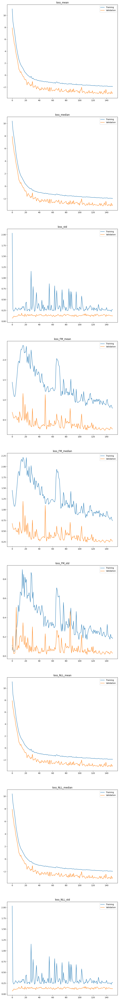

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=6, out_features=195, bias=True)
      (w_2): Linear(in_features=195, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
    

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=6, out_features=195, bias=True)
      (w_2): Linear(in_features=195, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
    

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:37<00:00,  2.01it/s]


{'loss_mean': -3.1473629474639893,
 'loss_median': -3.155045509338379,
 'loss_std': 0.12395612895488739,
 'loss_FM_mean': 0.2910337448120117,
 'loss_FM_median': 0.2852481007575989,
 'loss_FM_std': 0.05282079055905342,
 'loss_NLL_mean': -3.1473629474639893,
 'loss_NLL_median': -3.155045509338379,
 'loss_NLL_std': 0.12395612895488739}

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model"
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM"
)


benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_ig_intercept(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)




params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)

                dist_beta0 = dist.Normal(0, tau_beta0)

                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                beta_0 = pyro.sample("beta0", dist_beta0)

                mean = mean + beta_0

                with pyro.plate("data", len(x)):
                        y = pyro.sample("ob

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:36<00:00,  2.02it/s]


{'loss_mean': -3.132992744445801,
 'loss_median': -3.1314897537231445,
 'loss_std': 0.13763302564620972,
 'loss_FM_mean': 0.29543185234069824,
 'loss_FM_median': 0.28774330019950867,
 'loss_FM_std': 0.05158630385994911,
 'loss_NLL_mean': -3.132992744445801,
 'loss_NLL_median': -3.1314897537231445,
 'loss_NLL_std': 0.13763302564620972}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
str(full_model)

'full_model'

In [ ]:
#str(analytical_solution)

In [ ]:
evaluation = Evaluate(
    posterior_model = full_model_no_FM,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        hmc_sampler,
                        vi_multivariate_normal,
                        vi_diag,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [ ]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:14<23:25, 14.19s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:27<22:46, 13.94s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:41<22:30, 13.92s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:55<22:08, 13.84s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:09<22:04, 13.94s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:23<21:47, 13.91s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:37<21:30, 13.88s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:51<21:15, 13.86s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:05<21:03, 13.89s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:20<21:19, 14.22s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:34<21:04, 14.21s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:48<21:00, 14.32s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:03<20:46, 14.33s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:17<20:36, 14.38s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:31<20:09, 14.23s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:45<19:46, 14.12s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:59<19:32, 14.13s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:13<19:17, 14.11s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:27<18:54, 14.01s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:42<18:54, 14.19s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:55<18:30, 14.05s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:09<18:16, 14.05s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:24<18:11, 14.18s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:38<17:50, 14.08s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:52<17:32, 14.03s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:06<17:18, 14.04s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:20<17:10, 14.11s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:34<16:45, 13.97s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:48<16:47, 14.19s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:02<16:31, 14.16s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:17<16:19, 14.19s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:31<15:59, 14.10s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:45<15:48, 14.16s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:59<15:38, 14.23s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:13<15:15, 14.08s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:27<14:57, 14.02s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:41<14:52, 14.17s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:55<14:36, 14.13s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:09<14:17, 14.06s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:24<14:15, 14.26s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:38<13:59, 14.22s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:52<13:38, 14.11s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:06<13:26, 14.15s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:20<13:07, 14.06s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:34<12:55, 14.11s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:49<12:45, 14.17s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:02<12:25, 14.07s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:17<12:15, 14.14s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:31<12:05, 14.23s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:45<11:45, 14.11s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [12:00<11:37, 14.24s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:13<11:19, 14.15s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:28<11:05, 14.16s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [12:42<10:51, 14.16s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [12:56<10:36, 14.14s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:10<10:23, 14.18s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:25<10:12, 14.24s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [13:38<09:52, 14.11s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [13:53<09:39, 14.13s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:07<09:24, 14.11s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [14:20<09:07, 14.03s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [14:35<08:53, 14.03s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [14:49<08:42, 14.13s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:03<08:26, 14.07s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [15:18<08:19, 14.27s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [15:32<08:07, 14.32s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [15:46<07:50, 14.26s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [16:00<07:37, 14.28s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [16:15<07:23, 14.29s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [16:29<07:06, 14.21s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [16:43<06:52, 14.21s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [16:57<06:37, 14.18s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [17:11<06:23, 14.19s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [17:26<06:10, 14.24s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [17:40<05:54, 14.19s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [17:54<05:39, 14.17s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [18:08<05:28, 14.27s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [18:22<05:11, 14.16s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [18:36<04:54, 14.02s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [18:50<04:40, 14.03s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [19:04<04:25, 13.99s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [19:18<04:13, 14.10s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [19:32<03:59, 14.07s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [19:46<03:43, 13.99s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [20:00<03:29, 13.96s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [20:14<03:17, 14.09s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [20:29<03:04, 14.19s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [20:43<02:50, 14.20s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [20:57<02:36, 14.22s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [21:12<02:22, 14.23s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [21:26<02:08, 14.30s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [21:40<01:53, 14.19s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [21:54<01:38, 14.04s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [22:08<01:24, 14.02s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [22:21<01:09, 13.96s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [22:35<00:55, 13.92s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [22:50<00:42, 14.08s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [23:03<00:27, 13.96s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [23:17<00:13, 13.96s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<20:34, 12.47s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:24<20:20, 12.45s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:37<20:22, 12.60s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:50<20:08, 12.59s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:02<19:29, 12.31s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:15<19:38, 12.53s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:26<19:08, 12.35s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:39<18:59, 12.39s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:52<19:06, 12.60s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:04<18:41, 12.46s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:17<18:31, 12.49s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:30<18:31, 12.63s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:42<18:20, 12.65s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:55<18:09, 12.67s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:08<17:55, 12.65s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:21<17:46, 12.70s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:33<17:35, 12.71s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:46<17:20, 12.69s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:58<16:50, 12.47s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:10<16:30, 12.39s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:23<16:28, 12.51s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:36<16:19, 12.56s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:49<16:28, 12.84s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:02<16:25, 12.97s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:15<16:03, 12.85s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:28<15:49, 12.83s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:40<15:23, 12.65s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:52<15:04, 12.56s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:05<14:48, 12.52s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:17<14:37, 12.53s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:29<14:16, 12.41s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:42<14:04, 12.42s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:54<13:54, 12.46s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:07<13:37, 12.38s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:19<13:35, 12.55s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:32<13:18, 12.47s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:44<13:02, 12.42s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [07:56<12:47, 12.38s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:09<12:38, 12.43s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:21<12:21, 12.36s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:33<12:09, 12.36s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:46<12:02, 12.45s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [08:58<11:46, 12.40s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:10<11:29, 12.31s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:23<11:19, 12.36s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:35<11:08, 12.38s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [09:48<11:02, 12.50s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:01<10:50, 12.51s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:13<10:33, 12.42s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:25<10:18, 12.37s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:38<10:10, 12.45s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [10:50<09:56, 12.43s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:02<09:42, 12.39s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:15<09:34, 12.49s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:28<09:21, 12.48s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:40<09:05, 12.40s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [11:53<08:58, 12.52s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:05<08:43, 12.47s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:17<08:27, 12.37s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:30<08:17, 12.44s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [12:42<08:04, 12.42s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [12:54<07:49, 12.34s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:07<07:42, 12.50s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:19<07:27, 12.44s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:32<07:16, 12.47s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [13:45<07:08, 12.61s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [13:57<06:50, 12.45s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:09<06:38, 12.45s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:22<06:27, 12.51s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:35<06:14, 12.48s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [14:46<05:57, 12.32s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [14:59<05:47, 12.42s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:11<05:33, 12.36s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:24<05:25, 12.53s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [15:37<05:14, 12.58s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [15:49<05:01, 12.55s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:02<04:49, 12.58s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:15<04:39, 12.68s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:28<04:25, 12.65s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [16:40<04:11, 12.55s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [16:52<03:57, 12.51s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:05<03:45, 12.52s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:18<03:33, 12.58s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [17:31<03:25, 12.81s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [17:44<03:12, 12.83s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [17:57<02:59, 12.82s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:10<02:46, 12.84s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:22<02:34, 12.83s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [18:34<02:18, 12.62s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [18:47<02:06, 12.68s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:00<01:53, 12.65s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:13<01:41, 12.68s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:25<01:28, 12.71s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [19:38<01:16, 12.70s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [19:50<01:02, 12.51s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:03<00:50, 12.59s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:15<00:37, 12.49s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [20:28<00:25, 12.57s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [20:41<00:12, 12.64s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<17:43, 10.74s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:21<17:49, 10.91s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:32<17:26, 10.79s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:43<17:30, 10.94s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:54<17:28, 11.03s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:05<17:09, 10.95s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:16<17:02, 10.99s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:27<16:48, 10.96s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:38<16:40, 10.99s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:49<16:20, 10.89s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:00<16:05, 10.85s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:11<16:01, 10.93s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:22<15:57, 11.01s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:33<15:48, 11.03s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:45<15:54, 11.23s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:56<15:39, 11.19s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:07<15:20, 11.09s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:18<15:11, 11.12s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:29<14:54, 11.05s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:39<14:32, 10.91s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:50<14:30, 11.01s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:01<14:12, 10.93s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:12<13:57, 10.87s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:23<13:41, 10.81s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:34<13:44, 11.00s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:46<13:47, 11.18s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:57<13:36, 11.18s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:08<13:31, 11.28s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:20<13:18, 11.25s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:30<12:58, 11.13s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:41<12:42, 11.05s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:52<12:28, 11.01s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:03<12:16, 10.99s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:14<12:08, 11.04s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:25<12:00, 11.08s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:36<11:47, 11.06s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:47<11:35, 11.04s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:58<11:24, 11.04s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [07:10<11:13, 11.05s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:20<10:59, 10.98s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:32<10:52, 11.06s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:43<10:45, 11.13s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:54<10:34, 11.13s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [08:06<10:29, 11.24s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:17<10:19, 11.26s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:28<09:59, 11.11s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:38<09:43, 11.02s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:50<09:36, 11.09s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [09:01<09:23, 11.05s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [09:11<09:08, 10.96s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:23<09:03, 11.10s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:34<08:54, 11.15s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:45<08:38, 11.03s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:56<08:28, 11.06s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [10:07<08:17, 11.05s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [10:18<08:06, 11.07s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:29<07:53, 11.02s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:40<07:46, 11.11s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:51<07:31, 11.02s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [11:02<07:20, 11.00s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [11:13<07:09, 11.00s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:24<06:54, 10.91s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:35<06:44, 10.94s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:46<06:40, 11.12s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:57<06:26, 11.05s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [12:08<06:12, 10.97s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [12:19<06:03, 11.01s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:30<05:54, 11.09s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:41<05:43, 11.08s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:52<05:30, 11.02s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [13:04<05:21, 11.09s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [13:14<05:08, 11.00s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [13:25<04:57, 11.01s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [13:37<04:49, 11.12s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:48<04:35, 11.02s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:58<04:23, 11.00s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [14:10<04:14, 11.06s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [14:21<04:05, 11.16s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [14:32<03:52, 11.07s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:43<03:41, 11.08s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:54<03:31, 11.14s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [15:05<03:19, 11.11s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [15:16<03:08, 11.09s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [15:27<02:57, 11.08s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [15:38<02:45, 11.01s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:49<02:33, 11.00s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [16:00<02:23, 11.04s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [16:12<02:14, 11.17s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [16:23<02:02, 11.10s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [16:34<01:50, 11.03s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [16:45<01:39, 11.02s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:56<01:27, 11.00s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [17:06<01:16, 10.94s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [17:18<01:06, 11.06s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [17:29<00:55, 11.05s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [17:40<00:44, 11.09s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [17:51<00:33, 11.15s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [18:02<00:22, 11.07s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [18:13<00:11, 11.07s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<26:30, 16.06s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:32<26:24, 16.17s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:48<26:11, 16.20s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:04<25:44, 16.08s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:21<25:49, 16.32s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:37<25:38, 16.37s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:54<25:27, 16.42s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:10<24:58, 16.29s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:26<24:31, 16.17s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:42<24:15, 16.17s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:58<24:03, 16.22s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:14<23:44, 16.18s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:30<23:27, 16.18s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:46<23:03, 16.09s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:02<22:39, 15.99s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:18<22:17, 15.93s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:34<22:13, 16.06s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:50<22:03, 16.13s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:07<22:04, 16.35s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:24<21:48, 16.35s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:40<21:29, 16.33s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:56<21:10, 16.29s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:12<20:55, 16.31s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:29<20:40, 16.32s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:45<20:19, 16.27s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:02<20:14, 16.41s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:17<19:43, 16.21s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:34<19:26, 16.19s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:50<19:04, 16.12s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:06<19:02, 16.32s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:22<18:39, 16.22s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:38<18:19, 16.17s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:54<17:59, 16.11s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:11<17:49, 16.20s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:27<17:38, 16.28s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:43<17:20, 16.26s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:00<17:13, 16.40s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:16<16:44, 16.20s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:32<16:28, 16.21s/it]

....................


Sampling posterior:  40%|████      | 40/100 [10:48<16:05, 16.10s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:05<16:06, 16.38s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:21<15:44, 16.29s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:37<15:27, 16.26s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [11:54<15:13, 16.30s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:09<14:47, 16.14s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:26<14:33, 16.17s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:42<14:14, 16.12s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [12:58<13:54, 16.05s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:14<13:37, 16.03s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:30<13:27, 16.15s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [13:46<13:15, 16.23s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:03<13:07, 16.41s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:19<12:48, 16.34s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:36<12:36, 16.45s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [14:53<12:21, 16.48s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:09<11:56, 16.29s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:25<11:44, 16.38s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:42<11:30, 16.44s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [15:58<11:13, 16.42s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:14<10:52, 16.31s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:30<10:29, 16.14s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [16:46<10:09, 16.04s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:01<09:50, 15.95s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:18<09:36, 16.01s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:33<09:17, 15.92s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [17:49<09:00, 15.90s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:05<08:42, 15.83s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:21<08:30, 15.94s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [18:36<08:09, 15.79s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [18:52<07:51, 15.70s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:08<07:37, 15.78s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:24<07:20, 15.74s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [19:40<07:07, 15.83s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [19:56<06:52, 15.86s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:11<06:35, 15.81s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:27<06:18, 15.76s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [20:43<06:04, 15.85s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [20:59<05:47, 15.79s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:14<05:32, 15.83s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [21:30<05:16, 15.82s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [21:46<05:00, 15.82s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:02<04:46, 15.93s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:18<04:29, 15.84s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [22:34<04:12, 15.78s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [22:49<03:56, 15.77s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:05<03:40, 15.76s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:21<03:26, 15.86s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [23:37<03:10, 15.87s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [23:53<02:53, 15.77s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:09<02:38, 15.84s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [24:25<02:22, 15.88s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [24:40<02:06, 15.85s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [24:56<01:50, 15.79s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:12<01:34, 15.76s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [25:28<01:19, 15.95s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [25:44<01:03, 15.83s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:00<00:47, 15.86s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [26:15<00:31, 15.87s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [26:32<00:15, 15.93s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:22<37:42, 22.86s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:45<37:24, 22.91s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [01:08<37:07, 22.96s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:31<36:42, 22.94s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:54<36:17, 22.92s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [02:18<36:11, 23.10s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [02:40<35:43, 23.04s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [03:03<35:05, 22.89s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [03:26<34:53, 23.00s/it]

....................


Sampling posterior:  10%|█         | 10/100 [03:49<34:33, 23.04s/it]

....................


Sampling posterior:  11%|█         | 11/100 [04:12<34:09, 23.03s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [04:35<33:39, 22.95s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [04:58<33:24, 23.05s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [05:21<32:58, 23.01s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [05:44<32:34, 23.00s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [06:07<32:09, 22.97s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [06:30<31:41, 22.91s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [06:54<31:34, 23.10s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [07:17<31:26, 23.29s/it]

....................


Sampling posterior:  20%|██        | 20/100 [07:40<30:45, 23.07s/it]

....................


Sampling posterior:  21%|██        | 21/100 [08:03<30:29, 23.16s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [08:26<30:03, 23.13s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [08:49<29:38, 23.10s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [09:12<29:08, 23.01s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [09:35<28:49, 23.06s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [09:58<28:29, 23.10s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [10:22<28:10, 23.16s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [10:45<27:54, 23.26s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [11:08<27:25, 23.17s/it]

....................


Sampling posterior:  30%|███       | 30/100 [11:32<27:08, 23.26s/it]

....................


Sampling posterior:  31%|███       | 31/100 [11:55<26:48, 23.31s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [12:18<26:20, 23.25s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [12:42<26:01, 23.31s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [13:05<25:39, 23.33s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [13:28<25:09, 23.23s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [13:51<24:34, 23.04s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [14:14<24:08, 22.99s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [14:37<23:50, 23.07s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [15:00<23:38, 23.25s/it]

....................


Sampling posterior:  40%|████      | 40/100 [15:24<23:13, 23.22s/it]

....................


Sampling posterior:  41%|████      | 41/100 [15:46<22:42, 23.09s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [16:10<22:20, 23.12s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [16:32<21:44, 22.89s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [16:55<21:19, 22.86s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [17:18<21:06, 23.03s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [17:41<20:34, 22.85s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [18:04<20:23, 23.09s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [18:28<20:05, 23.19s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [18:51<19:45, 23.25s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [19:14<19:21, 23.23s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [19:37<18:47, 23.00s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [20:00<18:26, 23.05s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [20:23<18:09, 23.18s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [20:47<17:49, 23.26s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [21:10<17:22, 23.17s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [21:33<17:00, 23.18s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [21:56<16:40, 23.26s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [22:20<16:16, 23.25s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [22:43<15:54, 23.27s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [23:06<15:23, 23.10s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [23:29<15:00, 23.09s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [23:51<14:33, 22.99s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [24:14<14:10, 22.99s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [24:37<13:47, 22.99s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [25:01<13:30, 23.16s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [25:24<13:04, 23.08s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [25:47<12:40, 23.04s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [26:10<12:19, 23.11s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [26:33<11:51, 22.95s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [26:56<11:28, 22.95s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [27:19<11:05, 22.96s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [27:42<10:47, 23.11s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [28:05<10:21, 23.00s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [28:28<09:58, 23.04s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [28:51<09:35, 23.03s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [29:13<09:07, 22.83s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [29:36<08:45, 22.85s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [29:59<08:21, 22.81s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [30:22<07:59, 22.83s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [30:44<07:35, 22.78s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [31:08<07:14, 22.86s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [31:31<06:53, 22.97s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [31:54<06:33, 23.17s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [32:17<06:09, 23.08s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [32:41<05:49, 23.28s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [33:04<05:25, 23.26s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [33:28<05:02, 23.27s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [33:50<04:37, 23.15s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [34:13<04:14, 23.10s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [34:37<03:51, 23.15s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [35:00<03:28, 23.14s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [35:23<03:05, 23.23s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [35:46<02:41, 23.05s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [36:09<02:18, 23.01s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [36:32<01:54, 23.00s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [36:55<01:32, 23.04s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [37:18<01:08, 22.95s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [37:41<00:46, 23.07s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [38:04<00:23, 23.10s/it]

....................


  0%|          | 0/100 [00:00<?, ?it/s]/content/PFNExperiments/Evaluation/CompareModelToGT.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y, dtype = torch.float32)
  1%|          | 1/100 [00:00<00:34,  2.91it/s]/content/PFNExperiments/Evaluation/CompareModelToGT.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y, dtype = torch.float32)
  2%|▏         | 2/100 [00:00<00:32,  3.01it/s]/content/PFNExperiments/Evaluation/CompareModelToGT.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.

An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

Streaming output truncated to the last 5000 lines.
  y = torch.tensor(y, dtype = torch.float32)
 97%|█████████▋| 97/100 [04:38<00:08,  2.86s/it]/content/PFNExperiments/Evaluation/CompareModelToGT.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y, dtype = torch.float32)
 98%|█████████▊| 98/100 [04:41<00:05,  2.87s/it]/content/PFNExperiments/Evaluation/CompareModelToGT.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(y, dtype = torch.float32)
 99%|█████████▉| 99/100 [04:44<00:02,  2.87s/it]/content/PFNExperiments/Evaluation/CompareModelToGT.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() 

Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model_no_FM,gt,28.348334,0.047084,0.52010,2.856299,0.199507,0.188958,0.009159,0.000070,0.032868,4.157366,0.216695,0.202610
1,Hamiltonian Monte Carlo,gt,28.350257,0.047042,0.51340,5.138118,0.168597,0.171962,0.010971,0.000065,0.028086,5.449481,0.204497,0.207494
2,Variational Inference with guide: AutoMultivar...,gt,28.363871,0.047177,0.51175,-15.253526,0.218000,0.215110,0.010001,0.000056,0.030146,173.518656,0.272559,0.268407
3,Variational Inference with guide: AutoDiagonal...,gt,28.360599,0.047190,0.51300,-391.659594,0.223329,0.214286,0.008604,0.000061,0.030600,2343.076096,0.278592,0.269305
4,Variational Inference with guide: AutoLaplaceA...,gt,28.333925,0.047198,0.52220,NaN,NaN,0.211795,0.000000,0.000000,0.030611,NaN,NaN,0.265564
5,Variational Inference with guide: AutoIAFNorma...,gt,28.442279,0.048809,0.52735,-203.018590,0.420629,0.415915,0.010214,0.000091,0.033960,716.184473,0.404371,0.390461
6,Variational Inference with guide: AutoStructur...,gt,28.361310,0.047175,0.51570,-36.127631,0.219763,0.213618,0.010286,0.000060,0.033792,366.131936,0.276493,0.269039


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model_no_FM,Hamiltonian Monte Carlo,1.901952e-01,6.995368e-05,0.185840,1.772906e-13,9.356345e-09,3.769589e-08
1,full_model_no_FM,Variational Inference with guide: AutoMultivar...,1.415263e-14,5.557009e-15,0.080660,6.737133e-02,1.317394e-02,1.448820e-01
2,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,2.912819e-14,1.822066e-15,0.233599,8.743284e-01,5.001389e-02,7.159542e-02
3,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,2.142660e-17,4.671055e-17,0.533190,NaN,NaN,3.388425e-02
4,full_model_no_FM,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,3.896120e-18,0.296620,7.950279e-09,2.447540e-08,9.548510e-10
5,full_model_no_FM,Variational Inference with guide: AutoStructur...,3.601536e-14,7.558703e-13,0.386677,6.840763e-02,1.639728e-02,6.584112e-02
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,2.612419e-11,1.070356e-16,0.656489,8.571187e-10,6.811280e-04,4.462176e-03
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,2.885352e-09,1.960447e-17,0.824709,1.969585e-07,8.213730e-04,8.311065e-02
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,2.411480e-17,5.267140e-18,0.058079,NaN,NaN,1.046131e-01
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,3.896120e-18,0.005977,1.676999e-15,7.929789e-14,1.597421e-12



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,full_model_no_FM,Hamiltonian Monte Carlo,0.360885,0.670233,0.819715,0.241935,0.560074,0.124216
1,full_model_no_FM,Variational Inference with guide: AutoMultivar...,0.569024,0.882402,0.835385,0.933379,0.995651,0.116224
2,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.631725,1.112170,0.868005,0.947378,1.034755,0.116461
3,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,0.847504,2.534524,1.000000,1.012642,1.027578,0.000000
4,full_model_no_FM,Variational Inference with guide: AutoIAFNorma...,1.518152,2.203981,0.904965,1.624282,2.035374,0.110873
5,full_model_no_FM,Variational Inference with guide: AutoStructur...,0.567321,0.880398,0.836560,0.926213,0.975482,0.111472
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,0.465615,0.517892,0.689140,0.978133,1.132003,0.128378
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.522679,0.721939,0.739825,0.982021,1.216220,0.157406
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,0.697484,2.417868,1.000000,1.059478,1.322368,0.000000
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,1.522092,2.350027,0.878960,1.679108,2.249760,0.148890


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoMultivar...,7.668796e-02,1.678044e-01,4.740413e-01
1,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.144433e-02,3.975691e-04,2.349684e-03
2,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,1.198271e-10,1.449043e-33,5.639186e-39
3,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoIAFNorma...,7.807719e-10,1.524124e-07,5.898142e-08
4,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoStructur...,9.490822e-02,1.403241e-01,4.458556e-01
...,...,...,...,...,...,...,...
100,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,2.799516e-05,2.562144e-34,5.639186e-39
101,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,2.201629e-12,2.041520e-13,1.822075e-15
102,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,1.906456e-10,4.188445e-12,1.000000e+00
103,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,8.386322e-02,2.666436e-06,2.017111e-22


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                   full_model_no_FM  gt   
  1                            Hamiltonian Monte Carlo  gt   
  2  Variational Inference with guide: AutoMultivar...  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          28.348334            0.047084   
  1                                          28.350257            0.047042   
  2                                          28.363871            0.047177   
  3                                          28.360599            0.047190   
  4                                          28.333925            0.0

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

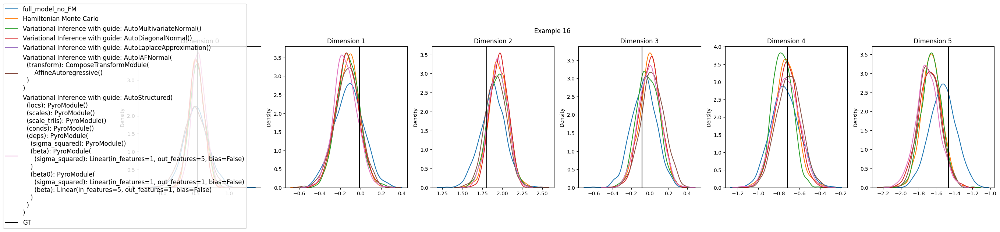

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

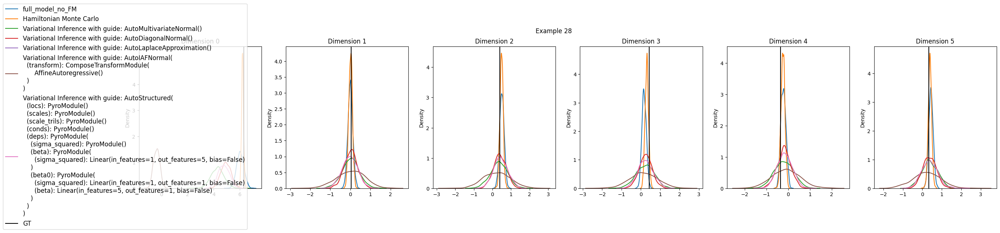

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

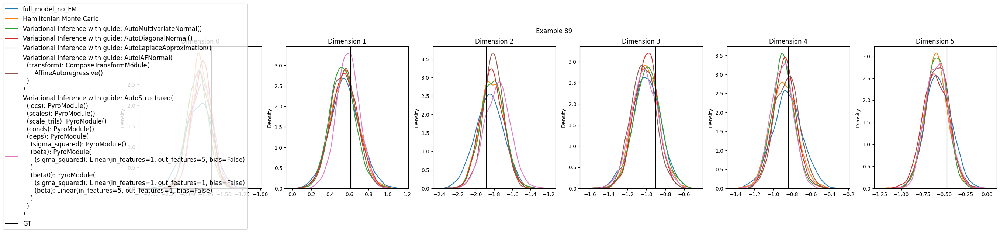

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

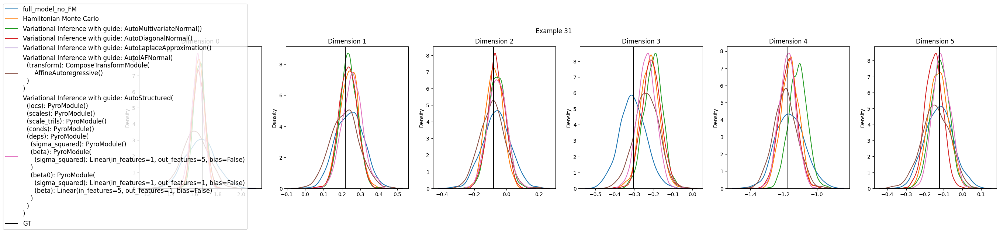

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

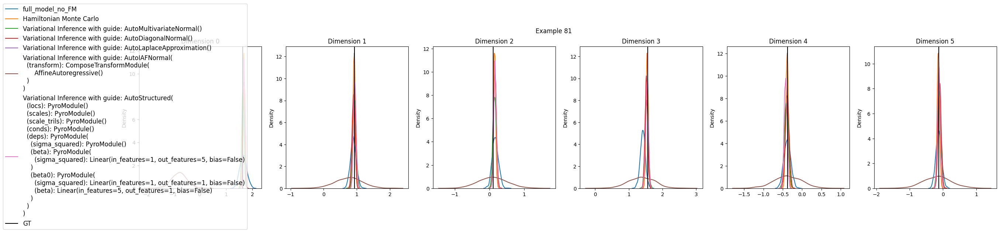

In [ ]:
evaluation.plot_results()